##### Author  : SIVA VIKNESH & YOUNES TATARI
##### Email   : siva.viknesh@sci.utah.edu / sivaviknesh14@gmail.com , younes.tatari@utah.edu/ younes.tatari@gmail.com
##### Address : SCI INSTITUTE, UNIVERSITY OF UTAH, SALT LAKE CITY, UTAH, USA

In [1]:
import os
import torch
import math
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.ticker as plticker
from mpl_toolkits.mplot3d import Axes3D
from scipy import integrate

rcParams.update({'font.size': 18})
plt.rcParams['figure.figsize'] = [12, 12]


Combustion:  <br>
Paper: Symbolic regression via neural networks :
\
Chemical kinetics with Arrhenius rate dependence


$$
\dot{\alpha} = -k \alpha  e^{\theta} + \mu
$$

$$
\dot{\theta} = \alpha e^{\theta} - \theta
$$

Parameters: \\(k\\), \\(\mu\\)

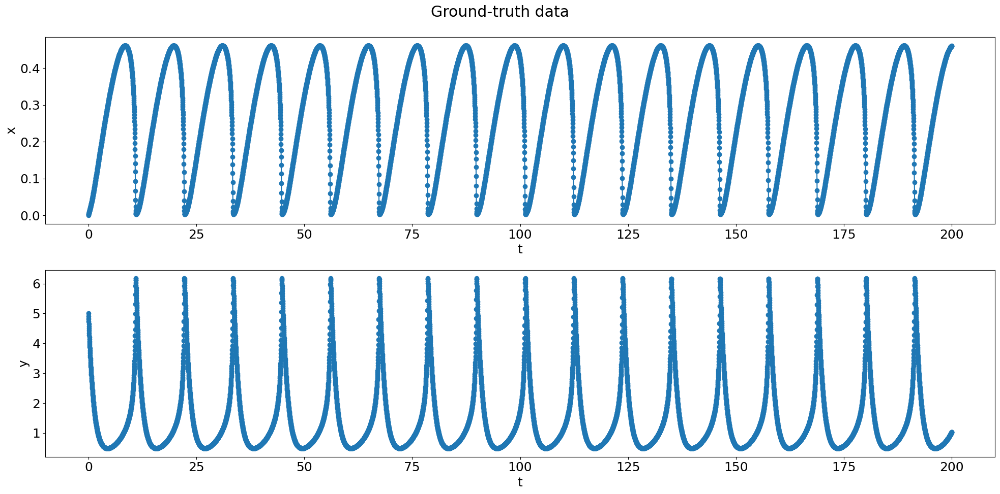

In [2]:
k  = 0.07
mu = 0.1
a  = 1.015
b  = 1.025

def oscillator_deriv(x_y, t0, a =a, b =b,  k=k, mu =mu):
    x, y = x_y
    dxdt = -k*x*np.exp(a*y) + mu
    dydt = x*np.exp(b*y) - y
    return [dxdt, dydt]

np.random.seed(123)
x0 = (0.0,5.0)

# Time points
t = np.linspace(0, 200, 10000)

x_t = integrate.odeint(oscillator_deriv, x0, t, rtol=10**(-12),atol=10**(-12)*np.ones_like(x0))
x, y = x_t.T

fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize =(20, 10))
fig.suptitle('Ground-truth data')

ax[0].plot(t, x, '-o')
#ax[0].set_title('$x$')
ax[0].set(xlabel="t",ylabel="x")

ax[1].plot(t, y, '-o')
#ax[1].set_title('$y$')
ax[1].set(xlabel="t",ylabel="y")

fig.tight_layout()
plt.show()

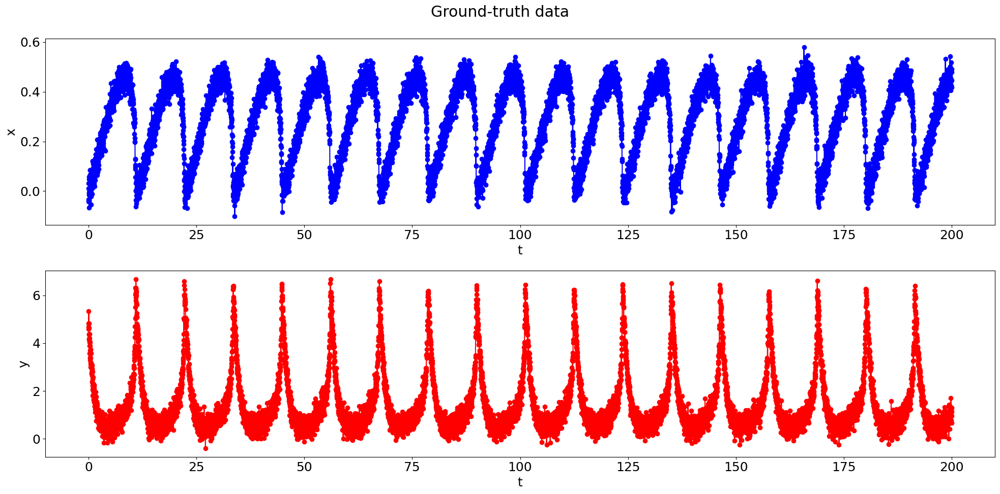

In [3]:
# ADDING ARTIFICAL NOISE TO THE DATA
std_percent = 0.20                                  # STANDARD DEVIATION (INTENSITY OF NOISE)

x_noise = np.random.normal(0, np.std(x), x.shape)*std_percent
y_noise = np.random.normal(0, np.std(y), y.shape)*std_percent

x += x_noise
y += y_noise

fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize =(20, 10))
fig.suptitle('Ground-truth data')

ax[0].plot(t, x, '-o',color='blue')
#ax[0].set_title('$x$')
ax[0].set(xlabel="t",ylabel="x")

ax[1].plot(t, y, '-o',color='red')
#ax[1].set_title('$y$')
ax[1].set(xlabel="t",ylabel="y")

fig.tight_layout()
plt.show()

In [4]:
# COMPUTING THE COMBINATIONS AMONG THE THREE CHOSEN TEMPORAL MODES

def POOL_DATA(yin, nVars, polyorder):
    n = yin.shape[0]
    yout = torch.zeros((n, 1)).to(processor)

    # poly order 0
    yout[:, 0] = torch.ones(n)

    # poly order 1
    for i in range(nVars):
        yout = torch.cat((yout, yin[:, i].reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 2
    if polyorder >= 2:
        for i in range(nVars):
            for j in range(i, nVars):
                yout = torch.cat((yout, (yin[:, i] * yin[:, j]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 3
    #if polyorder >= 3:
        #for i in range(nVars):
            #for j in range(i, nVars):
                #for k in range(j, nVars):
                    #yout = torch.cat((yout, (yin[:, i] * yin[:, j] * yin[:, k]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    return yout

def DERIVATIVE(x, y, k, a, b, mu):
    dxdt = -k*x*torch.exp(a*y) + mu
    dydt = x*torch.exp(b*y) - y
    return torch.vstack((dxdt, dydt)).T


AVAILABLE PROCESSOR: cuda 



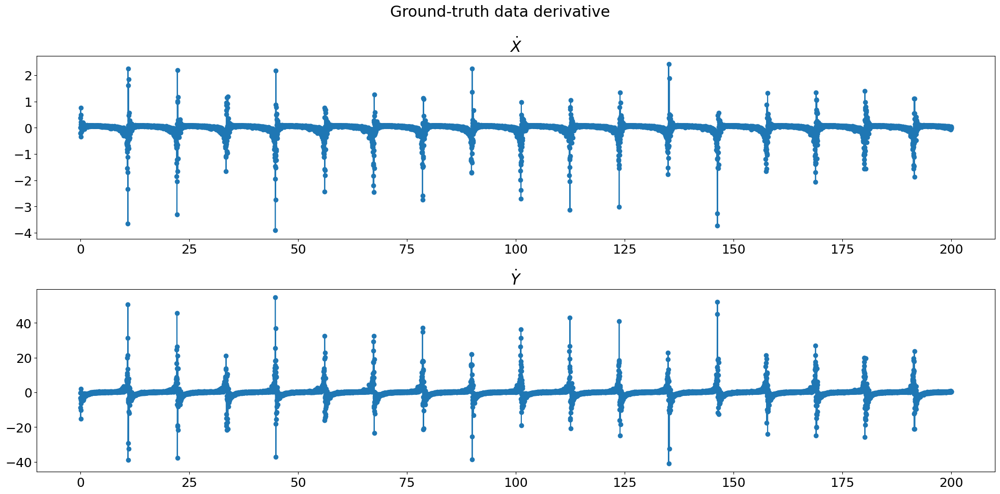

In [5]:
processor = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("AVAILABLE PROCESSOR:", processor, '\n')

N_modes  = 2
x_t      = torch.Tensor(x_t).to(processor)
x        = torch.Tensor(x).to(processor)
y        = torch.Tensor(y).to(processor)
t        = torch.Tensor(t).to(processor)

A_candidates = POOL_DATA (x_t, 2, 1).to(processor)
A1A2_time_deriv = DERIVATIVE (x, y, k, a, b, mu).to(processor)

# HYPERPARAMETERS FOR THE SINDy POD METHODOLOGY
Epochs        = 50000
learning_rate = 1e-2
step_epoch    = 5000
decay_rate    = 0.50


fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize =(20, 10))
fig.suptitle('Ground-truth data derivative')

ax[0].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 0].detach().cpu().numpy(), '-o')
ax[0].set_title(r"$\dot{X}$")

ax[1].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 1].detach().cpu().numpy(), '-o')
ax[1].set_title(r"$\dot{Y}$")

fig.tight_layout()
plt.show()

In [6]:
class SINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.sin(self.b*x)
        return output

class COSINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.cos(self.b*x)
        return output

class POWER_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.sign(x) * torch.pow(torch.abs(x), self.b)
        return output

class EXP_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.exp(self.b*x)
        return output


In [7]:
class ADAPTIVE_SINDy_MODEL(nn.Module):
    def __init__(self, a, aexp, axexp):
        super().__init__()
        self.a       = a
        self.aexp    = aexp
        self.axexp   = axexp
    
        self.exp     = EXP_TERM    (self.aexp)
        self.axexp   = EXP_TERM    (self.axexp)

    def forward(self, x):
        x1           = x [:, 1:]
        output_exp   = self.exp   (x1)
        output_xexp  = self.axexp (x1)

        output_xexp  = (output_xexp  [:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        output       = torch.hstack((x, output_exp, output_xexp )) @ self.a

        return output


In [8]:
# AMPLITUDE COEFFICIENTS OF SINDy MODEL
COEFF_ADT  = torch.ones(9, N_modes, requires_grad= True, device= processor)

EXP_ADT    = torch.full((A_candidates.shape[1]-1, N_modes), 2.0, requires_grad= True, device= processor)
XEXP_ADT   = torch.full((A_candidates.shape[1]-1, N_modes), 2.0, requires_grad= True, device= processor)

In [9]:
# COEFFICIENTS OF SINDy MODEL
optim_COEFF_ADT = optim.Adam([COEFF_ADT, EXP_ADT, XEXP_ADT], lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)


# WEIGHT FUNCTION OF SINDy MODEL
WEIGHTS  = Parameter(torch.ones_like(COEFF_ADT), requires_grad= True)
Lambda   = Parameter(torch.tensor(1.0), requires_grad= True)

optim_weights = optim.Adam([WEIGHTS], lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)
optim_Lambda  = optim.Adam([Lambda],  lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)


# STEP DECAY DYNAMIC LEARNING RATE
scheduler_ADT     = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT, step_size=step_epoch, gamma=decay_rate)
scheduler_weights = torch.optim.lr_scheduler.StepLR(optim_weights,   step_size=step_epoch, gamma=decay_rate)
scheduler_LAMBDA  = torch.optim.lr_scheduler.StepLR(optim_Lambda,    step_size=step_epoch, gamma=decay_rate)



**Adaptive SINDy training**

In [10]:
# TEMPORAL MODE 1
A1_DT = ADAPTIVE_SINDy_MODEL(COEFF_ADT [:, 0], EXP_ADT[:, 0] , XEXP_ADT[:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = ADAPTIVE_SINDy_MODEL(COEFF_ADT [:, 1], EXP_ADT[:, 1] , XEXP_ADT[:, 1]).to(processor)

Loss_data     = torch.empty(size=(Epochs, 1))
loss_function = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out  = A1_DT (A_candidates), A2_DT (A_candidates)
    output_data  = torch.stack((A1_out , A2_out), dim = 1)
    loss_epoch   = loss_function (A1A2_time_deriv, output_data) + torch.linalg.matrix_norm(torch.abs(WEIGHTS)*COEFF_ADT, ord =1)

    optim_COEFF_ADT.zero_grad()
    optim_Lambda.zero_grad()
    optim_weights.zero_grad()
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT.step()
        optim_Lambda.step()
        optim_weights.step()
        Loss_data [epoch] = loss_epoch.detach()
        COEFF_ADT [torch.abs(COEFF_ADT) <= 1e-3] = 0.0

    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT.param_groups[0]['lr'])
    print ("*"*85)

    scheduler_ADT.step()
    scheduler_LAMBDA.step()
    scheduler_weights.step()

LOSS DATA, [EPOCH = 0 ]: 49159602176.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 42501029888.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 36770435072.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 31852881920.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 27642466304.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 24043110400.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 20968853504.0
LEARNING RATE: 0.01
***********************************************************************

LOSS DATA, [EPOCH = 70 ]: 793648768.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 71 ]: 780892800.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 72 ]: 768497728.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 73 ]: 756445568.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 74 ]: 744719744.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 75 ]: 733303680.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 76 ]: 722183232.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 139 ]: 329995296.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 140 ]: 326497248.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 141 ]: 323049216.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 142 ]: 319650016.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 143 ]: 316298752.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 144 ]: 312994752.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 145 ]: 309736736.0
LEARNING RATE: 0.01
***********************************************************************

LOSS DATA, [EPOCH = 209 ]: 169002640.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 210 ]: 167545616.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 211 ]: 166104288.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 212 ]: 164678752.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 213 ]: 163268496.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 214 ]: 161873648.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 215 ]: 160493712.0
LEARNING RATE: 0.01
***********************************************************************

LOSS DATA, [EPOCH = 278 ]: 96653264.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 279 ]: 95918840.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 280 ]: 95191008.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 281 ]: 94469752.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 282 ]: 93754960.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 283 ]: 93046448.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 284 ]: 92344288.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 350 ]: 57079488.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 351 ]: 56677964.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 352 ]: 56279628.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 353 ]: 55884320.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 354 ]: 55492148.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 355 ]: 55102968.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 356 ]: 54716800.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 423 ]: 34467428.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 424 ]: 34233832.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 425 ]: 34001860.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 426 ]: 33771520.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 427 ]: 33542786.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 428 ]: 33315686.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 429 ]: 33090168.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 490 ]: 21898722.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 491 ]: 21751028.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 492 ]: 21604290.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 493 ]: 21458528.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 494 ]: 21313740.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 495 ]: 21169914.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 496 ]: 21027022.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 559 ]: 13674604.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 560 ]: 13580377.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 561 ]: 13486761.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 562 ]: 13393749.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 563 ]: 13301321.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 564 ]: 13209491.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 565 ]: 13118236.0
LEARNING RATE: 0.01
******************************************************************************

LOSS DATA, [EPOCH = 628 ]: 8397984.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 629 ]: 8337236.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 630 ]: 8276874.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 631 ]: 8216897.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 632 ]: 8157293.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 633 ]: 8098068.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 634 ]: 8039221.5
LEARNING RATE: 0.01
*************************************************************************************

LOSS DATA, [EPOCH = 692 ]: 5193706.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 693 ]: 5153309.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 694 ]: 5113165.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 695 ]: 5073280.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 696 ]: 5033651.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 697 ]: 4994279.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 698 ]: 4955160.0
LEARNING RATE: 0.01
*************************************************************************************

LOSS DATA, [EPOCH = 758 ]: 3019502.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 759 ]: 2993323.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 760 ]: 2967321.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 761 ]: 2941494.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 762 ]: 2915842.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 763 ]: 2890365.5
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 764 ]: 2865061.5
LEARNING RATE: 0.01
***********************************************************************************

LOSS DATA, [EPOCH = 824 ]: 1628968.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 825 ]: 1612562.25
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 826 ]: 1596278.375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 827 ]: 1580117.625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 828 ]: 1564077.125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 829 ]: 1548156.625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 830 ]: 1532357.0
LEARNING RATE: 0.01
****************************************************************************

LOSS DATA, [EPOCH = 895 ]: 733791.375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 896 ]: 724618.25
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 897 ]: 715528.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 898 ]: 706520.0625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 899 ]: 697594.125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 900 ]: 688749.75
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 901 ]: 679987.25
LEARNING RATE: 0.01
**********************************************************************************

LOSS DATA, [EPOCH = 959 ]: 295677.59375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 960 ]: 290940.65625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 961 ]: 286259.46875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 962 ]: 281634.03125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 963 ]: 277063.5625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 964 ]: 272548.0
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 965 ]: 268086.625
LEARNING RATE: 0.01
***********************************************************************

LOSS DATA, [EPOCH = 1027 ]: 81828.4296875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1028 ]: 80032.5859375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1029 ]: 78267.421875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1030 ]: 76532.6875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1031 ]: 74827.9453125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1032 ]: 73152.8984375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1033 ]: 71507.1484375
LEARNING RATE: 0.01
******************************************************

LOSS DATA, [EPOCH = 1092 ]: 14898.8154296875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1093 ]: 14447.79296875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1094 ]: 14008.3603515625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1095 ]: 13580.2939453125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1096 ]: 13163.3828125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1097 ]: 12757.40625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1098 ]: 12362.115234375
LEARNING RATE: 0.01
****************************************

LOSS DATA, [EPOCH = 1163 ]: 1398.297119140625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1164 ]: 1358.97802734375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1165 ]: 1321.0218505859375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1166 ]: 1284.359130859375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1167 ]: 1248.944091796875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1168 ]: 1214.77734375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1169 ]: 1181.8115234375
LEARNING RATE: 0.01
****************************

LOSS DATA, [EPOCH = 1233 ]: 407.4976806640625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1234 ]: 405.02056884765625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1235 ]: 402.6148681640625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1236 ]: 400.3309326171875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1237 ]: 398.1261901855469
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1238 ]: 395.9871826171875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1239 ]: 393.9347839355469
LEARNING RATE: 0.01
*********************

LOSS DATA, [EPOCH = 1303 ]: 327.58978271484375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1304 ]: 326.8734436035156
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1305 ]: 326.1746520996094
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1306 ]: 325.4766540527344
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1307 ]: 324.771484375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1308 ]: 324.085205078125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1309 ]: 323.3892822265625
LEARNING RATE: 0.01
**************************

LOSS DATA, [EPOCH = 1368 ]: 285.17340087890625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1369 ]: 284.5511474609375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1370 ]: 283.9313659667969
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1371 ]: 283.316162109375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1372 ]: 282.7286071777344
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1373 ]: 282.129638671875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1374 ]: 281.5133972167969
LEARNING RATE: 0.01
***********************

LOSS DATA, [EPOCH = 1436 ]: 245.4842987060547
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1437 ]: 244.92237854003906
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1438 ]: 244.35882568359375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1439 ]: 243.81878662109375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1440 ]: 243.24989318847656
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1441 ]: 242.69427490234375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1442 ]: 242.1226348876953
LEARNING RATE: 0.01
*****************

LOSS DATA, [EPOCH = 1505 ]: 208.10574340820312
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1506 ]: 207.5585174560547
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1507 ]: 207.0518798828125
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1508 ]: 206.5203399658203
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1509 ]: 205.97132873535156
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1510 ]: 205.46995544433594
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1511 ]: 204.9485626220703
LEARNING RATE: 0.01
*******************

LOSS DATA, [EPOCH = 1570 ]: 174.69723510742188
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1571 ]: 174.19078063964844
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1572 ]: 173.70652770996094
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1573 ]: 173.21180725097656
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1574 ]: 172.7187042236328
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1575 ]: 172.2158660888672
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1576 ]: 171.7187042236328
LEARNING RATE: 0.01
******************

LOSS DATA, [EPOCH = 1639 ]: 141.3395538330078
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1640 ]: 140.88597106933594
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1641 ]: 140.4178466796875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1642 ]: 139.96237182617188
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1643 ]: 139.51129150390625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1644 ]: 139.0382537841797
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1645 ]: 138.5928955078125
LEARNING RATE: 0.01
*******************

LOSS DATA, [EPOCH = 1707 ]: 111.0749740600586
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1708 ]: 110.60806274414062
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1709 ]: 110.17724609375
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1710 ]: 109.81681060791016
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1711 ]: 109.4223403930664
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1712 ]: 108.99710845947266
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1713 ]: 108.55992126464844
LEARNING RATE: 0.01
********************

LOSS DATA, [EPOCH = 1778 ]: 120.77302551269531
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1779 ]: 120.19607543945312
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1780 ]: 119.59170532226562
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1781 ]: 118.97288513183594
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1782 ]: 118.35087585449219
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1783 ]: 117.70613098144531
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1784 ]: 117.10509490966797
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 1850 ]: 75.97935485839844
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1851 ]: 75.28805541992188
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1852 ]: 74.60071563720703
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1853 ]: 73.93063354492188
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1854 ]: 73.26033020019531
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1855 ]: 72.60118103027344
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1856 ]: 71.95262908935547
LEARNING RATE: 0.01
**********************

LOSS DATA, [EPOCH = 1920 ]: 41.2757682800293
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1921 ]: 40.95174026489258
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1922 ]: 40.60414505004883
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1923 ]: 40.26374816894531
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1924 ]: 39.92331314086914
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1925 ]: 39.59687042236328
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1926 ]: 39.278656005859375
LEARNING RATE: 0.01
**********************

LOSS DATA, [EPOCH = 1987 ]: 24.54660415649414
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1988 ]: 24.372936248779297
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1989 ]: 24.179784774780273
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1990 ]: 23.987468719482422
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1991 ]: 23.81589126586914
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1992 ]: 23.643163681030273
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 1993 ]: 23.475650787353516
LEARNING RATE: 0.01
*****************

LOSS DATA, [EPOCH = 2058 ]: 14.57846736907959
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2059 ]: 14.453527450561523
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2060 ]: 14.344559669494629
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2061 ]: 14.2489013671875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2062 ]: 14.150811195373535
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2063 ]: 14.034446716308594
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2064 ]: 13.92309856414795
LEARNING RATE: 0.01
*******************

LOSS DATA, [EPOCH = 2128 ]: 8.60727596282959
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2129 ]: 8.543846130371094
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2130 ]: 8.48294734954834
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2131 ]: 8.423144340515137
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2132 ]: 8.352124214172363
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2133 ]: 8.279541015625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2134 ]: 8.229837417602539
LEARNING RATE: 0.01
***************************

LOSS DATA, [EPOCH = 2198 ]: 4.972087860107422
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2199 ]: 4.9409356117248535
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2200 ]: 4.904009819030762
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2201 ]: 4.864712238311768
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2202 ]: 4.82066535949707
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2203 ]: 4.777328968048096
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2204 ]: 4.737654685974121
LEARNING RATE: 0.01
**********************

LOSS DATA, [EPOCH = 2268 ]: 2.7371113300323486
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2269 ]: 2.7105536460876465
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2270 ]: 2.6892592906951904
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2271 ]: 2.659291982650757
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2272 ]: 2.6423356533050537
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2273 ]: 2.616194486618042
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2274 ]: 2.5981099605560303
LEARNING RATE: 0.01
*****************

LOSS DATA, [EPOCH = 2340 ]: 1.4055792093276978
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2341 ]: 1.3926366567611694
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2342 ]: 1.3877297639846802
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2343 ]: 1.3789303302764893
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2344 ]: 1.3643543720245361
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2345 ]: 1.351000428199768
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2346 ]: 1.3322094678878784
LEARNING RATE: 0.01
****************

LOSS DATA, [EPOCH = 2410 ]: 0.7865719199180603
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2411 ]: 0.7756828665733337
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2412 ]: 0.7794280648231506
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2413 ]: 0.7734459638595581
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2414 ]: 0.7740424275398254
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2415 ]: 0.7689760327339172
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2416 ]: 0.7599303126335144
LEARNING RATE: 0.01
***************

LOSS DATA, [EPOCH = 2470 ]: 0.5676275491714478
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2471 ]: 0.5642930269241333
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2472 ]: 0.5615440011024475
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2473 ]: 0.557756781578064
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2474 ]: 0.559259831905365
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2475 ]: 0.5573447942733765
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2476 ]: 0.5601041316986084
LEARNING RATE: 0.01
*****************

LOSS DATA, [EPOCH = 2535 ]: 0.48522239923477173
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2536 ]: 0.49357491731643677
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2537 ]: 0.48840469121932983
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2538 ]: 0.4839209318161011
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2539 ]: 0.47905007004737854
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2540 ]: 0.4666668772697449
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2541 ]: 0.473522812128067
LEARNING RATE: 0.01
************

LOSS DATA, [EPOCH = 2606 ]: 0.4228712022304535
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2607 ]: 0.4195845127105713
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2608 ]: 0.4203595221042633
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2609 ]: 0.41998445987701416
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2610 ]: 0.4216997027397156
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2611 ]: 0.41542601585388184
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2612 ]: 0.41723740100860596
LEARNING RATE: 0.01
************

LOSS DATA, [EPOCH = 2678 ]: 0.40458184480667114
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2679 ]: 0.40688180923461914
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2680 ]: 0.40789443254470825
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2681 ]: 0.3984134793281555
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2682 ]: 0.4046720266342163
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2683 ]: 0.40774020552635193
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2684 ]: 0.406804621219635
LEARNING RATE: 0.01
************

LOSS DATA, [EPOCH = 2747 ]: 3.7041165828704834
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2748 ]: 36.006961822509766
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2749 ]: 3.1008732318878174
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2750 ]: 5.4442315101623535
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2751 ]: 4.111871719360352
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2752 ]: 34.595947265625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2753 ]: 2.713334321975708
LEARNING RATE: 0.01
********************

LOSS DATA, [EPOCH = 2816 ]: 0.40449634194374084
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2817 ]: 0.4000280201435089
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2818 ]: 0.3950542211532593
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2819 ]: 0.388993501663208
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2820 ]: 0.38529178500175476
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2821 ]: 0.38260796666145325
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2822 ]: 0.3789869248867035
LEARNING RATE: 0.01
*************

LOSS DATA, [EPOCH = 2890 ]: 2.4098923206329346
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2891 ]: 4.194311141967773
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2892 ]: 3.2750144004821777
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2893 ]: 24.294239044189453
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2894 ]: 1.889945387840271
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2895 ]: 3.2072997093200684
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2896 ]: 2.5446152687072754
LEARNING RATE: 0.01
*****************

LOSS DATA, [EPOCH = 2964 ]: 0.3612213134765625
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2965 ]: 0.35296326875686646
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2966 ]: 0.35809919238090515
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2967 ]: 0.3611765205860138
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2968 ]: 20.471473693847656
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2969 ]: 2.139861583709717
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 2970 ]: 3.71067214012146
LEARNING RATE: 0.01
****************

LOSS DATA, [EPOCH = 3036 ]: 0.3376638889312744
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3037 ]: 0.329618364572525
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3038 ]: 0.3322072923183441
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3039 ]: 0.3319219946861267
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3040 ]: 0.3287662863731384
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3041 ]: 0.331942617893219
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3042 ]: 0.3367822766304016
LEARNING RATE: 0.01
*****************

LOSS DATA, [EPOCH = 3108 ]: 0.3121744394302368
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3109 ]: 0.32830020785331726
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3110 ]: 0.3285543620586395
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3111 ]: 0.3129411041736603
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3112 ]: 19.19400978088379
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3113 ]: 1.9569108486175537
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3114 ]: 3.471463203430176
LEARNING RATE: 0.01
****************

LOSS DATA, [EPOCH = 3180 ]: 39.329368591308594
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3181 ]: 2.309781074523926
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3182 ]: 4.515130996704102
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3183 ]: 3.975250005722046
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3184 ]: 14.234644889831543
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3185 ]: 3.195563316345215
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3186 ]: 2.95623779296875
LEARNING RATE: 0.01
*********************

LOSS DATA, [EPOCH = 3301 ]: 4.617183208465576
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3302 ]: 2.862375020980835
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3303 ]: 56.43385314941406
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3304 ]: 64.06271362304688
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3305 ]: 1.4136210680007935
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3306 ]: 90.52812194824219
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3307 ]: 4.576862812042236
LEARNING RATE: 0.01
*********************

LOSS DATA, [EPOCH = 3372 ]: 0.22708095610141754
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3373 ]: 0.22601966559886932
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3374 ]: 0.22560898959636688
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3375 ]: 0.228874072432518
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3376 ]: 0.2297917604446411
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3377 ]: 0.22777199745178223
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3378 ]: 0.2280409038066864
LEARNING RATE: 0.01
************

LOSS DATA, [EPOCH = 3443 ]: 0.22895552217960358
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3444 ]: 0.22710290551185608
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3445 ]: 0.22159017622470856
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3446 ]: 0.2262418270111084
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3447 ]: 0.22728782892227173
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3448 ]: 0.22086431086063385
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3449 ]: 0.21833188831806183
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 3514 ]: 0.23191849887371063
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3515 ]: 0.24135804176330566
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3516 ]: 0.23570606112480164
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3517 ]: 0.22886253893375397
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3518 ]: 0.2191912978887558
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3519 ]: 0.21601298451423645
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3520 ]: 0.2230626344680786
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 3585 ]: 0.20094142854213715
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3586 ]: 0.20190708339214325
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3587 ]: 0.19780707359313965
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3588 ]: 0.18969519436359406
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3589 ]: 0.19895416498184204
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3590 ]: 0.1949307769536972
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3591 ]: 0.2088184654712677
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 3656 ]: 0.18236568570137024
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3657 ]: 0.1907704472541809
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3658 ]: 0.18923288583755493
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3659 ]: 0.18345102667808533
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3660 ]: 0.1809408962726593
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3661 ]: 0.18127460777759552
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3662 ]: 0.18117372691631317
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 3729 ]: 2.2105913162231445
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3730 ]: 1.8606523275375366
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3731 ]: 8.57262134552002
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3732 ]: 1.634305715560913
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3733 ]: 1.6896122694015503
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3734 ]: 0.8794304728507996
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3735 ]: 15.196435928344727
LEARNING RATE: 0.01
******************

LOSS DATA, [EPOCH = 3800 ]: 0.15265613794326782
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3801 ]: 0.15246093273162842
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3802 ]: 0.1495523303747177
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3803 ]: 0.14838719367980957
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3804 ]: 0.1487700492143631
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3805 ]: 0.1491340845823288
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3806 ]: 0.1517762541770935
LEARNING RATE: 0.01
************

LOSS DATA, [EPOCH = 3872 ]: 0.14855903387069702
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3873 ]: 0.14994174242019653
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3874 ]: 0.15104061365127563
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3875 ]: 0.14391091465950012
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3876 ]: 0.14879949390888214
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3877 ]: 0.1431025266647339
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3878 ]: 0.14211690425872803
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 3943 ]: 0.11851461976766586
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3944 ]: 0.1315595954656601
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3945 ]: 0.13312165439128876
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3946 ]: 0.12650009989738464
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3947 ]: 0.11964380741119385
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3948 ]: 0.12566795945167542
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 3949 ]: 0.13228370249271393
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 4011 ]: 0.11115002632141113
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4012 ]: 0.10946596413850784
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4013 ]: 0.11555323004722595
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4014 ]: 0.11267952620983124
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4015 ]: 0.11039020121097565
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4016 ]: 0.1196674108505249
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4017 ]: 0.1190619021654129
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 4080 ]: 0.21383443474769592
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4081 ]: 0.19630300998687744
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4082 ]: 0.18605516850948334
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4083 ]: 0.1717967689037323
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4084 ]: 0.16015923023223877
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4085 ]: 0.1438743770122528
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4086 ]: 0.13286778330802917
LEARNING RATE: 0.01
**********

LOSS DATA, [EPOCH = 4147 ]: 0.07476679980754852
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4148 ]: 0.07694139331579208
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4149 ]: 0.07694199681282043
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4150 ]: 0.07938412576913834
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4151 ]: 0.07727275788784027
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4152 ]: 0.07752334326505661
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4153 ]: 0.08229406177997589
LEARNING RATE: 0.01
********

LOSS DATA, [EPOCH = 4259 ]: 0.08296464383602142
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4260 ]: 0.07750163227319717
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4261 ]: 0.06859233230352402
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4262 ]: 0.06784879416227341
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4263 ]: 0.0773458331823349
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4264 ]: 0.07687382400035858
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4265 ]: 0.06895595788955688
LEARNING RATE: 0.01
*********

LOSS DATA, [EPOCH = 4330 ]: 0.06015320122241974
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4331 ]: 0.06358910351991653
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4332 ]: 0.06214247643947601
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4333 ]: 0.058507777750492096
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4334 ]: 0.057370349764823914
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4335 ]: 0.0593467578291893
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4336 ]: 0.05803203582763672
LEARNING RATE: 0.01
*******

LOSS DATA, [EPOCH = 4405 ]: 3.1187517642974854
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4406 ]: 2.330780029296875
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4407 ]: 1.5465811491012573
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4408 ]: 0.8825821280479431
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4409 ]: 0.4163520038127899
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4410 ]: 0.07282160222530365
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4411 ]: 0.06502621620893478
LEARNING RATE: 0.01
**************

LOSS DATA, [EPOCH = 4476 ]: 0.048713330179452896
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4477 ]: 0.05071345716714859
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4478 ]: 0.051730044186115265
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4479 ]: 0.0477612242102623
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4480 ]: 0.050016261637210846
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4481 ]: 0.05012575909495354
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4482 ]: 0.049579985439777374
LEARNING RATE: 0.01
*****

LOSS DATA, [EPOCH = 4550 ]: 0.036325156688690186
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4551 ]: 0.036091528832912445
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4552 ]: 0.03810204565525055
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4553 ]: 0.0387631431221962
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4554 ]: 0.03638852387666702
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4555 ]: 0.03503333404660225
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4556 ]: 0.03775370121002197
LEARNING RATE: 0.01
*******

LOSS DATA, [EPOCH = 4623 ]: 0.03113190084695816
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4624 ]: 0.028676869347691536
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4625 ]: 0.02906227298080921
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4626 ]: 0.029707156121730804
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4627 ]: 0.0313902385532856
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4628 ]: 0.03298633545637131
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4629 ]: 0.03209739923477173
LEARNING RATE: 0.01
*******

LOSS DATA, [EPOCH = 4692 ]: 0.02675469219684601
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4693 ]: 0.026706751435995102
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4694 ]: 0.025761954486370087
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4695 ]: 0.02792811393737793
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4696 ]: 0.02646431140601635
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4697 ]: 0.024232998490333557
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4698 ]: 0.02837083861231804
LEARNING RATE: 0.01
*****

LOSS DATA, [EPOCH = 4747 ]: 0.026046492159366608
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4748 ]: 0.02509070746600628
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4749 ]: 0.026463517919182777
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4750 ]: 0.025367625057697296
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4751 ]: 0.022462058812379837
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4752 ]: 0.02314935438334942
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4753 ]: 0.023844167590141296
LEARNING RATE: 0.01
***

LOSS DATA, [EPOCH = 4814 ]: 0.017821744084358215
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4815 ]: 0.017857741564512253
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4816 ]: 0.01907411962747574
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4817 ]: 0.019595514982938766
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4818 ]: 0.01754865050315857
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4819 ]: 0.01914765127003193
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4820 ]: 0.020263291895389557
LEARNING RATE: 0.01
****

LOSS DATA, [EPOCH = 4871 ]: 0.046687692403793335
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4872 ]: 0.04183570295572281
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4873 ]: 0.03971640393137932
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4874 ]: 0.04085326939821243
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4875 ]: 0.043947942554950714
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4876 ]: 0.04449145495891571
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4877 ]: 0.04744717478752136
LEARNING RATE: 0.01
******

LOSS DATA, [EPOCH = 4933 ]: 0.025665344670414925
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4934 ]: 0.024511508643627167
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4935 ]: 0.023397207260131836
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4936 ]: 0.02243095450103283
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4937 ]: 0.02211693674325943
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4938 ]: 0.023109950125217438
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4939 ]: 0.022605719044804573
LEARNING RATE: 0.01
***

LOSS DATA, [EPOCH = 4996 ]: 0.01228801067918539
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4997 ]: 0.016121307387948036
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4998 ]: 0.015861447900533676
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 4999 ]: 0.015351658686995506
LEARNING RATE: 0.01
*************************************************************************************
LOSS DATA, [EPOCH = 5000 ]: 0.01448933593928814
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5001 ]: 0.013247980736196041
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5002 ]: 0.012571418657898903
LEARNING RATE: 0.005


LOSS DATA, [EPOCH = 5059 ]: 0.00990588590502739
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5060 ]: 0.010292456485331059
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5061 ]: 0.00979594886302948
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5062 ]: 0.009204940870404243
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5063 ]: 0.009173735976219177
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5064 ]: 0.010855471715331078
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5065 ]: 0.010630877688527107
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 5115 ]: 0.009256519377231598
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5116 ]: 0.009554944932460785
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5117 ]: 0.00913465116173029
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5118 ]: 0.008937770500779152
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5119 ]: 0.008442350663244724
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5120 ]: 0.008368195034563541
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5121 ]: 0.00824530515819788
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 5179 ]: 0.008738091215491295
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5180 ]: 0.0074172853492200375
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5181 ]: 0.0073113637045025826
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5182 ]: 0.009358898736536503
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5183 ]: 0.010126031003892422
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5184 ]: 0.008914582431316376
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5185 ]: 0.00828176736831665
LEARNING RATE:

LOSS DATA, [EPOCH = 5235 ]: 0.0077117993496358395
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5236 ]: 0.007847290486097336
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5237 ]: 0.007255920674651861
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5238 ]: 0.006609128788113594
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5239 ]: 0.00795869529247284
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5240 ]: 0.008224472403526306
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5241 ]: 0.007426286581903696
LEARNING RATE: 

LOSS DATA, [EPOCH = 5299 ]: 0.006803371012210846
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5300 ]: 0.007615132723003626
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5301 ]: 0.007558177225291729
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5302 ]: 0.007340085227042437
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5303 ]: 0.006966049782931805
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5304 ]: 0.006441476754844189
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5305 ]: 0.0067350734025239944
LEARNING RATE:

LOSS DATA, [EPOCH = 5410 ]: 0.006151513196527958
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5411 ]: 0.006232800427824259
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5412 ]: 0.005774983204901218
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5413 ]: 0.0059442524798214436
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5414 ]: 0.005360718816518784
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5415 ]: 0.005244152620434761
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5416 ]: 0.005719988606870174
LEARNING RATE:

LOSS DATA, [EPOCH = 5478 ]: 0.005119588226079941
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5479 ]: 0.004896222148090601
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5480 ]: 0.00413372740149498
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5481 ]: 0.004501867573708296
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5482 ]: 0.00506491307169199
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5483 ]: 0.005384449847042561
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5484 ]: 0.0046515618450939655
LEARNING RATE: 0

LOSS DATA, [EPOCH = 5548 ]: 0.0033217305317521095
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5549 ]: 0.003911959007382393
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5550 ]: 0.003702406771481037
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5551 ]: 0.0037215943448245525
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5552 ]: 0.0033414429053664207
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5553 ]: 0.0041578384116292
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5554 ]: 0.0037331199273467064
LEARNING RATE

LOSS DATA, [EPOCH = 5601 ]: 0.0025172224268317223
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5602 ]: 0.0027374052442610264
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5603 ]: 0.0026206988841295242
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5604 ]: 0.0022451027762144804
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5605 ]: 0.0018552928231656551
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5606 ]: 0.0017308827955275774
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5607 ]: 0.002416808158159256
LEARNING 

LOSS DATA, [EPOCH = 5673 ]: 0.0017951074987649918
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5674 ]: 0.002116066636517644
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5675 ]: 0.0019170441664755344
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5676 ]: 0.0017692026449367404
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5677 ]: 0.0014664838090538979
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5678 ]: 0.0017229081131517887
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5679 ]: 0.0018125767819583416
LEARNING 

LOSS DATA, [EPOCH = 5745 ]: 0.004473377019166946
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5746 ]: 0.004123731981962919
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5747 ]: 0.0040556504391133785
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5748 ]: 0.003960982896387577
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5749 ]: 0.004145254381000996
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5750 ]: 0.003979475237429142
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5751 ]: 0.0037226059939712286
LEARNING RATE

LOSS DATA, [EPOCH = 5817 ]: 0.0027602561749517918
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5818 ]: 0.00256382510997355
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5819 ]: 0.002822417300194502
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5820 ]: 0.0026358813047409058
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5821 ]: 0.0017404521349817514
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5822 ]: 0.0024941954761743546
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5823 ]: 0.002461507450789213
LEARNING RAT

LOSS DATA, [EPOCH = 5890 ]: 0.019213033840060234
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5891 ]: 0.01429236214607954
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5892 ]: 0.009524957276880741
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5893 ]: 0.006175323389470577
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5894 ]: 0.0046326578594744205
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5895 ]: 0.00519331730902195
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5896 ]: 0.006934786681085825
LEARNING RATE: 0

LOSS DATA, [EPOCH = 5966 ]: 0.0031417689751833677
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5967 ]: 0.002290085656568408
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5968 ]: 0.0034481538459658623
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5969 ]: 0.003978079184889793
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5970 ]: 0.0032920907251536846
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5971 ]: 0.0037582814693450928
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 5972 ]: 0.0035503667313605547
LEARNING R

LOSS DATA, [EPOCH = 6022 ]: 0.001581472926773131
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6023 ]: 0.0019136792980134487
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6024 ]: 0.002257757354527712
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6025 ]: 0.002154406625777483
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6026 ]: 0.0020563658326864243
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6027 ]: 0.001995221246033907
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6028 ]: 0.002341910731047392
LEARNING RATE

LOSS DATA, [EPOCH = 6129 ]: 0.0019961209036409855
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6130 ]: 0.0017349600093439221
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6131 ]: 0.0012788919266313314
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6132 ]: 0.0022938596084713936
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6133 ]: 0.002826638985425234
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6134 ]: 0.0022521093487739563
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6135 ]: 0.023501548916101456
LEARNING R

LOSS DATA, [EPOCH = 6199 ]: 0.001981823006644845
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6200 ]: 0.001672571524977684
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6201 ]: 0.002048856345936656
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6202 ]: 0.0019186870194971561
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6203 ]: 0.001678601372987032
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6204 ]: 0.0025251524057239294
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6205 ]: 0.0022688042372465134
LEARNING RAT

LOSS DATA, [EPOCH = 6262 ]: 0.0017263863701373339
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6263 ]: 0.001624071504920721
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6264 ]: 0.001005101716145873
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6265 ]: 0.0015934533439576626
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6266 ]: 0.001312128733843565
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6267 ]: 0.0017539623659104109
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6268 ]: 0.001682991860434413
LEARNING RAT

LOSS DATA, [EPOCH = 6330 ]: 0.002917742356657982
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6331 ]: 0.016558527946472168
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6332 ]: 0.0031196323689073324
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6333 ]: 0.00364415324293077
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6334 ]: 0.003030698746442795
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6335 ]: 0.0016236610244959593
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6336 ]: 0.0020415643230080605
LEARNING RATE

LOSS DATA, [EPOCH = 6394 ]: 0.0031175389885902405
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6395 ]: 0.0028576941695064306
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6396 ]: 0.0022027164231985807
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6397 ]: 0.0027186807710677385
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6398 ]: 0.0020115477964282036
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6399 ]: 0.0014859228394925594
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6400 ]: 0.002243384486064315
LEARNING 

LOSS DATA, [EPOCH = 6467 ]: 0.002300409134477377
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6468 ]: 0.01788455806672573
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6469 ]: 0.0026090112514793873
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6470 ]: 0.002569622593000531
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6471 ]: 0.002527825767174363
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6472 ]: 0.0022457088343799114
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6473 ]: 0.0019509483827278018
LEARNING RATE

LOSS DATA, [EPOCH = 6540 ]: 0.014223252423107624
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6541 ]: 0.0015502632595598698
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6542 ]: 0.0018530902452766895
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6543 ]: 0.002120352815836668
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6544 ]: 0.002075958764180541
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6545 ]: 0.002564656315371394
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6546 ]: 0.002759623806923628
LEARNING RATE

LOSS DATA, [EPOCH = 6613 ]: 0.0018546588253229856
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6614 ]: 0.0017083315178751945
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6615 ]: 0.0022608195431530476
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6616 ]: 0.0026836167089641094
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6617 ]: 0.0019419173477217555
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6618 ]: 0.00184579414781183
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6619 ]: 0.0019161012023687363
LEARNING R

LOSS DATA, [EPOCH = 6685 ]: 0.0012889447389170527
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6686 ]: 0.001241455553099513
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6687 ]: 0.0010375690180808306
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6688 ]: 0.0013229589676484466
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6689 ]: 0.0009953912813216448
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6690 ]: 0.0008639604202471673
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6691 ]: 0.0011549964547157288
LEARNING 

LOSS DATA, [EPOCH = 6754 ]: 0.006648208945989609
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6755 ]: 0.006110033486038446
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6756 ]: 0.005147379357367754
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6757 ]: 0.0045161196030676365
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6758 ]: 0.004853892605751753
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6759 ]: 0.0044423723593354225
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6760 ]: 0.004670379217714071
LEARNING RATE

LOSS DATA, [EPOCH = 6825 ]: 0.0021968833170831203
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6826 ]: 0.0018730706069618464
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6827 ]: 0.0011477572843432426
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6828 ]: 0.0015543473418802023
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6829 ]: 0.0018003882141783834
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6830 ]: 0.0017131083877757192
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6831 ]: 0.0021194142755120993
LEARNING

LOSS DATA, [EPOCH = 6942 ]: 0.002832588739693165
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6943 ]: 0.003048941493034363
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6944 ]: 0.0028122332878410816
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6945 ]: 0.002793742809444666
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6946 ]: 0.001970866695046425
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6947 ]: 0.0029565016739070415
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 6948 ]: 0.0035740952007472515
LEARNING RAT

LOSS DATA, [EPOCH = 7014 ]: 0.0026872430462390184
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7015 ]: 0.0030582542531192303
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7016 ]: 0.002230308949947357
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7017 ]: 0.0022174809128046036
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7018 ]: 0.0023297821171581745
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7019 ]: 0.0028137462213635445
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7020 ]: 0.0021079578436911106
LEARNING 

LOSS DATA, [EPOCH = 7087 ]: 0.0016200331738218665
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7088 ]: 0.0014166160253807902
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7089 ]: 0.0012962429318577051
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7090 ]: 0.0014073105994611979
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7091 ]: 0.001565822632983327
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7092 ]: 0.0018346033757552505
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7093 ]: 0.0017700073076412082
LEARNING 

LOSS DATA, [EPOCH = 7159 ]: 0.0022155032493174076
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7160 ]: 0.002099999226629734
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7161 ]: 0.0023455016780644655
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7162 ]: 0.0018446227768436074
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7163 ]: 0.0017300558974966407
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7164 ]: 0.001841305405832827
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7165 ]: 0.0017899589147418737
LEARNING R

LOSS DATA, [EPOCH = 7230 ]: 0.0010390335228294134
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7231 ]: 0.0006653572781942785
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7232 ]: 0.001220454229041934
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7233 ]: 0.0011882674880325794
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7234 ]: 0.001063806121237576
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7235 ]: 0.0018103145994246006
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7236 ]: 0.0016360931331291795
LEARNING R

LOSS DATA, [EPOCH = 7302 ]: 0.002256878651678562
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7303 ]: 0.00191085459664464
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7304 ]: 0.002018907805904746
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7305 ]: 0.0015883772866800427
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7306 ]: 0.0017339593032374978
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7307 ]: 0.0022459772881120443
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7308 ]: 0.0024120956659317017
LEARNING RAT

LOSS DATA, [EPOCH = 7371 ]: 0.0028824731707572937
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7372 ]: 0.003204421140253544
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7373 ]: 0.002909992355853319
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7374 ]: 0.0024119988083839417
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7375 ]: 0.0026658177375793457
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7376 ]: 0.002953785005956888
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7377 ]: 0.0037943911738693714
LEARNING RA

LOSS DATA, [EPOCH = 7445 ]: 0.0023673621471971273
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7446 ]: 0.002462630392983556
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7447 ]: 0.0020409412682056427
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7448 ]: 0.0014843522803857923
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7449 ]: 0.001824800157919526
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7450 ]: 0.0022853079717606306
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7451 ]: 0.0022138082422316074
LEARNING R

LOSS DATA, [EPOCH = 7514 ]: 0.0013583592372015119
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7515 ]: 0.0030135312117636204
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7516 ]: 0.00339319696649909
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7517 ]: 0.0025526750832796097
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7518 ]: 0.002112384419888258
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7519 ]: 0.0023221855517476797
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7520 ]: 0.0027035889215767384
LEARNING RA

LOSS DATA, [EPOCH = 7637 ]: 0.0019625863060355186
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7638 ]: 0.0013552592135965824
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7639 ]: 0.0013272010255604982
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7640 ]: 0.0015343260020017624
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7641 ]: 0.0014170333743095398
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7642 ]: 0.0016006133519113064
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7643 ]: 0.001613668049685657
LEARNING 

LOSS DATA, [EPOCH = 7707 ]: 0.0016510575078427792
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7708 ]: 0.0014483463019132614
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7709 ]: 0.0012002508156001568
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7710 ]: 0.0008588748169131577
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7711 ]: 0.0008221791358664632
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7712 ]: 0.0012270597508177161
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7713 ]: 0.0018228619592264295
LEARNING

LOSS DATA, [EPOCH = 7778 ]: 0.006654843688011169
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7779 ]: 0.005008484236896038
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7780 ]: 0.003918531816452742
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7781 ]: 0.003955036401748657
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7782 ]: 0.00476946122944355
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7783 ]: 0.006735600996762514
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7784 ]: 0.007878195494413376
LEARNING RATE: 0

LOSS DATA, [EPOCH = 7851 ]: 0.0027249325066804886
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7852 ]: 0.001953901257365942
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7853 ]: 0.00248301075771451
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7854 ]: 0.0020826533436775208
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7855 ]: 0.0017217088025063276
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7856 ]: 0.0023518800735473633
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7857 ]: 0.002507124561816454
LEARNING RAT

LOSS DATA, [EPOCH = 7914 ]: 0.0013354037655517459
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7915 ]: 0.0015780619578436017
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7916 ]: 0.0013984075048938394
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7917 ]: 0.0015555418794974685
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7918 ]: 0.00144019047729671
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7919 ]: 0.001152541721239686
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 7920 ]: 0.0012963094050064683
LEARNING RA

LOSS DATA, [EPOCH = 8024 ]: 0.0033668424002826214
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8025 ]: 0.13649295270442963
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8026 ]: 0.18049843609333038
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8027 ]: 0.058977071195840836
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8028 ]: 0.003672981634736061
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8029 ]: 0.05024966970086098
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8030 ]: 0.1068221926689148
LEARNING RATE: 0.00

LOSS DATA, [EPOCH = 8089 ]: 0.003659685142338276
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8090 ]: 0.004059461411088705
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8091 ]: 0.003268827684223652
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8092 ]: 0.0033290472347289324
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8093 ]: 0.0029256006237119436
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8094 ]: 0.004104662220925093
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8095 ]: 0.004295320715755224
LEARNING RATE

LOSS DATA, [EPOCH = 8159 ]: 0.002344448585063219
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8160 ]: 0.002574608661234379
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8161 ]: 0.0020180479623377323
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8162 ]: 0.0020511336624622345
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8163 ]: 0.002173768589273095
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8164 ]: 0.002150172833353281
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8165 ]: 0.00214135879650712
LEARNING RATE:

LOSS DATA, [EPOCH = 8233 ]: 0.002922884188592434
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8234 ]: 0.0028368872590363026
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8235 ]: 0.0030455212108790874
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8236 ]: 0.002690433757379651
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8237 ]: 0.0024141462054103613
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8238 ]: 0.0015914046671241522
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8239 ]: 0.001630670391023159
LEARNING RA

LOSS DATA, [EPOCH = 8305 ]: 0.0016523557715117931
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8306 ]: 0.0023512684274464846
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8307 ]: 0.0022540856152772903
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8308 ]: 0.001994658727198839
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8309 ]: 0.0017400399083271623
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8310 ]: 0.0015298157231882215
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8311 ]: 0.0013297535479068756
LEARNING 

LOSS DATA, [EPOCH = 8378 ]: 0.0014163980958983302
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8379 ]: 0.0016392961842939258
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8380 ]: 0.0015653715236112475
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8381 ]: 0.001464420580305159
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8382 ]: 0.0008366487454622984
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8383 ]: 0.0007911404827609658
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8384 ]: 0.001271725632250309
LEARNING R

LOSS DATA, [EPOCH = 8453 ]: 0.0025077187456190586
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8454 ]: 0.0024101468734443188
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8455 ]: 0.0018134991405531764
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8456 ]: 0.00269393646158278
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8457 ]: 0.0025116412434726954
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8458 ]: 0.002866476308554411
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8459 ]: 0.002611684612929821
LEARNING RAT

LOSS DATA, [EPOCH = 8526 ]: 0.00284342048689723
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8527 ]: 0.003233312163501978
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8528 ]: 0.003088393248617649
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8529 ]: 0.002043187152594328
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8530 ]: 0.0008209708030335605
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8531 ]: 0.002617083489894867
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8532 ]: 0.0035628192126750946
LEARNING RATE:

LOSS DATA, [EPOCH = 8580 ]: 0.0009095362038351595
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8581 ]: 0.0011965851299464703
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8582 ]: 0.0015053109964355826
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8583 ]: 0.0008870216552168131
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8584 ]: 0.0013814872363582253
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8585 ]: 0.002070437651127577
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8586 ]: 0.002392427995800972
LEARNING R

LOSS DATA, [EPOCH = 8647 ]: 0.02497721277177334
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8648 ]: 0.5809544920921326
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8649 ]: 0.8581886291503906
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8650 ]: 0.28686773777008057
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8651 ]: 0.10557235032320023
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8652 ]: 0.46833252906799316
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8653 ]: 0.5897029042243958
LEARNING RATE: 0.005
****

LOSS DATA, [EPOCH = 8712 ]: 0.04588686302304268
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8713 ]: 0.09558456391096115
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8714 ]: 0.07172580063343048
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8715 ]: 0.020856164395809174
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8716 ]: 0.005545681342482567
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8717 ]: 0.02790948748588562
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8718 ]: 0.04905032739043236
LEARNING RATE: 0.005

LOSS DATA, [EPOCH = 8768 ]: 0.0032058684155344963
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8769 ]: 0.00376558443531394
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8770 ]: 0.003469090908765793
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8771 ]: 0.003570757107809186
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8772 ]: 0.003809077199548483
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8773 ]: 0.004134765360504389
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8774 ]: 0.0034563476219773293
LEARNING RATE:

LOSS DATA, [EPOCH = 8841 ]: 0.0028433441184461117
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8842 ]: 0.0030983365140855312
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8843 ]: 0.0022390149533748627
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8844 ]: 0.0024514703545719385
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8845 ]: 0.0025790566578507423
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8846 ]: 0.0023352624848484993
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8847 ]: 0.0020859569776803255
LEARNING

LOSS DATA, [EPOCH = 8916 ]: 0.003327588550746441
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8917 ]: 0.0026852404698729515
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8918 ]: 0.0021892134100198746
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8919 ]: 0.0019374014809727669
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8920 ]: 0.0022071111015975475
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8921 ]: 0.0022902574855834246
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8922 ]: 0.0037810103967785835
LEARNING 

LOSS DATA, [EPOCH = 8992 ]: 0.0015712843742221594
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8993 ]: 0.0016604028642177582
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8994 ]: 0.0014530208427459002
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8995 ]: 0.0014588723424822092
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8996 ]: 0.001611111219972372
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8997 ]: 0.0011400975054129958
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 8998 ]: 0.0015218276530504227
LEARNING 

LOSS DATA, [EPOCH = 9065 ]: 0.001536047668196261
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9066 ]: 0.0008883493719622493
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9067 ]: 0.0013863334897905588
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9068 ]: 0.0017919467063620687
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9069 ]: 0.001003078417852521
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9070 ]: 0.0007692252984270453
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9071 ]: 0.0011307911481708288
LEARNING R

LOSS DATA, [EPOCH = 9140 ]: 0.0026928537990897894
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9141 ]: 0.0025471847038716078
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9142 ]: 0.002118396805599332
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9143 ]: 0.0023045563139021397
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9144 ]: 0.001798597164452076
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9145 ]: 0.0006067693466320634
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9146 ]: 0.0008724207291379571
LEARNING R

LOSS DATA, [EPOCH = 9213 ]: 0.0005504668224602938
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9214 ]: 0.0008740308694541454
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9215 ]: 0.0011375481262803078
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9216 ]: 0.0013948763953521848
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9217 ]: 0.0007419632165692747
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9218 ]: 0.0015239531639963388
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9219 ]: 0.0023225657641887665
LEARNING

LOSS DATA, [EPOCH = 9285 ]: 0.0006506143836304545
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9286 ]: 0.0008198461728170514
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9287 ]: 0.0011512492783367634
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9288 ]: 0.0008784406818449497
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9289 ]: 0.0005220841849222779
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9290 ]: 0.0009752798359841108
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9291 ]: 0.0010357818100601435
LEARNING

LOSS DATA, [EPOCH = 9351 ]: 0.004138800781220198
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9352 ]: 0.0042818328365683556
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9353 ]: 0.004002655390650034
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9354 ]: 0.003640006761997938
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9355 ]: 0.0034066990483552217
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9356 ]: 0.0026619145646691322
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9357 ]: 0.002803309354931116
LEARNING RAT

LOSS DATA, [EPOCH = 9428 ]: 0.002021508291363716
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9429 ]: 0.002166460268199444
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9430 ]: 0.002628625836223364
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9431 ]: 0.0025315810926258564
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9432 ]: 0.00275348755531013
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9433 ]: 0.002743602730333805
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9434 ]: 0.00214146776124835
LEARNING RATE: 0

LOSS DATA, [EPOCH = 9503 ]: 0.0031074821017682552
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9504 ]: 0.003242661477997899
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9505 ]: 0.0029611738864332438
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9506 ]: 0.0020499341189861298
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9507 ]: 0.0020761822815984488
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9508 ]: 0.0027736667543649673
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9509 ]: 0.003211863338947296
LEARNING R

LOSS DATA, [EPOCH = 9579 ]: 0.004740000702440739
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9580 ]: 0.004790743812918663
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9581 ]: 0.003516227239742875
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9582 ]: 0.003952831495553255
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9583 ]: 0.004163483157753944
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9584 ]: 0.00402652146294713
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9585 ]: 0.003650698345154524
LEARNING RATE: 0

LOSS DATA, [EPOCH = 9654 ]: 0.002450746251270175
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9655 ]: 0.0023978466633707285
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9656 ]: 0.0029022549279034138
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9657 ]: 0.0033500290010124445
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9658 ]: 0.0032721180468797684
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9659 ]: 0.0029368388932198286
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9660 ]: 0.0031203615944832563
LEARNING 

LOSS DATA, [EPOCH = 9729 ]: 0.001343443407677114
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9730 ]: 0.002167043276131153
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9731 ]: 0.002152445260435343
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9732 ]: 0.0021066865883767605
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9733 ]: 0.0019329553470015526
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9734 ]: 0.0016982738161459565
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9735 ]: 0.00201998557895422
LEARNING RATE

LOSS DATA, [EPOCH = 9806 ]: 0.0021998516749590635
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9807 ]: 0.0018842321587726474
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9808 ]: 0.0014856712659820914
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9809 ]: 0.0017258403822779655
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9810 ]: 0.0008515611989423633
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9811 ]: 0.001324476907029748
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9812 ]: 0.0012490595690906048
LEARNING 

LOSS DATA, [EPOCH = 9882 ]: 0.0013429828686639667
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9883 ]: 0.0010777834104374051
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9884 ]: 0.0013235374353826046
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9885 ]: 0.0011474860366433859
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9886 ]: 0.001284430967643857
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9887 ]: 0.0009253184543922544
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9888 ]: 0.001015890040434897
LEARNING R

LOSS DATA, [EPOCH = 9959 ]: 0.004604250192642212
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9960 ]: 0.004162826109677553
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9961 ]: 0.004654213320463896
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9962 ]: 0.004528922960162163
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9963 ]: 0.004120531491935253
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9964 ]: 0.003957811743021011
LEARNING RATE: 0.005
*************************************************************************************
LOSS DATA, [EPOCH = 9965 ]: 0.003679435234516859
LEARNING RATE: 

LOSS DATA, [EPOCH = 10034 ]: 0.0024302774108946323
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10035 ]: 0.002356564160436392
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10036 ]: 0.0023947490844875574
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10037 ]: 0.002215942367911339
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10038 ]: 0.0023925970308482647
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10039 ]: 0.002046243054792285
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10040 ]: 0.001881895004771649

LOSS DATA, [EPOCH = 10111 ]: 0.0013826307840645313
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10112 ]: 0.0017874795012176037
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10113 ]: 0.0018909625941887498
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10114 ]: 0.0013669676845893264
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10115 ]: 0.001464775763452053
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10116 ]: 0.002093886723741889
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10117 ]: 0.00215764204040169

LOSS DATA, [EPOCH = 10183 ]: 0.0015304419212043285
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10184 ]: 0.0017328101675957441
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10185 ]: 0.0017884713597595692
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10186 ]: 0.001752536278218031
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10187 ]: 0.0014606190379709005
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10188 ]: 0.001289847888983786
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10189 ]: 0.00152792257722467

LOSS DATA, [EPOCH = 10261 ]: 0.0010443406645208597
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10262 ]: 0.0011357852490618825
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10263 ]: 0.0011380179785192013
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10264 ]: 0.0009424971649423242
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10265 ]: 0.0014703234191983938
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10266 ]: 0.0013970392756164074
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10267 ]: 0.001141382148489

LOSS DATA, [EPOCH = 10338 ]: 0.0006327636074274778
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10339 ]: 0.0004889694973826408
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10340 ]: 0.0007269331254065037
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10341 ]: 0.000846791488584131
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10342 ]: 0.0009126311633735895
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10343 ]: 0.001359105110168457
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10344 ]: 0.00121447793208062

LOSS DATA, [EPOCH = 10413 ]: 0.0012571071274578571
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10414 ]: 0.0014497273368760943
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10415 ]: 0.001270395121537149
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10416 ]: 0.0013106409460306168
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10417 ]: 0.001487230183556676
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10418 ]: 0.0012693707831203938
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10419 ]: 0.00122638628818094

LOSS DATA, [EPOCH = 10490 ]: 0.0011617395794019103
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10491 ]: 0.0015932910609990358
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10492 ]: 0.0014276402071118355
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10493 ]: 0.0009718597866594791
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10494 ]: 0.0007182357367128134
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10495 ]: 0.001058193389326334
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10496 ]: 0.0008595703402534

LOSS DATA, [EPOCH = 10566 ]: 0.0011895127827301621
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10567 ]: 0.0007865441730245948
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10568 ]: 0.0008052788907662034
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10569 ]: 0.0011138585396111012
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10570 ]: 0.0008855420746840537
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10571 ]: 0.0005159708671271801
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10572 ]: 0.000789171084761

LOSS DATA, [EPOCH = 10631 ]: 0.000779211928602308
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10632 ]: 0.0006033473182469606
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10633 ]: 0.0004488056874834001
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10634 ]: 0.001188704394735396
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10635 ]: 0.0013501166831701994
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10636 ]: 0.0013544268440455198
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10637 ]: 0.00081747071817517

LOSS DATA, [EPOCH = 10751 ]: 0.0010645600268617272
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10752 ]: 0.0010564310941845179
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10753 ]: 0.0011360375210642815
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10754 ]: 0.0011051512556150556
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10755 ]: 0.0011998108820989728
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10756 ]: 0.0008853244362398982
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10757 ]: 0.000681678531691

LOSS DATA, [EPOCH = 10814 ]: 0.00041591160697862506
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10815 ]: 0.00065552385058254
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10816 ]: 0.0005465202848426998
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10817 ]: 0.0003449044597800821
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10818 ]: 0.0006528820958919823
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10819 ]: 0.00041918118949979544
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10820 ]: 0.000519385677762

LOSS DATA, [EPOCH = 10880 ]: 0.0012387784663587809
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10881 ]: 0.0012126490473747253
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10882 ]: 0.0011238961014896631
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10883 ]: 0.0007490632124245167
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10884 ]: 0.0006993249407969415
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10885 ]: 0.0005181970191188157
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10886 ]: 0.000559703446924

LOSS DATA, [EPOCH = 10950 ]: 0.0008727181702852249
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10951 ]: 0.0006453525857068598
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10952 ]: 0.00042666232911869884
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10953 ]: 0.0006653958116658032
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10954 ]: 0.0006789200706407428
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10955 ]: 0.00041818307363428175
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 10956 ]: 0.0003767181769

LOSS DATA, [EPOCH = 11024 ]: 0.0007792793330736458
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11025 ]: 0.0008859090739861131
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11026 ]: 0.0008263224153779447
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11027 ]: 0.00047242059372365475
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11028 ]: 0.0005209845839999616
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11029 ]: 0.0008281757473014295
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11030 ]: 0.00062147207790

LOSS DATA, [EPOCH = 11098 ]: 0.0007255942327901721
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11099 ]: 0.000651579350233078
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11100 ]: 0.0006809193291701376
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11101 ]: 0.0004394685383886099
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11102 ]: 0.00043422268936410546
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11103 ]: 0.0005745786475017667
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11104 ]: 0.000535578350536

LOSS DATA, [EPOCH = 11166 ]: 0.0006041044252924621
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11167 ]: 0.000526392599567771
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11168 ]: 0.0005146253388375044
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11169 ]: 0.000529826560523361
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11170 ]: 0.0004773319233208895
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11171 ]: 0.0006190743297338486
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11172 ]: 0.00048012952902354

LOSS DATA, [EPOCH = 11231 ]: 0.0013591890456154943
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11232 ]: 0.0010757055133581161
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11233 ]: 0.0003516662691254169
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11234 ]: 0.0006522904150187969
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11235 ]: 0.000924972235225141
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11236 ]: 0.001010824809782207
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11237 ]: 0.00065953278681263

LOSS DATA, [EPOCH = 11295 ]: 0.0009089396917261183
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11296 ]: 0.0009510715608485043
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11297 ]: 0.0005863343249075115
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11298 ]: 0.00036329933209344745
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11299 ]: 0.0007069109124131501
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11300 ]: 0.000572898134123534
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11301 ]: 0.000427402468631

LOSS DATA, [EPOCH = 11352 ]: 0.0007623501005582511
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11353 ]: 0.0005072228377684951
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11354 ]: 0.0005011460743844509
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11355 ]: 0.0006080543389543891
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11356 ]: 0.0005078495014458895
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11357 ]: 0.0002166553313145414
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11358 ]: 0.000603673746809

LOSS DATA, [EPOCH = 11421 ]: 0.00013100664364174008
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11422 ]: 0.0005547589971683919
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11423 ]: 0.0006795169319957495
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11424 ]: 0.0007628293242305517
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11425 ]: 0.0003484688641037792
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11426 ]: 0.000532563601154834
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11427 ]: 0.000817720487248

LOSS DATA, [EPOCH = 11483 ]: 0.0008047850569710135
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11484 ]: 0.0005240513710305095
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11485 ]: 0.0002710732806008309
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11486 ]: 0.000683385122101754
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11487 ]: 0.0008499494288116693
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11488 ]: 0.0007240906707011163
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11489 ]: 0.0004785749770235

LOSS DATA, [EPOCH = 11542 ]: 0.0005793641321361065
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11543 ]: 0.0009500724263489246
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11544 ]: 0.0010192202171310782
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11545 ]: 0.0005810128059238195
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11546 ]: 0.0003152658464387059
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11547 ]: 0.0006201462238095701
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11548 ]: 0.000394210394006

LOSS DATA, [EPOCH = 11615 ]: 0.000755620130803436
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11616 ]: 0.0008148347260430455
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11617 ]: 0.0006832697545178235
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11618 ]: 0.0004930637078359723
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11619 ]: 0.0007006113301031291
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11620 ]: 0.0006378709804266691
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11621 ]: 0.0002888117160182

LOSS DATA, [EPOCH = 11688 ]: 0.0007535336771979928
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11689 ]: 0.0003792275092564523
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11690 ]: 0.00041485228575766087
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11691 ]: 0.0005117079126648605
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11692 ]: 0.0006429529748857021
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11693 ]: 0.00041676146793179214
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11694 ]: 0.0006047193892

LOSS DATA, [EPOCH = 11761 ]: 0.0006678510690107942
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11762 ]: 0.00040132596041075885
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11763 ]: 0.0006225781980901957
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11764 ]: 0.000421186356106773
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11765 ]: 0.00016942483489401639
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11766 ]: 0.0005148540367372334
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11767 ]: 0.00079949031351

LOSS DATA, [EPOCH = 11835 ]: 0.0006926024216227233
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11836 ]: 0.0004841405025217682
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11837 ]: 0.0002755472669377923
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11838 ]: 0.00047691341023892164
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11839 ]: 0.0010316615225747228
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11840 ]: 0.0010896085295826197
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11841 ]: 0.00064227060647

LOSS DATA, [EPOCH = 11906 ]: 0.00043646362610161304
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11907 ]: 0.0005458506639115512
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11908 ]: 0.0004969003493897617
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11909 ]: 0.00016047725512180477
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11910 ]: 0.0006628758856095374
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11911 ]: 0.0010358488652855158
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11912 ]: 0.0008914455538

LOSS DATA, [EPOCH = 11978 ]: 0.0003915306006092578
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11979 ]: 0.0007679359405301511
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11980 ]: 0.0007288014166988432
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11981 ]: 0.0003710565797518939
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11982 ]: 0.00048665827489458025
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11983 ]: 0.0008632676326669753
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 11984 ]: 0.00078165973536

LOSS DATA, [EPOCH = 12053 ]: 0.000293411168968305
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12054 ]: 0.0005018076044507325
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12055 ]: 0.0010292030638083816
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12056 ]: 0.0010892857098951936
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12057 ]: 0.0006420564604923129
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12058 ]: 0.0002739008632488549
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12059 ]: 0.0005867831059731

LOSS DATA, [EPOCH = 12125 ]: 0.0002875805657822639
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12126 ]: 0.0007028572726994753
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12127 ]: 0.0009331864421255887
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12128 ]: 0.0008595164981670678
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12129 ]: 0.0005581563455052674
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12130 ]: 0.00027322323876433074
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12131 ]: 0.00073697220068

LOSS DATA, [EPOCH = 12199 ]: 0.0010469452245160937
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12200 ]: 0.0008992022485472262
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12201 ]: 0.0005562796141020954
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12202 ]: 0.0004761417512781918
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12203 ]: 0.0006434961105696857
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12204 ]: 0.00048080860869958997
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12205 ]: 0.00033165104105

LOSS DATA, [EPOCH = 12312 ]: 0.0008536794339306653
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12313 ]: 0.000691703287884593
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12314 ]: 0.000491298153065145
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12315 ]: 0.0006644811946898699
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12316 ]: 0.0006385602173395455
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12317 ]: 0.0002899539249483496
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12318 ]: 0.00056111539015546

LOSS DATA, [EPOCH = 12384 ]: 0.0006617282051593065
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12385 ]: 0.00046103112981654704
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12386 ]: 0.00042831370956264436
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12387 ]: 0.00052174850134179
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12388 ]: 0.0006296453066170216
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12389 ]: 0.0004062622901983559
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12390 ]: 0.000602150568738

LOSS DATA, [EPOCH = 12449 ]: 0.0005479121464304626
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12450 ]: 0.00047372523113153875
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12451 ]: 0.0006986422813497484
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12452 ]: 0.0005990808131173253
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12453 ]: 0.00030111210071481764
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12454 ]: 0.0005055980873294175
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12455 ]: 0.0009870163630

LOSS DATA, [EPOCH = 12512 ]: 0.001077491557225585
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12513 ]: 0.0006317609804682434
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12514 ]: 0.0002696736773941666
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12515 ]: 0.0005807962734252214
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12516 ]: 0.0004146261780988425
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12517 ]: 0.00022318998526316136
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12518 ]: 0.000664679391775

LOSS DATA, [EPOCH = 12579 ]: 0.000782292743679136
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12580 ]: 0.0005437933723442256
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12581 ]: 0.0002905265719164163
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12582 ]: 0.0007005889783613384
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12583 ]: 0.0009242451633326709
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12584 ]: 0.0008517178357578814
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12585 ]: 0.0005528018227778

LOSS DATA, [EPOCH = 12649 ]: 0.0005015235510654747
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12650 ]: 0.00038611560012213886
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12651 ]: 0.0005517089157365263
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12652 ]: 0.00048225399223156273
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12653 ]: 0.00014972666394896805
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12654 ]: 0.000693255802616477
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12655 ]: 0.0010395761346

LOSS DATA, [EPOCH = 12722 ]: 0.0006805258453823626
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12723 ]: 0.0007482633809559047
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12724 ]: 0.0004343273176345974
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12725 ]: 0.00023189533385448158
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12726 ]: 0.0004991257446818054
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12727 ]: 0.0008060599793680012
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12728 ]: 0.00082211650442

LOSS DATA, [EPOCH = 12792 ]: 0.0008805447141639888
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12793 ]: 0.0005764828529208899
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12794 ]: 0.0004364064952824265
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12795 ]: 0.0006541042821481824
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12796 ]: 0.0004388925735838711
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12797 ]: 0.0004020425258204341
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12798 ]: 0.000797066488303

LOSS DATA, [EPOCH = 12866 ]: 0.00046986775123514235
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12867 ]: 0.0006759483367204666
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12868 ]: 0.0006707899738103151
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12869 ]: 0.0003196397447027266
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12870 ]: 0.0005586456973105669
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12871 ]: 0.0009042704477906227
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12872 ]: 0.00076738570351

LOSS DATA, [EPOCH = 12938 ]: 0.0004506835248321295
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12939 ]: 0.0005396184278652072
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12940 ]: 0.0006300868699327111
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12941 ]: 0.0004112113092560321
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12942 ]: 0.0005958389956504107
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12943 ]: 0.0009242818341590464
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 12944 ]: 0.000989661901257

LOSS DATA, [EPOCH = 13011 ]: 0.001475533819757402
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13012 ]: 0.0017797201871871948
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13013 ]: 0.001640007714740932
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13014 ]: 0.0017087511951103806
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13015 ]: 0.0014586232136934996
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13016 ]: 0.0010872086277231574
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13017 ]: 0.00045086862519383

LOSS DATA, [EPOCH = 13084 ]: 0.0005329936393536627
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13085 ]: 0.00032103213015943766
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13086 ]: 0.000492689257953316
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13087 ]: 0.0009933478431776166
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13088 ]: 0.0010511669097468257
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13089 ]: 0.0006021002191118896
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13090 ]: 0.000305657100398

LOSS DATA, [EPOCH = 13159 ]: 0.0009940145537257195
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13160 ]: 0.0008452304173260927
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13161 ]: 0.0005317074246704578
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13162 ]: 0.0005287427920848131
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13163 ]: 0.000692957837600261
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13164 ]: 0.0005127074546180665
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13165 ]: 0.0003266949206590

LOSS DATA, [EPOCH = 13231 ]: 0.0008267879020422697
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13232 ]: 0.0007486743852496147
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13233 ]: 0.0004095063777640462
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13234 ]: 0.0003477522113826126
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13235 ]: 0.0005346382968127728
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13236 ]: 0.0005251888069324195
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13237 ]: 0.000211487466003

LOSS DATA, [EPOCH = 13302 ]: 0.0007124011171981692
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13303 ]: 0.0008998848497867584
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13304 ]: 0.0008072690106928349
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13305 ]: 0.0005109038902446628
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13306 ]: 0.00030453852377831936
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13307 ]: 0.0007786730420775712
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13308 ]: 0.00074993254384

LOSS DATA, [EPOCH = 13376 ]: 0.0008199067087844014
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13377 ]: 0.0003954710264224559
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13378 ]: 0.0004860691260546446
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13379 ]: 0.0007799013983458281
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13380 ]: 0.000545081275049597
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13381 ]: 0.0003448801871854812
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13382 ]: 0.0008046645089052

LOSS DATA, [EPOCH = 13441 ]: 0.0005474069039337337
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13442 ]: 0.0006019026623107493
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13443 ]: 0.0006776964291930199
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13444 ]: 0.0005298148025758564
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13445 ]: 0.0003208013076800853
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13446 ]: 0.0004887925460934639
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13447 ]: 0.000986389699392

LOSS DATA, [EPOCH = 13494 ]: 0.0005314350710250437
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13495 ]: 0.0007412159466184676
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13496 ]: 0.0008183885365724564
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13497 ]: 0.0003943702613469213
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13498 ]: 0.0004871860728599131
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13499 ]: 0.0007807475049048662
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13500 ]: 0.000545982096809

LOSS DATA, [EPOCH = 13560 ]: 0.0007479667547158897
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13561 ]: 0.0005458579398691654
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13562 ]: 0.0006020540022291243
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13563 ]: 0.0006776280933991075
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13564 ]: 0.0005311826826073229
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13565 ]: 0.0003224119427613914
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13566 ]: 0.000489210244268

LOSS DATA, [EPOCH = 13632 ]: 0.0006521731847897172
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13633 ]: 0.0004243217408657074
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13634 ]: 0.0004210547194816172
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13635 ]: 0.0005219845334067941
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13636 ]: 0.0005447388393804431
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13637 ]: 0.00020686966308858246
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13638 ]: 0.00067162211053

LOSS DATA, [EPOCH = 13703 ]: 0.0008961448329500854
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13704 ]: 0.0007132402388378978
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13705 ]: 0.0005286126979626715
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13706 ]: 0.00038932746974751353
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13707 ]: 0.0007731081568636
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13708 ]: 0.0007748255738988519
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13709 ]: 0.00041560441604815

LOSS DATA, [EPOCH = 13768 ]: 0.0009690695442259312
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13769 ]: 0.000608806440141052
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13770 ]: 0.0003013600071426481
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13771 ]: 0.0006343659479171038
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13772 ]: 0.00055556750157848
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13773 ]: 0.00022564208484254777
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13774 ]: 0.00055641523795202

LOSS DATA, [EPOCH = 13827 ]: 0.000768662488553673
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13828 ]: 0.0007818409358151257
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13829 ]: 0.00042006641160696745
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13830 ]: 0.0004866960516665131
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13831 ]: 0.0008122260915115476
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13832 ]: 0.0007281318539753556
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13833 ]: 0.000396144867409

LOSS DATA, [EPOCH = 13896 ]: 0.0007269073976203799
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13897 ]: 0.0003876156988553703
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13898 ]: 0.0005614988622255623
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13899 ]: 0.0007704655872657895
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13900 ]: 0.0005885398713871837
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13901 ]: 0.0003562500060070306
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13902 ]: 0.000713288551196

LOSS DATA, [EPOCH = 13970 ]: 0.0003761462867259979
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13971 ]: 0.0006034494726918638
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13972 ]: 0.0004864157235715538
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13973 ]: 0.00024427566677331924
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13974 ]: 0.0005317109753377736
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13975 ]: 0.0007219453691504896
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 13976 ]: 0.00079010496847

LOSS DATA, [EPOCH = 14038 ]: 0.000974251190200448
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14039 ]: 0.0011147971963509917
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14040 ]: 0.0008121842402033508
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14041 ]: 0.0005994834355078638
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14042 ]: 0.0007799859158694744
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14043 ]: 0.0009417489636689425
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14044 ]: 0.0008680605096742

LOSS DATA, [EPOCH = 14096 ]: 0.0007883811485953629
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14097 ]: 0.0003621959767770022
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14098 ]: 0.0005279202596284449
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14099 ]: 0.0008230837411247194
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14100 ]: 0.0005867728614248335
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14101 ]: 0.0003382392751518637
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14102 ]: 0.000773680978454

LOSS DATA, [EPOCH = 14165 ]: 0.0003561543417163193
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14166 ]: 0.0004993717884644866
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14167 ]: 0.0009556426084600389
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14168 ]: 0.0010137938661500812
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14169 ]: 0.000565649417694658
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14170 ]: 0.0003391904174350202
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14171 ]: 0.0006522156181745

LOSS DATA, [EPOCH = 14234 ]: 0.00041107332799583673
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14235 ]: 0.0005251886905170977
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14236 ]: 0.0005662998300977051
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14237 ]: 0.00022551760775968432
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14238 ]: 0.0006824074080213904
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14239 ]: 0.0009690531878732145
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14240 ]: 0.0008178442949

LOSS DATA, [EPOCH = 14299 ]: 0.0007922418881207705
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14300 ]: 0.00064107496291399
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14301 ]: 0.0003182119398843497
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14302 ]: 0.0007282929727807641
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14303 ]: 0.000888772017788142
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14304 ]: 0.0007232149946503341
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14305 ]: 0.000505840929690748

LOSS DATA, [EPOCH = 14369 ]: 0.0006066300556994975
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14370 ]: 0.00032045613625086844
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14371 ]: 0.0006249381112866104
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14372 ]: 0.000531457073520869
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14373 ]: 0.00020855621551163495
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14374 ]: 0.0005447299336083233
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14375 ]: 0.00074234860949

LOSS DATA, [EPOCH = 14433 ]: 0.00038363051135092974
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14434 ]: 0.000369461253285408
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14435 ]: 0.0005668969242833555
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14436 ]: 0.0005474716890603304
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14437 ]: 0.00020009896252304316
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14438 ]: 0.0007396245491690934
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14439 ]: 0.00094898074166

LOSS DATA, [EPOCH = 14544 ]: 0.000721800490282476
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14545 ]: 0.0005050564068369567
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14546 ]: 0.00038059608777984977
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14547 ]: 0.0007593621267005801
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14548 ]: 0.0007948626880533993
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14549 ]: 0.00043223187094554305
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14550 ]: 0.00049544073408

LOSS DATA, [EPOCH = 14610 ]: 0.0003219877544324845
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14611 ]: 0.0006257876520976424
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14612 ]: 0.0005311029381118715
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14613 ]: 0.00020987818425055593
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14614 ]: 0.0005432660691440105
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14615 ]: 0.0007411518017761409
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14616 ]: 0.00072133011417

LOSS DATA, [EPOCH = 14676 ]: 0.0005487573216669261
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14677 ]: 0.00020023919933009893
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14678 ]: 0.0007388471276499331
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14679 ]: 0.000948749075178057
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14680 ]: 0.0007742568268440664
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14681 ]: 0.0005345412064343691
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14682 ]: 0.000537159969098

LOSS DATA, [EPOCH = 14734 ]: 0.0005408423021435738
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14735 ]: 0.0007418209570460021
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14736 ]: 0.0007223054999485612
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14737 ]: 0.0003736740618478507
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14738 ]: 0.000571835960727185
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14739 ]: 0.0007797726429998875
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14740 ]: 0.0006051717209629

LOSS DATA, [EPOCH = 14797 ]: 0.0001988143048947677
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14798 ]: 0.000739201030228287
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14799 ]: 0.0009501369204372168
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14800 ]: 0.0007776065031066537
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14801 ]: 0.000532963196747005
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14802 ]: 0.0005391995655372739
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14803 ]: 0.00068653409834951

LOSS DATA, [EPOCH = 14862 ]: 0.0007051723077893257
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14863 ]: 0.0008522899588569999
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14864 ]: 0.0007809604285284877
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14865 ]: 0.0004914767341688275
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14866 ]: 0.00035689453943632543
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14867 ]: 0.0008149679633788764
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14868 ]: 0.00079448893666

LOSS DATA, [EPOCH = 14935 ]: 0.0007856920128688216
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14936 ]: 0.0008481183904223144
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14937 ]: 0.0003739411768037826
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14938 ]: 0.0005885878344997764
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14939 ]: 0.0008799051865935326
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14940 ]: 0.0006061190506443381
LEARNING RATE: 0.0025
*************************************************************************************
LOSS DATA, [EPOCH = 14941 ]: 0.000331263901898

LOSS DATA, [EPOCH = 15007 ]: 0.00023692240938544273
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15008 ]: 0.0002488320751581341
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15009 ]: 0.00031913447310216725
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15010 ]: 0.0004234833177179098
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15011 ]: 0.00035140838008373976
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15012 ]: 0.00018570998508948833
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15013 ]: 0.00024

LOSS DATA, [EPOCH = 15079 ]: 0.00017615020624361932
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15080 ]: 0.0003299227973911911
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15081 ]: 0.0003268684959039092
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15082 ]: 0.00028966215904802084
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15083 ]: 0.00016509092529304326
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15084 ]: 0.0003577886091079563
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15085 ]: 0.000523

LOSS DATA, [EPOCH = 15152 ]: 0.0003853400412481278
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15153 ]: 0.00019286133465357125
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15154 ]: 0.00023082585539668798
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15155 ]: 0.00036208200617693365
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15156 ]: 0.00023101783881429583
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15157 ]: 0.00014327823009807616
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15158 ]: 0.0002

LOSS DATA, [EPOCH = 15223 ]: 0.00012343759590294212
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15224 ]: 0.0004463941731955856
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15225 ]: 0.0004975594929419458
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15226 ]: 0.0005054366192780435
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15227 ]: 0.0004248153418302536
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15228 ]: 0.00010243115684716031
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15229 ]: 0.0004378

LOSS DATA, [EPOCH = 15292 ]: 0.00032272678799927235
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15293 ]: 0.00025979793281294405
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15294 ]: 0.00020107415912207216
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15295 ]: 0.00032263275352306664
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15296 ]: 0.00032087552244774997
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15297 ]: 0.00011414258915465325
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15298 ]: 0.000

LOSS DATA, [EPOCH = 15364 ]: 0.0003816251701209694
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15365 ]: 0.0005627435748465359
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15366 ]: 0.00047605359577573836
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15367 ]: 0.0003867840860038996
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15368 ]: 0.00019465973309706897
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15369 ]: 0.00041256414260715246
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15370 ]: 0.000609

LOSS DATA, [EPOCH = 15436 ]: 0.00025334703968837857
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15437 ]: 0.0001771266252035275
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15438 ]: 0.00012887455523014069
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15439 ]: 0.00016477266035508364
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15440 ]: 0.00017896509962156415
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15441 ]: 0.0002449160092510283
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15442 ]: 0.00027

LOSS DATA, [EPOCH = 15498 ]: 0.00024629372637718916
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15499 ]: 0.00018368357268627733
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15500 ]: 0.0003374304505996406
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15501 ]: 0.00033346013515256345
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15502 ]: 0.0002846754214260727
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15503 ]: 0.00015983635967131704
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15504 ]: 0.00035

LOSS DATA, [EPOCH = 15568 ]: 0.0005606206832453609
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15569 ]: 0.00040898239240050316
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15570 ]: 0.00012698023056145757
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15571 ]: 0.0003273627662565559
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15572 ]: 0.0003906961646862328
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15573 ]: 0.00019850526587106287
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15574 ]: 0.000225

LOSS DATA, [EPOCH = 15640 ]: 0.0002638510486576706
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15641 ]: 0.0003905144694726914
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15642 ]: 0.00025539883063174784
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15643 ]: 0.0001299759460380301
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15644 ]: 0.00045160602894611657
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15645 ]: 0.0005024752463214099
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15646 ]: 0.0004996

LOSS DATA, [EPOCH = 15711 ]: 0.0003012180677615106
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15712 ]: 0.0003171860589645803
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15713 ]: 0.0002546109608374536
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15714 ]: 0.00019644368148874491
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15715 ]: 0.0003276424540672451
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15716 ]: 0.0003260829544160515
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15717 ]: 0.00011905

LOSS DATA, [EPOCH = 15781 ]: 0.0003632158041000366
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15782 ]: 0.0003578892210498452
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15783 ]: 0.00010335369734093547
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15784 ]: 0.0003760959953069687
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15785 ]: 0.0005573939997702837
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15786 ]: 0.0004707325133495033
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15787 ]: 0.00039167

LOSS DATA, [EPOCH = 15853 ]: 0.00023077326477505267
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15854 ]: 0.0003027111233677715
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15855 ]: 0.0003023624303750694
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15856 ]: 0.0002492650237400085
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15857 ]: 0.00017221774032805115
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15858 ]: 0.00012472430535126477
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15859 ]: 0.000171

LOSS DATA, [EPOCH = 15927 ]: 0.00036434459616430104
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15928 ]: 0.00012185948435217142
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15929 ]: 0.00047080422518774867
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15930 ]: 0.0005768216215074062
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15931 ]: 0.0006721295067109168
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15932 ]: 0.0006360667175613344
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15933 ]: 0.000353

LOSS DATA, [EPOCH = 15998 ]: 0.0002298011677339673
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 15999 ]: 0.00014328229008242488
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16000 ]: 0.00010636294609867036
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16001 ]: 0.00030113148386590183
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16002 ]: 0.00023991848865989596
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16003 ]: 0.00018566586368251592
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16004 ]: 0.0003

LOSS DATA, [EPOCH = 16068 ]: 9.4608411018271e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16069 ]: 0.0004456734750419855
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16070 ]: 0.0006818891270086169
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16071 ]: 0.0006446031620725989
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16072 ]: 0.0005577049450948834
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16073 ]: 0.00040551868733018637
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16074 ]: 0.0001233592

LOSS DATA, [EPOCH = 16134 ]: 0.00019845066708512604
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16135 ]: 0.0003294432535767555
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16136 ]: 0.0003280900127720088
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16137 ]: 0.00012324519047979265
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16138 ]: 0.00015149303362704813
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16139 ]: 0.00019482689094729722
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16140 ]: 7.97204

LOSS DATA, [EPOCH = 16201 ]: 0.0003640189243014902
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16202 ]: 0.0003586889069993049
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16203 ]: 0.00010409322567284107
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16204 ]: 0.00037522296770475805
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16205 ]: 0.0005565219325944781
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16206 ]: 0.0004699449345935136
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16207 ]: 0.0003930

LOSS DATA, [EPOCH = 16272 ]: 0.00028788921190425754
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16273 ]: 0.0002296523016411811
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16274 ]: 0.000300624524243176
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16275 ]: 0.00030149961821734905
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16276 ]: 0.00024779114755801857
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16277 ]: 0.000171971638337709
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16278 ]: 0.00012369

LOSS DATA, [EPOCH = 16340 ]: 0.0003402834408916533
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16341 ]: 0.00033678364707157016
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16342 ]: 0.00027988146757707
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16343 ]: 0.00015502067981287837
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16344 ]: 0.0003475532867014408
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16345 ]: 0.0005340606439858675
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16346 ]: 0.000577363

LOSS DATA, [EPOCH = 16410 ]: 0.00012327898002695292
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16411 ]: 0.00033144012559205294
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16412 ]: 0.00039512047078460455
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16413 ]: 0.00020279083400964737
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16414 ]: 0.00022152491146698594
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16415 ]: 0.00035309800296090543
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16416 ]: 0.000

LOSS DATA, [EPOCH = 16476 ]: 7.661597919650376e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16477 ]: 0.000278298684861511
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16478 ]: 0.00034722930286079645
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16479 ]: 0.00015946224448271096
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16480 ]: 0.0002596384147182107
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16481 ]: 0.000386759580578655
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16482 ]: 0.000251316

LOSS DATA, [EPOCH = 16546 ]: 0.0006038787541911006
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16547 ]: 0.0006968977395445108
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16548 ]: 0.0005306891398504376
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16549 ]: 0.0003819898993242532
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16550 ]: 0.00023042879183776677
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16551 ]: 0.00030367961153388023
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16552 ]: 0.0003156

LOSS DATA, [EPOCH = 16598 ]: 0.0005784361273981631
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16599 ]: 0.00036848042509518564
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16600 ]: 0.00012303030234761536
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16601 ]: 0.0004692623333539814
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16602 ]: 0.0005765569512732327
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16603 ]: 0.0006719688535667956
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16604 ]: 0.0006350

LOSS DATA, [EPOCH = 16658 ]: 0.0006806740420870483
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16659 ]: 0.0006433681701309979
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16660 ]: 0.0005564226303249598
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16661 ]: 0.0004042430082336068
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16662 ]: 0.00012435820826794952
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16663 ]: 0.0003310967003926635
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16664 ]: 0.00039475

LOSS DATA, [EPOCH = 16732 ]: 0.00025991859729401767
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16733 ]: 0.0003869818465318531
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16734 ]: 0.00025151780573651195
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16735 ]: 0.00013044029765296727
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16736 ]: 0.00045490972115658224
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16737 ]: 0.000506039010360837
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16738 ]: 0.000498

LOSS DATA, [EPOCH = 16803 ]: 0.00030414937646128237
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16804 ]: 0.0003164031368214637
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16805 ]: 0.0002540545829106122
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16806 ]: 0.00019327894551679492
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16807 ]: 0.0003278554941061884
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16808 ]: 0.00032600940903648734
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16809 ]: 0.000121

LOSS DATA, [EPOCH = 16873 ]: 0.00036234178696759045
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16874 ]: 0.00035703484900295734
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16875 ]: 0.00010246165766147897
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16876 ]: 0.0003770705661736429
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16877 ]: 0.0005583727033808827
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16878 ]: 0.0004717742558568716
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16879 ]: 0.000393

LOSS DATA, [EPOCH = 16945 ]: 0.00022887974046170712
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16946 ]: 0.00029884043033234775
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16947 ]: 0.00029924442060291767
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16948 ]: 0.0002489144681021571
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16949 ]: 0.00017497727822046727
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16950 ]: 0.0001270603243028745
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 16951 ]: 0.00016

LOSS DATA, [EPOCH = 17018 ]: 0.0005756008322350681
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17019 ]: 0.00036484518204815686
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17020 ]: 0.00012560759205371141
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17021 ]: 0.0004706972686108202
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17022 ]: 0.0005766166723333299
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17023 ]: 0.0006686860579065979
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17024 ]: 0.0006326

LOSS DATA, [EPOCH = 17091 ]: 0.0001390130491927266
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17092 ]: 0.00010546116391196847
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17093 ]: 0.00030415685614570975
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17094 ]: 0.0002430613385513425
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17095 ]: 0.00018546613864600658
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17096 ]: 0.0003363347495906055
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17097 ]: 0.000333

LOSS DATA, [EPOCH = 17162 ]: 0.0006782648852095008
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17163 ]: 0.0006409580237232149
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17164 ]: 0.0005582431331276894
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17165 ]: 0.00040606973925605416
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17166 ]: 0.00012678916391450912
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17167 ]: 0.0003293038171250373
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17168 ]: 0.0003929

LOSS DATA, [EPOCH = 17235 ]: 0.00015770993195474148
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17236 ]: 0.00026167265605181456
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17237 ]: 0.0003887261264026165
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17238 ]: 0.0002532363578211516
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17239 ]: 0.00012800167314708233
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17240 ]: 0.00045342175872065127
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17241 ]: 0.00050

LOSS DATA, [EPOCH = 17307 ]: 0.00030343455728143454
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17308 ]: 0.0003186887188348919
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17309 ]: 0.0002564234018791467
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17310 ]: 0.00019473077554721385
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17311 ]: 0.00032643400481902063
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17312 ]: 0.00032456032931804657
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17313 ]: 0.00012

LOSS DATA, [EPOCH = 17375 ]: 0.00021363324776757509
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17376 ]: 0.00023396965116262436
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17377 ]: 0.00036038385587744415
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17378 ]: 0.00035484705585986376
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17379 ]: 0.00010024121729657054
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17380 ]: 0.00037922366755083203
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17381 ]: 0.000

LOSS DATA, [EPOCH = 17438 ]: 0.000575785175897181
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17439 ]: 0.0003649282443802804
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17440 ]: 0.00012745695130433887
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17441 ]: 0.0004708175256382674
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17442 ]: 0.0005762592772953212
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17443 ]: 0.0006680344813503325
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17444 ]: 0.000631920

LOSS DATA, [EPOCH = 17510 ]: 0.00022970237478148192
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17511 ]: 0.0001377289736410603
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17512 ]: 0.00010662787826731801
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17513 ]: 0.000308256596326828
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17514 ]: 0.00024982745526358485
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17515 ]: 0.00019285164307802916
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17516 ]: 0.000340

LOSS DATA, [EPOCH = 17584 ]: 0.000557931256480515
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17585 ]: 0.0004057170881424099
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17586 ]: 0.00012753957707900554
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17587 ]: 0.00032968289451673627
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17588 ]: 0.00039336728514172137
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17589 ]: 0.0002008911978919059
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17590 ]: 0.0002225

LOSS DATA, [EPOCH = 17654 ]: 0.0003455237892922014
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17655 ]: 0.00015779696695972234
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17656 ]: 0.00026132920174859464
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17657 ]: 0.00038837274769321084
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17658 ]: 0.00025293781072832644
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17659 ]: 0.000127296763821505
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17660 ]: 0.000453

LOSS DATA, [EPOCH = 17726 ]: 0.0002291698765475303
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17727 ]: 0.00030271447030827403
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17728 ]: 0.0003195169265381992
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17729 ]: 0.00025714110233820975
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17730 ]: 0.00019471101404633373
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17731 ]: 0.0003247149579692632
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17732 ]: 0.000322

LOSS DATA, [EPOCH = 17799 ]: 9.917785791913047e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17800 ]: 0.00038008816773071885
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17801 ]: 0.0005613433895632625
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17802 ]: 0.00047468015691265464
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17803 ]: 0.00039152029785327613
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17804 ]: 0.00019934501324314624
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17805 ]: 0.00041

LOSS DATA, [EPOCH = 17872 ]: 0.0002496357774361968
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17873 ]: 0.00017657439457252622
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17874 ]: 0.00012835640518460423
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17875 ]: 0.0001653572398936376
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17876 ]: 0.00017951875634025782
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17877 ]: 0.00024834886426106095
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17878 ]: 0.00027

LOSS DATA, [EPOCH = 17945 ]: 0.0004716153198387474
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17946 ]: 0.0005780085921287537
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17947 ]: 0.0006694142939522862
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17948 ]: 0.0006334981299005449
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17949 ]: 0.0003509008383844048
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17950 ]: 0.00015585057553835213
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 17951 ]: 0.00035878

LOSS DATA, [EPOCH = 18019 ]: 0.00018513484974391758
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18020 ]: 0.00033474460360594094
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18021 ]: 0.0003316383226774633
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18022 ]: 0.0002811048470903188
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18023 ]: 0.00015659212658647448
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18024 ]: 0.0003531431430019438
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18025 ]: 0.000531

LOSS DATA, [EPOCH = 18093 ]: 0.0002009933377848938
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18094 ]: 0.00022252627240959555
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18095 ]: 0.00035349978134036064
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18096 ]: 0.00022167805582284927
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18097 ]: 0.00014796505274716765
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18098 ]: 0.00023024473921395838
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18099 ]: 0.0001

LOSS DATA, [EPOCH = 18166 ]: 0.000504571944475174
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18167 ]: 0.0004232152714394033
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18168 ]: 9.981313633034006e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18169 ]: 0.00044082102249376476
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18170 ]: 0.0006773562636226416
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18171 ]: 0.0006407235632650554
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18172 ]: 0.000559533

LOSS DATA, [EPOCH = 18239 ]: 0.0001957454369403422
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18240 ]: 7.963264943100512e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18241 ]: 0.00027570853126235306
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18242 ]: 0.00034459916059859097
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18243 ]: 0.0001568171282997355
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18244 ]: 0.00026248968788422644
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18245 ]: 0.000389

LOSS DATA, [EPOCH = 18309 ]: 0.0004114205949008465
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18310 ]: 0.0006043378380127251
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18311 ]: 0.0006971443654038012
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18312 ]: 0.0005309070111252367
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18313 ]: 0.00037412787787616253
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18314 ]: 0.00022812555835116655
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18315 ]: 0.0003016

LOSS DATA, [EPOCH = 18381 ]: 0.0002485231088940054
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18382 ]: 0.0002742082579061389
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18383 ]: 0.00021668372210115194
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18384 ]: 0.0002344768145121634
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18385 ]: 0.00035714125260710716
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18386 ]: 0.00035186554305255413
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18387 ]: 9.736820

LOSS DATA, [EPOCH = 18454 ]: 0.00015862657164689153
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18455 ]: 0.00036246582749299705
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18456 ]: 0.0002961789141409099
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18457 ]: 0.00022763349988963455
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18458 ]: 0.00029293735860846937
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18459 ]: 0.00029359690961427987
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18460 ]: 0.0002

LOSS DATA, [EPOCH = 18527 ]: 0.00015686136612202972
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18528 ]: 0.0003555656294338405
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18529 ]: 0.000531270052306354
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18530 ]: 0.0005747530958615243
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18531 ]: 0.0003641243383754045
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18532 ]: 0.00012970787065569311
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18533 ]: 0.00047103

LOSS DATA, [EPOCH = 18600 ]: 0.0002229396195616573
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18601 ]: 0.00014610182552132756
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18602 ]: 0.00022805675689596683
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18603 ]: 0.00013406567450147122
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18604 ]: 0.00010735185060184449
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18605 ]: 0.000309301249217242
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18606 ]: 0.000248

LOSS DATA, [EPOCH = 18667 ]: 0.00012336805230006576
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18668 ]: 0.00045229666284285486
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18669 ]: 0.0005041196127422154
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18670 ]: 0.0005063494900241494
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18671 ]: 0.00042502087308093905
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18672 ]: 0.00010257406393066049
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18673 ]: 0.00043

LOSS DATA, [EPOCH = 18736 ]: 0.0003255252377130091
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18737 ]: 0.0002621073799673468
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18738 ]: 0.00019685810548253357
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18739 ]: 0.00032126513542607427
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18740 ]: 0.00031917248270474374
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18741 ]: 0.00011822192027466372
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18742 ]: 0.00016

LOSS DATA, [EPOCH = 18809 ]: 0.0005678696907125413
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18810 ]: 0.0004796049906872213
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18811 ]: 0.00039046184974722564
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18812 ]: 0.00019944459199905396
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18813 ]: 0.0004099671496078372
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18814 ]: 0.0006059224251657724
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18815 ]: 0.0006988

LOSS DATA, [EPOCH = 18880 ]: 0.0002509599435143173
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18881 ]: 0.0001819656026782468
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18882 ]: 0.00013373800902627409
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18883 ]: 0.00015982254990376532
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18884 ]: 0.00017390624270774424
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18885 ]: 0.00024675618624314666
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18886 ]: 0.00027

LOSS DATA, [EPOCH = 18953 ]: 0.0004733854439109564
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18954 ]: 0.0005793528980575502
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18955 ]: 0.0006619234918616712
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18956 ]: 0.000625795975793153
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18957 ]: 0.00034348233020864427
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18958 ]: 0.00016072804282885045
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 18959 ]: 0.00036442

LOSS DATA, [EPOCH = 19026 ]: 0.00024993569240905344
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19027 ]: 0.00018200950580649078
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19028 ]: 0.00032933364855125546
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19029 ]: 0.00032624509185552597
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19030 ]: 0.00028357162955217063
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19031 ]: 0.00015910473302938044
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19032 ]: 0.000

LOSS DATA, [EPOCH = 19098 ]: 0.00013397495786193758
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19099 ]: 0.0003261822566855699
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19100 ]: 0.0003898594295606017
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19101 ]: 0.0001974315382540226
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19102 ]: 0.0002260458713863045
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19103 ]: 0.0003569390974007547
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19104 ]: 0.00022502

LOSS DATA, [EPOCH = 19173 ]: 0.000500776048284024
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19174 ]: 0.0005092694191262126
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19175 ]: 0.0004291069635655731
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19176 ]: 0.00010620269313221797
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19177 ]: 0.00043433281825855374
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19178 ]: 0.0006709156441502273
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19179 ]: 0.00063355

LOSS DATA, [EPOCH = 19245 ]: 0.00011584826279431581
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19246 ]: 0.00016357350978069007
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19247 ]: 0.0001995312632061541
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19248 ]: 8.323580550495535e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19249 ]: 0.00027218557079322636
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19250 ]: 0.0003410572244320065
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19251 ]: 0.000153

LOSS DATA, [EPOCH = 19310 ]: 0.00034750878694467247
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19311 ]: 9.29218003875576e-05
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19312 ]: 0.00038743368349969387
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19313 ]: 0.0005686587537638843
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19314 ]: 0.00048196784337051213
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19315 ]: 0.0003886687336489558
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19316 ]: 0.0001963

LOSS DATA, [EPOCH = 19365 ]: 0.00032442540396004915
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19366 ]: 0.0002844299888238311
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19367 ]: 0.00016007268277462572
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19368 ]: 0.00036007713060826063
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19369 ]: 0.0005281967460177839
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19370 ]: 0.0005715456209145486
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19371 ]: 0.000360

LOSS DATA, [EPOCH = 19427 ]: 0.0004291142977308482
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19428 ]: 0.00010691153875086457
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19429 ]: 0.00043384870514273643
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19430 ]: 0.0006698209326714277
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19431 ]: 0.000632398237939924
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19432 ]: 0.0005622601020149887
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19433 ]: 0.00041011

LOSS DATA, [EPOCH = 19494 ]: 0.00019973602320533246
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19495 ]: 0.0003162901848554611
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19496 ]: 0.00031443985062651336
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19497 ]: 0.00011535050725797191
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19498 ]: 0.00016390289238188416
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19499 ]: 0.00019900269398931414
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19500 ]: 8.2978

LOSS DATA, [EPOCH = 19565 ]: 0.0005686539225280285
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19566 ]: 0.0004819804453290999
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19567 ]: 0.00038785653305239975
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19568 ]: 0.00019564872491173446
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19569 ]: 0.00040623752283863723
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19570 ]: 0.0006081039318814874
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19571 ]: 0.000700

LOSS DATA, [EPOCH = 19637 ]: 0.00018386967713013291
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19638 ]: 0.00013564365508500487
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19639 ]: 0.0001579129893798381
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19640 ]: 0.0001720114960335195
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19641 ]: 0.00024495410616509616
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19642 ]: 0.00027916833641938865
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19643 ]: 0.00022

LOSS DATA, [EPOCH = 19706 ]: 0.0005731761921197176
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19707 ]: 0.0003623860829975456
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19708 ]: 0.00013393325207289308
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19709 ]: 0.00047408536192961037
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19710 ]: 0.0005797154735773802
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19711 ]: 0.000660836638417095
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19712 ]: 0.00062483

LOSS DATA, [EPOCH = 19779 ]: 0.00013086749822832644
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19780 ]: 0.00010924290108960122
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19781 ]: 0.0003125820658169687
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19782 ]: 0.0002514351799618453
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19783 ]: 0.00018184955115430057
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19784 ]: 0.00032800977351143956
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19785 ]: 0.00032

LOSS DATA, [EPOCH = 19855 ]: 0.00032688432838767767
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19856 ]: 0.00039024249417707324
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19857 ]: 0.00019759956921916455
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19858 ]: 0.00022582444944418967
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19859 ]: 0.00035687818308360875
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19860 ]: 0.00022512635041493922
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19861 ]: 0.000

LOSS DATA, [EPOCH = 19929 ]: 0.0005006829160265625
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19930 ]: 0.0005091255297884345
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19931 ]: 0.0004285708419047296
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19932 ]: 0.00010639209358487278
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19933 ]: 0.00043441643356345594
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19934 ]: 0.0006705679697915912
LEARNING RATE: 0.00125
*************************************************************************************
LOSS DATA, [EPOCH = 19935 ]: 0.0006333

LOSS DATA, [EPOCH = 20004 ]: 0.00033182610059157014
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20005 ]: 0.0002678407181520015
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20006 ]: 0.00018781925609800965
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20007 ]: 0.00011953549255849794
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20008 ]: 0.00022679156973026693
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20009 ]: 0.00023476597561966628
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20010 ]: 

LOSS DATA, [EPOCH = 20073 ]: 0.00011848552821902558
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20074 ]: 8.132300717988983e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20075 ]: 5.838656215928495e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20076 ]: 7.393509440589696e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20077 ]: 0.00011521428677951917
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20078 ]: 0.00010292688966728747
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20079 ]: 4.

LOSS DATA, [EPOCH = 20145 ]: 0.00017860978550743312
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20146 ]: 8.82343520061113e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20147 ]: 0.00018057262059301138
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20148 ]: 0.0002711050328798592
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20149 ]: 0.00027538431459106505
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20150 ]: 0.0001711501827230677
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20151 ]: 0.0

LOSS DATA, [EPOCH = 20220 ]: 0.0002502435236237943
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20221 ]: 0.00016447505913674831
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20222 ]: 0.00015530224482063204
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20223 ]: 0.0002179518050979823
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20224 ]: 0.00016960766515694559
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20225 ]: 4.27628074248787e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20226 ]: 6.9

LOSS DATA, [EPOCH = 20285 ]: 8.956978854257613e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20286 ]: 7.913645094959065e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20287 ]: 0.0001024249431793578
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20288 ]: 0.00014736840967088938
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20289 ]: 0.00010137427307199687
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20290 ]: 6.0058973758714274e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20291 ]: 0.

LOSS DATA, [EPOCH = 20340 ]: 0.00013366807252168655
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20341 ]: 0.00016954666352830827
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20342 ]: 0.00013963044330012053
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20343 ]: 9.218836203217506e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20344 ]: 6.552136619575322e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20345 ]: 2.2092952349339612e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20346 ]: 0

LOSS DATA, [EPOCH = 20392 ]: 8.791659638518468e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20393 ]: 0.00014481638208962977
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20394 ]: 0.00019684844301082194
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20395 ]: 0.00022590452863369137
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20396 ]: 0.00022740510758012533
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20397 ]: 0.0002267985255457461
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20398 ]: 0

LOSS DATA, [EPOCH = 20447 ]: 0.00018409773474559188
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20448 ]: 0.00011221141903661191
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20449 ]: 0.00019899710605386645
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20450 ]: 0.00022414223349187523
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20451 ]: 0.00013504832168109715
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20452 ]: 0.00010012997518060729
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20453 ]:

LOSS DATA, [EPOCH = 20516 ]: 7.918533083284274e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20517 ]: 5.082997813588008e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20518 ]: 4.8198817239608616e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20519 ]: 6.35386022622697e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20520 ]: 8.895267819752917e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20521 ]: 9.92722125374712e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20522 ]: 0.0001

LOSS DATA, [EPOCH = 20583 ]: 0.00011073287896579131
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20584 ]: 0.00018605812510941178
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20585 ]: 0.00023623915330972522
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20586 ]: 0.0002545191964600235
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20587 ]: 0.0001553488546051085
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20588 ]: 0.00012237711052875966
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20589 ]: 0

LOSS DATA, [EPOCH = 20655 ]: 0.0001498739147791639
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20656 ]: 0.00011246111535001546
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20657 ]: 0.00014374217425938696
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20658 ]: 9.654646419221535e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20659 ]: 4.454575901036151e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20660 ]: 3.367485260241665e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20661 ]: 5.4

LOSS DATA, [EPOCH = 20724 ]: 0.00012184536171844229
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20725 ]: 0.00015450174396391958
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20726 ]: 0.00011667887156363577
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20727 ]: 6.15591270616278e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20728 ]: 3.1675055652158335e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20729 ]: 6.801611743867397e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20730 ]: 4.

LOSS DATA, [EPOCH = 20797 ]: 5.489972681971267e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20798 ]: 4.570740202325396e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20799 ]: 5.473717101267539e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20800 ]: 9.619607590138912e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20801 ]: 1.792323382687755e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20802 ]: 6.757448136340827e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20803 ]: 9.670

LOSS DATA, [EPOCH = 20871 ]: 0.0001161941618192941
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20872 ]: 8.116984827211127e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20873 ]: 0.0002568523050285876
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20874 ]: 0.00029573094798251987
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20875 ]: 0.000250823562964797
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20876 ]: 0.00012150748079875484
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20877 ]: 0.00

LOSS DATA, [EPOCH = 20938 ]: 9.224698442267254e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20939 ]: 5.555944153456949e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20940 ]: 0.000151583255501464
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20941 ]: 0.00016372201207559556
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20942 ]: 8.844928379403427e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20943 ]: 0.00012966383656021208
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 20944 ]: 0.00

LOSS DATA, [EPOCH = 21010 ]: 6.0174930695211515e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21011 ]: 8.801498188404366e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21012 ]: 7.730113429715857e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21013 ]: 0.0001269795320695266
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21014 ]: 0.00010788760118884966
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21015 ]: 9.549171954859048e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21016 ]: 8.4

LOSS DATA, [EPOCH = 21080 ]: 8.011492172954604e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21081 ]: 9.542667248751968e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21082 ]: 7.855283911339939e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21083 ]: 6.886640767334029e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21084 ]: 0.00010554195614531636
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21085 ]: 0.00013943976955488324
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21086 ]: 6.1

LOSS DATA, [EPOCH = 21154 ]: 8.471192995784804e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21155 ]: 8.871596219250932e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21156 ]: 5.573389717028476e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21157 ]: 3.140974149573594e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21158 ]: 2.6288951630704105e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21159 ]: 7.957755587995052e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21160 ]: 0.00

LOSS DATA, [EPOCH = 21226 ]: 3.8011166907381266e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21227 ]: 9.416974353371188e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21228 ]: 0.00015733842155896127
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21229 ]: 9.567423694534227e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21230 ]: 0.00014465145068243146
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21231 ]: 0.0002086098975269124
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21232 ]: 0.

LOSS DATA, [EPOCH = 21296 ]: 0.00012931282981298864
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21297 ]: 8.582790178479627e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21298 ]: 0.000137371476739645
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21299 ]: 0.0001954958715941757
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21300 ]: 0.00019842477922793478
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21301 ]: 8.402159437537193e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21302 ]: 0.00

LOSS DATA, [EPOCH = 21370 ]: 0.00012057650019414723
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21371 ]: 0.000220713802264072
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21372 ]: 0.00019541563233360648
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21373 ]: 0.00012791084009222686
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21374 ]: 5.5854870879556984e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21375 ]: 9.813359793042764e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21376 ]: 9.

LOSS DATA, [EPOCH = 21444 ]: 0.00010943802044494078
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21445 ]: 3.941087197745219e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21446 ]: 9.80744298431091e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21447 ]: 0.0001140104650403373
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21448 ]: 5.830837835674174e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21449 ]: 0.00011586859181988984
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21450 ]: 0.00

LOSS DATA, [EPOCH = 21517 ]: 0.0001034895030898042
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21518 ]: 0.00013436906738206744
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21519 ]: 5.112720464239828e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21520 ]: 3.3317301131319255e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21521 ]: 7.688753976253793e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21522 ]: 6.033670433680527e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21523 ]: 8.4

LOSS DATA, [EPOCH = 21583 ]: 0.00012592929124366492
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21584 ]: 6.319681415334344e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21585 ]: 0.00011843635729746893
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21586 ]: 0.00015646370593458414
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21587 ]: 7.1012917032931e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21588 ]: 3.185057357768528e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21589 ]: 9.04

LOSS DATA, [EPOCH = 21656 ]: 1.8615659428178333e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21657 ]: 7.291013753274456e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21658 ]: 4.8175814299611375e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21659 ]: 5.114805753692053e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21660 ]: 8.129982597893104e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21661 ]: 1.65301844390342e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21662 ]: 7.96

LOSS DATA, [EPOCH = 21728 ]: 0.00014765547530259937
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21729 ]: 0.0002632967953104526
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21730 ]: 0.00024313050380442291
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21731 ]: 0.00018212023132946342
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21732 ]: 0.0001382039481541142
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21733 ]: 0.00019611880998127162
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21734 ]: 0

LOSS DATA, [EPOCH = 21799 ]: 0.00016954138118308038
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21800 ]: 0.00018618424655869603
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21801 ]: 0.00016093856538645923
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21802 ]: 8.977883408078924e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21803 ]: 0.00014353374717757106
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21804 ]: 0.00010676370584405959
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21805 ]: 

LOSS DATA, [EPOCH = 21871 ]: 4.499486749409698e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21872 ]: 6.260733789531514e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21873 ]: 0.0001537086209282279
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21874 ]: 0.00010558464418863878
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21875 ]: 9.686977864475921e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21876 ]: 0.00022855348652228713
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21877 ]: 0.0

LOSS DATA, [EPOCH = 21945 ]: 0.00010887527605518699
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21946 ]: 4.861831257585436e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21947 ]: 9.584636427462101e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21948 ]: 6.1880360590294e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21949 ]: 4.745041223941371e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21950 ]: 6.44256651867181e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 21951 ]: 7.92138

LOSS DATA, [EPOCH = 22014 ]: 0.00010697713878471404
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22015 ]: 6.507628131657839e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22016 ]: 0.0001279691350646317
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22017 ]: 0.0001765444758348167
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22018 ]: 0.0001764237240422517
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22019 ]: 6.336879596346989e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22020 ]: 0.00

LOSS DATA, [EPOCH = 22084 ]: 4.754118708660826e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22085 ]: 5.122212678543292e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22086 ]: 8.21672219899483e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22087 ]: 0.0001104704788303934
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22088 ]: 9.293163748225197e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22089 ]: 5.5214182793861255e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22090 ]: 0.000

LOSS DATA, [EPOCH = 22155 ]: 8.658157457830384e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22156 ]: 0.00016056121967267245
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22157 ]: 0.0002050423645414412
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22158 ]: 0.00012650404823943973
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22159 ]: 6.367658352246508e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22160 ]: 0.00011784405069192871
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22161 ]: 0.

LOSS DATA, [EPOCH = 22226 ]: 8.503208664478734e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22227 ]: 0.00011077532690251246
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22228 ]: 0.00013494108861777931
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22229 ]: 8.907288429327309e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22230 ]: 0.00010826977813849226
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22231 ]: 0.00012093763507436961
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22232 ]: 0

LOSS DATA, [EPOCH = 22293 ]: 0.00022348423954099417
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22294 ]: 0.00014685314090456814
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22295 ]: 0.0001174088247353211
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22296 ]: 0.0002442064869683236
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22297 ]: 0.00027416448574513197
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22298 ]: 0.00016455572040285915
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22299 ]: 0

LOSS DATA, [EPOCH = 22366 ]: 9.011732618091628e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22367 ]: 6.798549293307588e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22368 ]: 6.263540853979066e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22369 ]: 0.00010824570199474692
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22370 ]: 8.227636135416105e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22371 ]: 6.003151793265715e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22372 ]: 0.00

LOSS DATA, [EPOCH = 22438 ]: 6.923742330400273e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22439 ]: 0.00012023825547657907
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22440 ]: 0.00016022466297727078
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22441 ]: 8.617376442998648e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22442 ]: 2.075138036161661e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22443 ]: 9.565937943989411e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22444 ]: 4.4

LOSS DATA, [EPOCH = 22507 ]: 6.826790195191279e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22508 ]: 9.604993829270825e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22509 ]: 9.238630445906892e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22510 ]: 5.0957456551259384e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22511 ]: 8.677775622345507e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22512 ]: 9.139729081653059e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22513 ]: 5.14

LOSS DATA, [EPOCH = 22576 ]: 3.266427665948868e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22577 ]: 6.757661321898922e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22578 ]: 4.282498775864951e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22579 ]: 8.506077574566007e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22580 ]: 0.00015838297258596867
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22581 ]: 9.959864837583154e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22582 ]: 4.29

LOSS DATA, [EPOCH = 22647 ]: 0.00014189546345733106
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22648 ]: 9.644157398724928e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22649 ]: 7.156797801144421e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22650 ]: 0.0001114118640543893
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22651 ]: 0.00011730060941772535
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22652 ]: 5.487359521794133e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22653 ]: 8.7

LOSS DATA, [EPOCH = 22705 ]: 0.00010359588486608118
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22706 ]: 0.00023182961740531027
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22707 ]: 0.00024037499679252505
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22708 ]: 0.00014069050666876137
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22709 ]: 0.00015858783444855362
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22710 ]: 0.0002572690136730671
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22711 ]: 

LOSS DATA, [EPOCH = 22764 ]: 7.976672350196168e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22765 ]: 0.00012889588833786547
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22766 ]: 7.348415965680033e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22767 ]: 0.0001085134717868641
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22768 ]: 0.00012329962919466197
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22769 ]: 9.266870620194823e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22770 ]: 5.2

LOSS DATA, [EPOCH = 22824 ]: 8.466730650980026e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22825 ]: 1.8543270925874822e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22826 ]: 6.89373046043329e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22827 ]: 0.00014259661838877946
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22828 ]: 0.00010286404722137377
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22829 ]: 0.00011533853830769658
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22830 ]: 0.

LOSS DATA, [EPOCH = 22945 ]: 0.00020181536092422903
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22946 ]: 0.0001414267171639949
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22947 ]: 7.20465905033052e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22948 ]: 0.00011076784721808508
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22949 ]: 0.00017787894466891885
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22950 ]: 0.00018540822202339768
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 22951 ]: 9.

LOSS DATA, [EPOCH = 23020 ]: 0.00014148854825180024
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23021 ]: 0.00015802089183125645
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23022 ]: 8.63445020513609e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23023 ]: 5.149463322595693e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23024 ]: 2.5211786123691127e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23025 ]: 5.241490725893527e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23026 ]: 4.5

LOSS DATA, [EPOCH = 23089 ]: 0.00012743327533826232
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23090 ]: 9.776074148248881e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23091 ]: 3.171408025082201e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23092 ]: 0.00010735094110714272
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23093 ]: 0.00011987100879196078
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23094 ]: 6.285490235313773e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23095 ]: 0.

LOSS DATA, [EPOCH = 23160 ]: 9.11948227440007e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23161 ]: 8.526350575266406e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23162 ]: 4.538404391496442e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23163 ]: 8.193270332412794e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23164 ]: 7.155101047828794e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23165 ]: 1.7407928680768237e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23166 ]: 4.951

LOSS DATA, [EPOCH = 23230 ]: 7.011405978119001e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23231 ]: 7.440010813297704e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23232 ]: 0.00012251720181666315
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23233 ]: 8.233388507505879e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23234 ]: 4.10355169151444e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23235 ]: 0.00011874930351041257
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23236 ]: 0.00

LOSS DATA, [EPOCH = 23303 ]: 7.062197255436331e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23304 ]: 4.816941145691089e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23305 ]: 5.800251892651431e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23306 ]: 9.291486639995128e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23307 ]: 3.996826853835955e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23308 ]: 7.16799549991265e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23309 ]: 0.0001

LOSS DATA, [EPOCH = 23374 ]: 7.645646837772802e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23375 ]: 8.682514453539625e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23376 ]: 0.00011353683657944202
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23377 ]: 0.00012850904022343457
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23378 ]: 5.058061651652679e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23379 ]: 7.52246705815196e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23380 ]: 5.40

LOSS DATA, [EPOCH = 23441 ]: 7.87328026490286e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23442 ]: 5.908178354729898e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23443 ]: 2.1854224542039447e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23444 ]: 3.0363558835233562e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23445 ]: 5.45558359590359e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23446 ]: 8.787916885921732e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23447 ]: 7.951

LOSS DATA, [EPOCH = 23511 ]: 9.33801056817174e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23512 ]: 4.3704832933144644e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23513 ]: 0.00010980930528603494
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23514 ]: 0.00010485316306585446
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23515 ]: 0.00011461225221864879
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23516 ]: 0.00010139956430066377
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23517 ]: 6

LOSS DATA, [EPOCH = 23585 ]: 4.1406437958357856e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23586 ]: 7.285120227606967e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23587 ]: 0.00015734758926555514
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23588 ]: 0.00013537038466893137
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23589 ]: 7.510920113418251e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23590 ]: 0.0001792625553207472
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23591 ]: 0.

LOSS DATA, [EPOCH = 23658 ]: 0.00011708075908245519
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23659 ]: 0.00016178710211534053
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23660 ]: 0.0001623532734811306
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23661 ]: 6.687048153253272e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23662 ]: 0.00017285185458604246
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23663 ]: 0.0002487067540641874
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23664 ]: 0.

LOSS DATA, [EPOCH = 23730 ]: 0.0001711290533421561
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23731 ]: 0.00021905721223447472
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23732 ]: 0.0001761198218446225
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23733 ]: 0.00012140629405621439
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23734 ]: 4.6402288717217743e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23735 ]: 9.8155222076457e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23736 ]: 0.00

LOSS DATA, [EPOCH = 23802 ]: 9.373968350701034e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23803 ]: 0.00017907371511682868
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23804 ]: 0.00013580544327851385
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23805 ]: 8.352448639925569e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23806 ]: 9.054627298610285e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23807 ]: 9.054023394128308e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23808 ]: 4.0

LOSS DATA, [EPOCH = 23874 ]: 3.971601472585462e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23875 ]: 6.391680653905496e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23876 ]: 7.0245994720608e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23877 ]: 7.46748992241919e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23878 ]: 0.00012240538490004838
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23879 ]: 8.21162320789881e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23880 ]: 4.084623

LOSS DATA, [EPOCH = 23945 ]: 0.000111984001705423
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23946 ]: 0.000133178400574252
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23947 ]: 5.621124364552088e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23948 ]: 2.878570376196876e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23949 ]: 7.054938760120422e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23950 ]: 4.837569213123061e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 23951 ]: 5.77577

LOSS DATA, [EPOCH = 24017 ]: 7.470628770533949e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24018 ]: 8.912161138141528e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24019 ]: 0.00011888963490491733
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24020 ]: 7.644504512427375e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24021 ]: 8.705051732249558e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24022 ]: 0.00011364965757820755
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24023 ]: 0.0

LOSS DATA, [EPOCH = 24090 ]: 3.086935976170935e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24091 ]: 5.499234248418361e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24092 ]: 8.880702807800844e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24093 ]: 8.03835573606193e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24094 ]: 0.00010815208224812523
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24095 ]: 8.889737364370376e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24096 ]: 5.467

LOSS DATA, [EPOCH = 24165 ]: 9.497874270891771e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24166 ]: 9.331540786661208e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24167 ]: 1.859048097685445e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24168 ]: 0.00013890606351196766
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24169 ]: 0.00015614212315995246
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24170 ]: 0.0001814823190215975
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24171 ]: 9.8

LOSS DATA, [EPOCH = 24237 ]: 0.00020974644576199353
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24238 ]: 0.0001482297811890021
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24239 ]: 8.344163506990299e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24240 ]: 0.00010531955922488123
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24241 ]: 0.00020653892715927213
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24242 ]: 0.00021148993982933462
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24243 ]: 0

LOSS DATA, [EPOCH = 24310 ]: 0.00020031628082506359
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24311 ]: 0.0001342676259810105
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24312 ]: 0.0001265979080926627
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24313 ]: 0.00015963485930114985
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24314 ]: 9.779213723959401e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24315 ]: 6.1015696701360866e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24316 ]: 5.

LOSS DATA, [EPOCH = 24381 ]: 0.00012711841554846615
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24382 ]: 0.00012241301010362804
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24383 ]: 3.992964047938585e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24384 ]: 8.047003939282149e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24385 ]: 0.0001107871939893812
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24386 ]: 5.661645991494879e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24387 ]: 0.0

LOSS DATA, [EPOCH = 24450 ]: 0.00010858546738745645
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24451 ]: 5.9761758166132495e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24452 ]: 0.0001131980461650528
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24453 ]: 0.0001107532880268991
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24454 ]: 5.153039455763064e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24455 ]: 0.000101055673439987
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24456 ]: 8.91

LOSS DATA, [EPOCH = 24520 ]: 2.888348353735637e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24521 ]: 7.413241837639362e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24522 ]: 7.934396126074716e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24523 ]: 8.318365144077688e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24524 ]: 0.00011540022387634963
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24525 ]: 7.530016591772437e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24526 ]: 4.15

LOSS DATA, [EPOCH = 24591 ]: 0.00010572958126431331
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24592 ]: 0.00015429325867444277
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24593 ]: 8.112294017337263e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24594 ]: 3.4848042560042813e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24595 ]: 8.950178744271398e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24596 ]: 6.568314711330459e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24597 ]: 7.

LOSS DATA, [EPOCH = 24664 ]: 8.145213359966874e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24665 ]: 0.00011232999531785026
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24666 ]: 7.713141530985013e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24667 ]: 6.196391041157767e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24668 ]: 8.327225805260241e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24669 ]: 0.00010161269165109843
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24670 ]: 6.0

LOSS DATA, [EPOCH = 24733 ]: 0.00010442939674248919
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24734 ]: 6.544162170030177e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24735 ]: 4.102893944946118e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24736 ]: 4.816835644305684e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24737 ]: 7.065569661790505e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24738 ]: 7.368170190602541e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24739 ]: 6.66

LOSS DATA, [EPOCH = 24804 ]: 3.7698318919865415e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24805 ]: 9.743091504788026e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24806 ]: 0.00011057475057896227
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24807 ]: 8.518305548932403e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24808 ]: 8.998376142699271e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24809 ]: 7.380188617389649e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24810 ]: 1.8

LOSS DATA, [EPOCH = 24874 ]: 4.16389484598767e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24875 ]: 8.132712537189946e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24876 ]: 0.00010015859879786149
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24877 ]: 3.848166670650244e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24878 ]: 6.13876327406615e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24879 ]: 0.00014824348909314722
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24880 ]: 0.000

LOSS DATA, [EPOCH = 24943 ]: 0.00010827618825715035
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24944 ]: 9.993830462917686e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24945 ]: 8.472569606965408e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24946 ]: 8.240940951509401e-05
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24947 ]: 0.0001370439858874306
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24948 ]: 0.00011962702410528436
LEARNING RATE: 0.000625
*************************************************************************************
LOSS DATA, [EPOCH = 24949 ]: 6.2

LOSS DATA, [EPOCH = 25013 ]: 7.269899651873857e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25014 ]: 7.986596028786153e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25015 ]: 4.21555814682506e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25016 ]: 0.00013474996376316994
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25017 ]: 0.00016440567560493946
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25018 ]: 0.0001286117621930316
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25019 ]

LOSS DATA, [EPOCH = 25085 ]: 3.137578460155055e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25086 ]: 6.693331670248881e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25087 ]: 9.290194429922849e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25088 ]: 0.00011105751764262095
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25089 ]: 6.666932313237339e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25090 ]: 4.067782356287353e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25091 ]

LOSS DATA, [EPOCH = 25154 ]: 9.106790093937889e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25155 ]: 5.342932854546234e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25156 ]: 8.784862438915297e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25157 ]: 0.00010732317605288699
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25158 ]: 0.00012602185597643256
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25159 ]: 9.895006951410323e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25160 

LOSS DATA, [EPOCH = 25223 ]: 8.328582771355286e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25224 ]: 8.413017349084839e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25225 ]: 6.567747186636552e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25226 ]: 7.62912241043523e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25227 ]: 0.00010259456030325964
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25228 ]: 6.569740071427077e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25229 ]:

LOSS DATA, [EPOCH = 25294 ]: 8.637124119559303e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25295 ]: 4.326085763750598e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25296 ]: 9.927638166118413e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25297 ]: 0.00014153268421068788
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25298 ]: 0.0001353260304313153
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25299 ]: 0.00010872074199141935
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25300 

LOSS DATA, [EPOCH = 25364 ]: 7.9504337918479e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25365 ]: 6.963277701288462e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25366 ]: 7.17964576324448e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25367 ]: 9.262360981665552e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25368 ]: 7.73028950789012e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25369 ]: 4.520141374086961e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25370 ]: 4.8

LOSS DATA, [EPOCH = 25436 ]: 9.454825340071693e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25437 ]: 0.00014563000877387822
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25438 ]: 0.00013098842464387417
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25439 ]: 9.896053234115243e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25440 ]: 3.608453334891237e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25441 ]: 0.00012936125858686864
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25442

LOSS DATA, [EPOCH = 25506 ]: 5.0191050831926987e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25507 ]: 6.42723825876601e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25508 ]: 7.240755076054484e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25509 ]: 4.9405836762161925e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25510 ]: 4.4354925194056705e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25511 ]: 5.2902716561220586e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25512

LOSS DATA, [EPOCH = 25578 ]: 0.00010942137305391952
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25579 ]: 7.052325963741168e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25580 ]: 3.109650424448773e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25581 ]: 0.00013361162564251572
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25582 ]: 0.00016708527982700616
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25583 ]: 0.00017861271044239402
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2558

LOSS DATA, [EPOCH = 25647 ]: 7.612648187205195e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25648 ]: 5.4868032748345286e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25649 ]: 1.4717007616127376e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25650 ]: 2.280367334606126e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25651 ]: 2.426398714305833e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25652 ]: 3.6488596379058436e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25653

LOSS DATA, [EPOCH = 25718 ]: 0.00011476854706415907
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25719 ]: 8.255512511823326e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25720 ]: 1.3669297004526015e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25721 ]: 9.884789324132726e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25722 ]: 0.00014552880020346493
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25723 ]: 0.00014994456432759762
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2572

LOSS DATA, [EPOCH = 25789 ]: 4.3856663978658617e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25790 ]: 2.8023458071402274e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25791 ]: 3.646549885161221e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25792 ]: 1.9046263332711533e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25793 ]: 4.701792568084784e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25794 ]: 5.17057633260265e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25795 

LOSS DATA, [EPOCH = 25860 ]: 5.391246304498054e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25861 ]: 0.0001278913696296513
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25862 ]: 0.00015067425556480885
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25863 ]: 0.00016222576959989965
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25864 ]: 0.00013217804371379316
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25865 ]: 8.273241110146046e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25866

LOSS DATA, [EPOCH = 25930 ]: 4.068110138177872e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25931 ]: 4.489042839850299e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25932 ]: 5.943777796346694e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25933 ]: 7.600204844493419e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25934 ]: 5.68434625165537e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25935 ]: 3.1029467209009454e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25936 ]:

LOSS DATA, [EPOCH = 25995 ]: 5.127671465743333e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25996 ]: 8.632267417851835e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25997 ]: 0.00010671279596863315
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25998 ]: 0.0001257398835150525
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 25999 ]: 9.767177834874019e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26000 ]: 6.854571256553754e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26001 ]

LOSS DATA, [EPOCH = 26048 ]: 0.00011281076876912266
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26049 ]: 0.00012965693895239383
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26050 ]: 8.23528171167709e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26051 ]: 3.525561623973772e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26052 ]: 0.00011728466779459268
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26053 ]: 0.00013988075079396367
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26054

LOSS DATA, [EPOCH = 26105 ]: 7.837023440515622e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26106 ]: 6.42853046883829e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26107 ]: 1.420853368472308e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26108 ]: 9.450477227801457e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26109 ]: 0.00014595135871786624
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26110 ]: 0.00013078599295113236
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26111 ]

LOSS DATA, [EPOCH = 26159 ]: 4.7609395551262423e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26160 ]: 8.175468974513933e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26161 ]: 0.00010799403389682993
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26162 ]: 8.822334348224103e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26163 ]: 5.078451067674905e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26164 ]: 8.61044172779657e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26165 ]

LOSS DATA, [EPOCH = 26224 ]: 1.3792447134619579e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26225 ]: 9.884671453619376e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26226 ]: 0.00014517428644467145
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26227 ]: 0.00014943927817512304
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26228 ]: 0.00014951638877391815
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26229 ]: 0.0001175629731733352
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2623

LOSS DATA, [EPOCH = 26299 ]: 1.808876550057903e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26300 ]: 7.537875353591517e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26301 ]: 0.00011334064765833318
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26302 ]: 8.580245048506185e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26303 ]: 4.361046740086749e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26304 ]: 0.00010110074799740687
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26305 

LOSS DATA, [EPOCH = 26375 ]: 9.302586840931326e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26376 ]: 7.89429759606719e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26377 ]: 4.4210144551470876e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26378 ]: 4.596488724928349e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26379 ]: 5.985785901430063e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26380 ]: 2.7639265681500547e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26381 ]

LOSS DATA, [EPOCH = 26450 ]: 0.00016840538592077792
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26451 ]: 0.000185422133654356
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26452 ]: 0.0001406519440934062
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26453 ]: 7.801945321261883e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26454 ]: 3.9007809391478077e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26455 ]: 8.169567445293069e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26456 ]

LOSS DATA, [EPOCH = 26569 ]: 6.425797619158402e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26570 ]: 7.265429303515702e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26571 ]: 9.922666504280642e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26572 ]: 6.304054841166362e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26573 ]: 1.0092585398524534e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26574 ]: 3.895038025802933e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26575 ]

LOSS DATA, [EPOCH = 26627 ]: 8.43714369693771e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26628 ]: 9.451652294956148e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26629 ]: 4.304762842366472e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26630 ]: 2.7056190447183326e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26631 ]: 3.676548658404499e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26632 ]: 1.8975826606038027e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26633 ]

LOSS DATA, [EPOCH = 26690 ]: 7.434680446749553e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26691 ]: 5.376837361836806e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26692 ]: 6.58862991258502e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26693 ]: 7.348247891059145e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26694 ]: 8.049705502344295e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26695 ]: 4.0658476791577414e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26696 ]:

LOSS DATA, [EPOCH = 26759 ]: 0.00017898355145007372
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26760 ]: 0.00015682337107136846
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26761 ]: 0.00011138102854602039
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26762 ]: 4.500426075537689e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26763 ]: 8.983897714642808e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26764 ]: 7.005992665654048e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26765

LOSS DATA, [EPOCH = 26824 ]: 5.476387377711944e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26825 ]: 1.5199413610389456e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26826 ]: 2.215944550698623e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26827 ]: 2.284638503624592e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26828 ]: 3.6370962334331125e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26829 ]: 8.263883501058444e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26830 

LOSS DATA, [EPOCH = 26885 ]: 4.2204075725749135e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26886 ]: 6.790155021008104e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26887 ]: 4.460352283786051e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26888 ]: 0.00011168312630616128
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26889 ]: 0.00012904040340799838
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26890 ]: 8.217827416956425e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26891

LOSS DATA, [EPOCH = 26955 ]: 0.00016078204498626292
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26956 ]: 0.00012300710659474134
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26957 ]: 7.575847848784178e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26958 ]: 2.302526445419062e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26959 ]: 4.939746577292681e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26960 ]: 8.893947961041704e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 26961 

LOSS DATA, [EPOCH = 27027 ]: 3.6664725485024974e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27028 ]: 5.03364899486769e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27029 ]: 8.214246918214485e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27030 ]: 7.521730731241405e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27031 ]: 1.8390765035292134e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27032 ]: 9.53107955865562e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27033 ]:

LOSS DATA, [EPOCH = 27098 ]: 1.762286774464883e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27099 ]: 6.518120790133253e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27100 ]: 5.410462472354993e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27101 ]: 2.8087459213566035e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27102 ]: 5.570851135416888e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27103 ]: 6.860682333353907e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27104 ]

LOSS DATA, [EPOCH = 27168 ]: 9.191683784592897e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27169 ]: 0.00010119293438037857
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27170 ]: 6.393248622771353e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27171 ]: 3.117885353276506e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27172 ]: 8.088920003501698e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27173 ]: 0.00011474702478153631
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27174 

LOSS DATA, [EPOCH = 27241 ]: 4.9779304390540347e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27242 ]: 4.6206558181438595e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27243 ]: 7.127274147933349e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27244 ]: 4.877228639088571e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27245 ]: 1.0052213838207535e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27246 ]: 2.6985568183590658e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2724

LOSS DATA, [EPOCH = 27313 ]: 0.000132654735352844
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27314 ]: 0.00010775535338325426
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27315 ]: 8.889802120393142e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27316 ]: 1.8741860912996344e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27317 ]: 0.00010315723193343729
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27318 ]: 0.00014049709716346115
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27319

LOSS DATA, [EPOCH = 27385 ]: 2.873249104595743e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27386 ]: 2.0360459529911168e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27387 ]: 3.094202111242339e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27388 ]: 1.8628030375111848e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27389 ]: 5.276691081235185e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27390 ]: 5.227016663411632e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27391 

LOSS DATA, [EPOCH = 27452 ]: 9.790080366656184e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27453 ]: 0.0001321487798122689
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27454 ]: 0.00012289533333387226
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27455 ]: 9.806383604882285e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27456 ]: 4.243658622726798e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27457 ]: 0.00011870855087181553
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27458 

LOSS DATA, [EPOCH = 27512 ]: 3.5333290725247934e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27513 ]: 0.00013047792890574783
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27514 ]: 0.00016323968884535134
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27515 ]: 0.0001759752194629982
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27516 ]: 0.00015553906268905848
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27517 ]: 9.600146586308256e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2751

LOSS DATA, [EPOCH = 27584 ]: 3.922064206562936e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27585 ]: 6.8174849729985e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27586 ]: 6.533855048473924e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27587 ]: 4.629805334843695e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27588 ]: 8.61311491462402e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27589 ]: 9.816367673920467e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27590 ]: 7.

LOSS DATA, [EPOCH = 27656 ]: 0.00016417168080806732
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27657 ]: 0.00011377940973034129
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27658 ]: 2.6630623324308544e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27659 ]: 7.403530617011711e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27660 ]: 8.785721001913771e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27661 ]: 4.6434910473180935e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2766

LOSS DATA, [EPOCH = 27728 ]: 8.044892456382513e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27729 ]: 0.00010088460840051994
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27730 ]: 7.536857447121292e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27731 ]: 3.9837621443439275e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27732 ]: 0.0001043894371832721
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27733 ]: 0.00013298528210725635
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27734

LOSS DATA, [EPOCH = 27801 ]: 6.788353493902832e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27802 ]: 5.216232966631651e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27803 ]: 8.147107291733846e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27804 ]: 8.066577720455825e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27805 ]: 2.5740826458786614e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27806 ]: 2.8419199225027114e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27807 

LOSS DATA, [EPOCH = 27870 ]: 6.19905476924032e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27871 ]: 6.469348591053858e-06
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27872 ]: 0.00010607258445816115
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27873 ]: 0.00014482361439149827
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27874 ]: 0.00011718846508301795
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27875 ]: 9.528126247460023e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27876 

LOSS DATA, [EPOCH = 27942 ]: 5.923681237618439e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27943 ]: 6.646568363066763e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27944 ]: 7.346781785599887e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27945 ]: 3.99355631088838e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27946 ]: 2.7295829568174668e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27947 ]: 3.9067828765837476e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 27948 ]

LOSS DATA, [EPOCH = 28016 ]: 4.065829125465825e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28017 ]: 0.00013002702326048166
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28018 ]: 0.00015079880540724844
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28019 ]: 0.0001753751712385565
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28020 ]: 0.00017099885735660791
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28021 ]: 0.00010457074677105993
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2802

LOSS DATA, [EPOCH = 28087 ]: 2.777757435978856e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28088 ]: 3.664512769319117e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28089 ]: 7.131195161491632e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28090 ]: 5.7169592764694244e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28091 ]: 3.3808155421866104e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28092 ]: 9.190620039589703e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28093 

LOSS DATA, [EPOCH = 28156 ]: 5.996561412757728e-06
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28157 ]: 9.114043496083468e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28158 ]: 0.00015106309729162604
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28159 ]: 0.0001544361439300701
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28160 ]: 0.00015455698303412646
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28161 ]: 0.00011258259473834187
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28162

LOSS DATA, [EPOCH = 28222 ]: 5.4546915635000914e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28223 ]: 7.836619624868035e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28224 ]: 8.874981722328812e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28225 ]: 3.8412832509493455e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28226 ]: 2.2704534785589203e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28227 ]: 4.0356357203563675e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2822

LOSS DATA, [EPOCH = 28274 ]: 1.883336153696291e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28275 ]: 6.627514085266739e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28276 ]: 5.35950021003373e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28277 ]: 2.8700769689748995e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28278 ]: 4.9825910537038e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28279 ]: 5.7988392654806376e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28280 ]: 

LOSS DATA, [EPOCH = 28334 ]: 5.478640741785057e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28335 ]: 8.307684038300067e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28336 ]: 4.864689981332049e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28337 ]: 1.7603788364795037e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28338 ]: 3.285957791376859e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28339 ]: 2.6567022359813564e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28340 

LOSS DATA, [EPOCH = 28406 ]: 0.00010564824333414435
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28407 ]: 8.193513349397108e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28408 ]: 5.23225298820762e-06
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28409 ]: 9.155655425274745e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28410 ]: 0.00014523405116051435
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28411 ]: 0.0001438561303075403
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28412 ]

LOSS DATA, [EPOCH = 28476 ]: 8.29204436740838e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28477 ]: 2.8016273063258268e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28478 ]: 2.6667752536013722e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28479 ]: 4.156458817305975e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28480 ]: 1.1273428754066117e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28481 ]: 5.13765262439847e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28482 ]

LOSS DATA, [EPOCH = 28541 ]: 7.109972648322582e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28542 ]: 6.425127503462136e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28543 ]: 8.49431125971023e-06
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28544 ]: 0.00010425615619169548
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28545 ]: 0.00014318630564957857
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28546 ]: 0.00011573157826205716
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28547 

LOSS DATA, [EPOCH = 28611 ]: 7.321993325604126e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28612 ]: 5.532614886760712e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28613 ]: 3.9323753298958763e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28614 ]: 6.0355083405738696e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28615 ]: 6.74515831633471e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28616 ]: 7.246477616718039e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28617 ]

LOSS DATA, [EPOCH = 28683 ]: 2.4239412596216425e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28684 ]: 6.944608321646228e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28685 ]: 0.00010424276115372777
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28686 ]: 0.00011594958778005093
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28687 ]: 7.587741856696084e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28688 ]: 3.6999979784013703e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2868

LOSS DATA, [EPOCH = 28748 ]: 0.00014970845950301737
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28749 ]: 0.00010603605915093794
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28750 ]: 2.8108865080866963e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28751 ]: 7.011804700596258e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28752 ]: 9.695335029391572e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28753 ]: 5.8785542933037505e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2875

LOSS DATA, [EPOCH = 28816 ]: 1.0362286047893576e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28817 ]: 4.026209353469312e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28818 ]: 5.838901051902212e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28819 ]: 2.408084401395172e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28820 ]: 8.02314534666948e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28821 ]: 0.00010815126734087244
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28822 ]

LOSS DATA, [EPOCH = 28885 ]: 0.00012159388279542327
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28886 ]: 0.00014444890257436782
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28887 ]: 0.00016593797772657126
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28888 ]: 0.0001352403633063659
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28889 ]: 8.529915794497356e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28890 ]: 1.9750847059185617e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2889

LOSS DATA, [EPOCH = 28956 ]: 4.339331644587219e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28957 ]: 6.23231171630323e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28958 ]: 4.8623300244798884e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28959 ]: 2.662419319676701e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28960 ]: 5.167613926460035e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28961 ]: 7.260905113071203e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 28962 ]:

LOSS DATA, [EPOCH = 29029 ]: 0.00010360083979321644
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29030 ]: 2.1136673240107484e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29031 ]: 7.342796743614599e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29032 ]: 6.759173993486911e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29033 ]: 4.008482937933877e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29034 ]: 4.493874803301878e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29035 

LOSS DATA, [EPOCH = 29102 ]: 6.111269613029435e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29103 ]: 2.1080408259877004e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29104 ]: 7.767293573124334e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29105 ]: 0.0001169042952824384
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29106 ]: 0.0001102113674278371
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29107 ]: 7.295073010027409e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29108 ]

LOSS DATA, [EPOCH = 29174 ]: 5.826287087984383e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29175 ]: 8.092760981526226e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29176 ]: 4.483134762267582e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29177 ]: 1.2216080904181581e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29178 ]: 2.041435982391704e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29179 ]: 1.6424806744907983e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29180 

LOSS DATA, [EPOCH = 29244 ]: 0.0001030497151077725
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29245 ]: 0.00012274252367205918
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29246 ]: 0.00010950678552035242
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29247 ]: 8.014110790099949e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29248 ]: 1.2297057764953934e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29249 ]: 0.00010187639418290928
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2925

LOSS DATA, [EPOCH = 29316 ]: 8.127462206175551e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29317 ]: 3.702032699948177e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29318 ]: 3.351698978804052e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29319 ]: 4.223127689328976e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29320 ]: 7.888919753895607e-06
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29321 ]: 4.355300552560948e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29322 ]:

LOSS DATA, [EPOCH = 29383 ]: 1.767069989000447e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29384 ]: 0.00011157689004903659
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29385 ]: 0.00014426461711991578
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29386 ]: 0.00011260695464443415
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29387 ]: 8.914474165067077e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29388 ]: 4.0726587030803785e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2938

LOSS DATA, [EPOCH = 29453 ]: 3.153239595121704e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29454 ]: 4.72483407065738e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29455 ]: 5.564260936807841e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29456 ]: 8.279730536742136e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29457 ]: 4.873771467828192e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29458 ]: 3.073418338317424e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29459 ]: 

LOSS DATA, [EPOCH = 29524 ]: 7.192000339273363e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29525 ]: 0.00011395472392905504
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29526 ]: 0.00011957744573010132
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29527 ]: 7.386474317172542e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29528 ]: 3.3325304684694856e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29529 ]: 0.00012306845746934414
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 2953

LOSS DATA, [EPOCH = 29591 ]: 7.984792318893597e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29592 ]: 0.00010059975465992466
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29593 ]: 5.6793818657752126e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29594 ]: 4.5224936911836267e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29595 ]: 7.447069219779223e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29596 ]: 4.532877210294828e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29597

LOSS DATA, [EPOCH = 29648 ]: 9.60405741352588e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29649 ]: 6.802553252782673e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29650 ]: 5.204617991694249e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29651 ]: 8.13901424407959e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29652 ]: 8.045499271247536e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29653 ]: 2.595541809569113e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29654 ]: 2

LOSS DATA, [EPOCH = 29713 ]: 6.926299101905897e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29714 ]: 6.247834244277328e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29715 ]: 3.783916326938197e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29716 ]: 4.6934645069995895e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29717 ]: 7.369308150373399e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29718 ]: 6.176344322739169e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29719 ]

LOSS DATA, [EPOCH = 29785 ]: 9.259299986297265e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29786 ]: 2.8567477784235962e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29787 ]: 7.507086411351338e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29788 ]: 5.7030203606700525e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29789 ]: 3.793949508690275e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29790 ]: 5.8834913943428546e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29791

LOSS DATA, [EPOCH = 29857 ]: 9.876979311229661e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29858 ]: 5.976359170745127e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29859 ]: 2.5117247787420638e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29860 ]: 6.872309313621372e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29861 ]: 0.00010509780986467376
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29862 ]: 0.00011018737859558314
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29863

LOSS DATA, [EPOCH = 29923 ]: 0.0001523427345091477
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29924 ]: 0.00016480684280395508
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29925 ]: 0.00011432039900682867
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29926 ]: 2.607273927424103e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29927 ]: 7.354260742431507e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29928 ]: 8.881045505404472e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29929 

LOSS DATA, [EPOCH = 29988 ]: 8.668346708873287e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29989 ]: 3.698073123814538e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29990 ]: 2.1552672478719614e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29991 ]: 4.142111720284447e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29992 ]: 2.297230821568519e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29993 ]: 5.198495273361914e-05
LEARNING RATE: 0.0003125
*************************************************************************************
LOSS DATA, [EPOCH = 29994 ]

LOSS DATA, [EPOCH = 30050 ]: 3.5273573303129524e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30051 ]: 5.836322816321626e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30052 ]: 4.834214996662922e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30053 ]: 5.273114948067814e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30054 ]: 3.23521344398614e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30055 ]: 5.682208211510442e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 30165 ]: 5.6077115004882216e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30166 ]: 8.771152351982892e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30167 ]: 8.912044722819701e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30168 ]: 6.505091005237773e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30169 ]: 2.2814771000412293e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30170 ]: 3.801387720159255e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30236 ]: 6.272531027207151e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30237 ]: 8.354710735147819e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30238 ]: 8.393393363803625e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30239 ]: 5.3038980695419014e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30240 ]: 4.1372564737685025e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30241 ]: 5.052677443018183e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30309 ]: 3.768336682696827e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30310 ]: 5.555494499276392e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30311 ]: 7.306547922780737e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30312 ]: 6.892526289448142e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30313 ]: 4.410638939589262e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30314 ]: 2.230580139439553e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 30382 ]: 7.682705472689122e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30383 ]: 6.90600136294961e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30384 ]: 3.142197601846419e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30385 ]: 4.5509892515838146e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30386 ]: 6.980198668316007e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30387 ]: 7.098990317899734e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 30444 ]: 9.457477062824182e-06
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30445 ]: 3.792990537476726e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30446 ]: 6.877082341816276e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30447 ]: 7.203831046354026e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30448 ]: 4.973095201421529e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30449 ]: 3.653364547062665e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 30516 ]: 6.0897451476193964e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30517 ]: 6.547724478878081e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30518 ]: 6.50333022349514e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30519 ]: 3.601228672778234e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30520 ]: 2.6074074412463233e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30521 ]: 6.431314977817237e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30588 ]: 5.126444739289582e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30589 ]: 1.9573230019886978e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30590 ]: 3.66995700460393e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30591 ]: 5.608793435385451e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30592 ]: 5.364404933061451e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30593 ]: 5.7894700148608536e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30662 ]: 5.792497540824115e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30663 ]: 5.2116014558123425e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30664 ]: 1.6182819308596663e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30665 ]: 5.9259007684886456e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30666 ]: 8.210300438804552e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30667 ]: 8.207894279621542e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30735 ]: 5.143000089447014e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30736 ]: 6.371150811901316e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30737 ]: 8.030169556150213e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30738 ]: 7.417004235321656e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30739 ]: 4.370064925751649e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30740 ]: 2.9342279958655126e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30804 ]: 1.7852218661573716e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30805 ]: 4.239133340888657e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30806 ]: 6.830066558904946e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30807 ]: 7.374683627858758e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30808 ]: 4.805542266694829e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30809 ]: 3.799103797064163e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30873 ]: 4.9599850171944126e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30874 ]: 1.322218213317683e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30875 ]: 4.450128835742362e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30876 ]: 6.532422412419692e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30877 ]: 6.34099415037781e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30878 ]: 6.036293780198321e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 30943 ]: 4.402210106491111e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30944 ]: 2.7349631636752747e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30945 ]: 5.0946022383868694e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30946 ]: 6.0565049352589995e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30947 ]: 6.678808858850971e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 30948 ]: 4.965792322764173e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31015 ]: 4.331321542849764e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31016 ]: 7.484119123546407e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31017 ]: 7.197239028755575e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31018 ]: 5.2628158300649375e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31019 ]: 2.8405886041582562e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31020 ]: 2.756953654170502e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31085 ]: 7.057746552163735e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31086 ]: 7.379680027952418e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31087 ]: 6.560777546837926e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31088 ]: 5.915841757087037e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31089 ]: 2.9599323170259595e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31090 ]: 2.7664827939588577e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31156 ]: 8.918449748307467e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31157 ]: 9.253757889382541e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31158 ]: 6.431129440898076e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31159 ]: 2.8426600692910142e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31160 ]: 4.3323605495970696e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31161 ]: 5.7959983678301796e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31214 ]: 2.6500450985622592e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31215 ]: 5.011502071283758e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31216 ]: 6.12598450970836e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31217 ]: 6.742528785252944e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31218 ]: 4.960708611179143e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31219 ]: 2.6300613171770237e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31285 ]: 4.70019513159059e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31286 ]: 7.29860330466181e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31287 ]: 7.186698348959908e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31288 ]: 5.525265805772506e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31289 ]: 2.714596121222712e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31290 ]: 2.939475598395802e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3129

LOSS DATA, [EPOCH = 31354 ]: 4.4633212382905185e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31355 ]: 7.053495210129768e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31356 ]: 7.38408270990476e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31357 ]: 6.56616102787666e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31358 ]: 5.910317486268468e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31359 ]: 2.9675948098883964e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31

LOSS DATA, [EPOCH = 31425 ]: 5.773516750195995e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31426 ]: 8.910243195714429e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31427 ]: 9.246887930203229e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31428 ]: 6.425361789297312e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31429 ]: 2.8440324967959896e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31430 ]: 4.33690074714832e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31

LOSS DATA, [EPOCH = 31497 ]: 7.833209383534268e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31498 ]: 7.797464786563069e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31499 ]: 4.760832598549314e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31500 ]: 4.58414142485708e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31501 ]: 5.488285023602657e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31502 ]: 6.315654900390655e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 315

LOSS DATA, [EPOCH = 31567 ]: 8.281894406536594e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31568 ]: 5.1513292419258505e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31569 ]: 4.3980431655654684e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31570 ]: 6.14291857345961e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31571 ]: 7.831002585589886e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31572 ]: 6.397824472514912e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31629 ]: 3.060480230487883e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31630 ]: 2.6732364858617075e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31631 ]: 5.0089027354260907e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31632 ]: 5.092090577818453e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31633 ]: 3.490013114060275e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31634 ]: 1.9195127606508322e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31691 ]: 6.117165321484208e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31692 ]: 7.402276969514787e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31693 ]: 5.434733975562267e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31694 ]: 1.686406903900206e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31695 ]: 6.109566311351955e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31696 ]: 8.967026951722801e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31

LOSS DATA, [EPOCH = 31756 ]: 6.107751687522978e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31757 ]: 6.985372601775452e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31758 ]: 5.708734170184471e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31759 ]: 2.4746655981289223e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31760 ]: 3.5615867091109976e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31761 ]: 5.86863789067138e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31825 ]: 4.026593887829222e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31826 ]: 7.092438318068162e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31827 ]: 6.84431943227537e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31828 ]: 5.5698943469906226e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31829 ]: 3.116186417173594e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31830 ]: 3.0260238418122754e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31894 ]: 3.75437484763097e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31895 ]: 6.766041042283177e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31896 ]: 7.316427945625037e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31897 ]: 6.981179467402399e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31898 ]: 6.744665734004229e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31899 ]: 3.407232725294307e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 319

LOSS DATA, [EPOCH = 31967 ]: 9.155953011941165e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31968 ]: 6.868132913950831e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31969 ]: 2.633488293213304e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31970 ]: 3.8683177990606055e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31971 ]: 5.740321648772806e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 31972 ]: 5.130032150191255e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 32040 ]: 4.1585841245250776e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32041 ]: 4.7567064029863104e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32042 ]: 6.540348113048822e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32043 ]: 5.021344622946344e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32044 ]: 1.3568623216997366e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32045 ]: 4.401205660542473e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 32111 ]: 7.827980880392715e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32112 ]: 6.388290785253048e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32113 ]: 4.003791036666371e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32114 ]: 1.9151202650391497e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32115 ]: 4.645693479687907e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32116 ]: 6.081620085751638e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 32172 ]: 5.597945346380584e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32173 ]: 4.173851266386919e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32174 ]: 2.1210893464740366e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32175 ]: 5.089103797217831e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32176 ]: 6.334029603749514e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32177 ]: 8.00406705820933e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32

LOSS DATA, [EPOCH = 32234 ]: 1.8924383766716346e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32235 ]: 5.908905222895555e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32236 ]: 8.752364374231547e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32237 ]: 9.106812649406493e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32238 ]: 6.296361971180886e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32239 ]: 2.951742681034375e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 32301 ]: 5.543011866393499e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32302 ]: 5.415616396931e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32303 ]: 5.854932896909304e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32304 ]: 3.5155160730937496e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32305 ]: 5.93860968365334e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32306 ]: 6.695966294500977e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32307

LOSS DATA, [EPOCH = 32370 ]: 3.504653795971535e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32371 ]: 5.0516122428234667e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32372 ]: 5.82976354053244e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32373 ]: 4.786204226547852e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32374 ]: 7.905657184892334e-06
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32375 ]: 5.473544661072083e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32

LOSS DATA, [EPOCH = 32439 ]: 3.281790122855455e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32440 ]: 2.7995551135973074e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32441 ]: 5.4168929636944085e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32442 ]: 5.748394687543623e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32443 ]: 3.9468817703891546e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32444 ]: 1.879545561678242e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 32497 ]: 6.325192225631326e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32498 ]: 5.734939259127714e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32499 ]: 3.730770185939036e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32500 ]: 3.318698509247042e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32501 ]: 6.730239692842588e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32502 ]: 7.227626338135451e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32

LOSS DATA, [EPOCH = 32558 ]: 5.241171675152145e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32559 ]: 3.768315218621865e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32560 ]: 5.465545109473169e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32561 ]: 7.218280370580032e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32562 ]: 6.924467015778646e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32563 ]: 4.500319846556522e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32

LOSS DATA, [EPOCH = 32630 ]: 3.691419624374248e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32631 ]: 6.800338451284915e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32632 ]: 7.690651545999572e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32633 ]: 6.461010343628004e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32634 ]: 2.297863829880953e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32635 ]: 4.113244722248055e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32

LOSS DATA, [EPOCH = 32702 ]: 5.935438457527198e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32703 ]: 5.69303629163187e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32704 ]: 3.73768707504496e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32705 ]: 6.741077959304675e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32706 ]: 7.293571252375841e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32707 ]: 6.992934504523873e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3270

LOSS DATA, [EPOCH = 32772 ]: 7.55318469600752e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32773 ]: 5.7312168792122975e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32774 ]: 1.7028824004228227e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32775 ]: 5.720263288822025e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32776 ]: 8.895025530364364e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32777 ]: 9.232389857061207e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 32844 ]: 3.2387491955887526e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32845 ]: 5.6590186432003975e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32846 ]: 6.328105519060045e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32847 ]: 7.731067307759076e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32848 ]: 8.182721649063751e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32849 ]: 5.467273877002299e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 32906 ]: 7.213463686639443e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32907 ]: 7.318902498809621e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32908 ]: 5.0947786803590134e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32909 ]: 2.921841041825246e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32910 ]: 3.412094883969985e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32911 ]: 4.968424036633223e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 32977 ]: 6.310945900622755e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32978 ]: 6.504802877316251e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32979 ]: 3.557420859578997e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32980 ]: 3.043131800950505e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32981 ]: 5.1967617764603347e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 32982 ]: 5.563894228544086e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 33050 ]: 3.612634463934228e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33051 ]: 5.4540261771762744e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33052 ]: 5.108882032800466e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33053 ]: 3.9059959817677736e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33054 ]: 1.1580654245335609e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33055 ]: 3.647993435151875e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 33122 ]: 5.960600174148567e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33123 ]: 4.9772424972616136e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33124 ]: 1.8304217519471422e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33125 ]: 4.652540519600734e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33126 ]: 6.027225754223764e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33127 ]: 6.251616287045181e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 33195 ]: 5.063061325927265e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33196 ]: 6.716701318509877e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33197 ]: 6.904676411068067e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33198 ]: 5.09923993377015e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33199 ]: 2.2921980416867882e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33200 ]: 3.424517490202561e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33

LOSS DATA, [EPOCH = 33268 ]: 5.5050877563189715e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33269 ]: 2.6898269425146282e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33270 ]: 2.9697512218263e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33271 ]: 4.9377729737898335e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33272 ]: 5.9024616348324344e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33273 ]: 5.09362798766233e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 33339 ]: 2.8712518542306498e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33340 ]: 2.839593253156636e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33341 ]: 4.854152211919427e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33342 ]: 5.625288758892566e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33343 ]: 4.202810669085011e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33344 ]: 2.113395203195978e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 33405 ]: 5.89164556004107e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33406 ]: 8.715686271898448e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33407 ]: 9.070325904758647e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33408 ]: 6.264494004426524e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33409 ]: 2.9649099815287627e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33410 ]: 4.470379280974157e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33

LOSS DATA, [EPOCH = 33474 ]: 3.5203858715249225e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33475 ]: 5.939118273090571e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33476 ]: 6.709616718580946e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33477 ]: 8.05891104391776e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33478 ]: 7.862724305596203e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33479 ]: 5.18007182108704e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 334

LOSS DATA, [EPOCH = 33548 ]: 5.323711593518965e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33549 ]: 3.684294642880559e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33550 ]: 5.8737481595017016e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33551 ]: 7.950651342980564e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33552 ]: 6.6954962676391e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33553 ]: 4.1214374505216256e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33

LOSS DATA, [EPOCH = 33617 ]: 8.353686280315742e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33618 ]: 7.978546636877581e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33619 ]: 4.516710032476112e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33620 ]: 2.9030477890046313e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33621 ]: 6.436034163925797e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33622 ]: 7.628931780345738e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 33689 ]: 4.2022296838695183e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33690 ]: 5.58761676074937e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33691 ]: 6.926786591066048e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33692 ]: 5.337807670002803e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33693 ]: 5.5006094044074416e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33694 ]: 3.5847522667609155e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 33760 ]: 2.848503936547786e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33761 ]: 6.484380719484761e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33762 ]: 7.734171231277287e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33763 ]: 5.7344866945641115e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33764 ]: 1.467385754949646e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33765 ]: 5.83985420234967e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33

LOSS DATA, [EPOCH = 33826 ]: 6.821185525041074e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33827 ]: 6.995734293013811e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33828 ]: 5.011663961340673e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33829 ]: 2.2156014892971143e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33830 ]: 3.427627598284744e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33831 ]: 5.680109825334512e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 33898 ]: 5.703180067939684e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33899 ]: 2.8652610126300715e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33900 ]: 2.815486914187204e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33901 ]: 4.8013585910666734e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33902 ]: 5.767012044088915e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33903 ]: 5.213910844759084e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 33960 ]: 4.838799577555619e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33961 ]: 6.553070124937221e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33962 ]: 5.311650238581933e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33963 ]: 5.231023897067644e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33964 ]: 3.7671474274247885e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 33965 ]: 6.384657899616286e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 34026 ]: 6.106173532316461e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34027 ]: 6.571209814865142e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34028 ]: 6.458393909269944e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34029 ]: 3.544426363077946e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34030 ]: 2.6052259272546507e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34031 ]: 6.466591730713844e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 34095 ]: 4.491787331062369e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34096 ]: 6.55774783808738e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34097 ]: 7.128292781999335e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34098 ]: 5.342579970601946e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34099 ]: 2.3134774892241694e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34100 ]: 3.9772137824911624e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 34168 ]: 4.950059519615024e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34169 ]: 2.4869836124707945e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34170 ]: 2.7860218324349262e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34171 ]: 4.5358683564700186e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34172 ]: 5.947776298853569e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34173 ]: 4.522038216236979e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34237 ]: 6.83518301229924e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34238 ]: 6.035167825757526e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34239 ]: 3.1376166589325294e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34240 ]: 2.6620014978107065e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34241 ]: 5.543244697037153e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34242 ]: 5.898690869798884e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 34310 ]: 3.917380308848806e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34311 ]: 5.795202014269307e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34312 ]: 5.142025474924594e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34313 ]: 4.413538408698514e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34314 ]: 1.7573720469954424e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34315 ]: 4.1721865272847936e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 34383 ]: 5.0642076530493796e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34384 ]: 1.3582175597548485e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34385 ]: 4.375295975478366e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34386 ]: 6.534985732287169e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34387 ]: 6.340127583825961e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34388 ]: 5.9952457377221435e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34457 ]: 6.431013025576249e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34458 ]: 5.1424754929030314e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34459 ]: 1.9629169401014224e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34460 ]: 4.024703230243176e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34461 ]: 6.287815631367266e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34462 ]: 5.2002495067426935e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34529 ]: 2.9556045774370432e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34530 ]: 2.7390731702325866e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34531 ]: 4.735291804536246e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34532 ]: 5.7683999330038205e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34533 ]: 4.6684162953170016e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34534 ]: 8.854965926730074e-06
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 34598 ]: 6.0320635384414345e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34599 ]: 3.3781634556362405e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34600 ]: 3.420770008233376e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34601 ]: 5.3706560720456764e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34602 ]: 5.175722617423162e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34603 ]: 3.805295273195952e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 34662 ]: 7.181701221270487e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34663 ]: 5.548515764530748e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34664 ]: 1.2800000149582047e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34665 ]: 5.407581556937657e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34666 ]: 8.720625919522718e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34667 ]: 8.701221668161452e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 34734 ]: 3.148526229779236e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34735 ]: 6.274298357311636e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34736 ]: 7.023604121059179e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34737 ]: 8.311471901834011e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34738 ]: 7.582138641737401e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34739 ]: 4.925850225845352e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34

LOSS DATA, [EPOCH = 34807 ]: 8.50198557600379e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34808 ]: 5.9050082199973986e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34809 ]: 4.178724702796899e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34810 ]: 5.393146784626879e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34811 ]: 7.519354403484613e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34812 ]: 6.30845024716109e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 348

LOSS DATA, [EPOCH = 34880 ]: 3.433178426348604e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34881 ]: 6.51428708806634e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34882 ]: 7.902117795310915e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34883 ]: 6.6537075326778e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34884 ]: 2.4055032554315403e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34885 ]: 4.543890099739656e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 3488

LOSS DATA, [EPOCH = 34952 ]: 5.398606299422681e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34953 ]: 5.159111606189981e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34954 ]: 4.17742230638396e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34955 ]: 7.110144360922277e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34956 ]: 7.625042781000957e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 34957 ]: 6.664732791250572e-05
LEARNING RATE: 0.00015625
*************************************************************************************
LOSS DATA, [EPOCH = 349

LOSS DATA, [EPOCH = 35023 ]: 1.2484531907830387e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35024 ]: 1.6031610357458703e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35025 ]: 2.6080067982547916e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35026 ]: 2.5588000426068902e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35027 ]: 2.2290443666861393e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35028 ]: 1.6030835467972793e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 35096 ]: 2.0154400772298686e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35097 ]: 2.079156183754094e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35098 ]: 1.9021046682610177e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35099 ]: 1.4463748811976984e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35100 ]: 9.10169637791114e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35101 ]: 9.887938176689204e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 35170 ]: 1.568797779327724e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35171 ]: 1.3908684195484966e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35172 ]: 1.4653559446742292e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35173 ]: 1.0515838766878005e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35174 ]: 2.1926669433014467e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35175 ]: 2.2213362171896733e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 35243 ]: 2.561539804446511e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35244 ]: 3.8271708035608754e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35245 ]: 3.644392199930735e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35246 ]: 2.016720645769965e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35247 ]: 1.0398793165222742e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35248 ]: 2.3461425371351652e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 35314 ]: 1.783820152922999e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35315 ]: 1.3838533050147817e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35316 ]: 4.503516265685903e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35317 ]: 6.384915195667418e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35318 ]: 6.657859103142982e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35319 ]: 8.309693839692045e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 35388 ]: 3.133642894681543e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35389 ]: 2.6908657673629932e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35390 ]: 2.110225432261359e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35391 ]: 1.1584945241338573e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35392 ]: 1.7568801922607236e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35393 ]: 3.496849240036681e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 35459 ]: 1.5993644410627894e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35460 ]: 8.374308890779503e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35461 ]: 8.854653060552664e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35462 ]: 1.5828321920707822e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35463 ]: 8.610225449956488e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35464 ]: 1.3669009604200255e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 35530 ]: 1.2603534742083866e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35531 ]: 1.695324135653209e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35532 ]: 5.167451035958948e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35533 ]: 2.1141126126167364e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35534 ]: 2.9116788937244564e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35535 ]: 2.0596648028003983e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 35603 ]: 2.3298887754208408e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35604 ]: 3.4189430152764544e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35605 ]: 3.599917909014039e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35606 ]: 2.1992096662870608e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35607 ]: 1.294849698751932e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35608 ]: 2.0701289031421766e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 35670 ]: 1.1361938049958553e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35671 ]: 1.5380641343654133e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35672 ]: 1.4449065929511562e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35673 ]: 1.8966196876135655e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35674 ]: 1.6870448234840296e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35675 ]: 1.4578105947293807e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 35741 ]: 9.651017535361461e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35742 ]: 5.819884790980723e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35743 ]: 1.1279218597337604e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35744 ]: 2.6145744413952343e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35745 ]: 2.4134258637786843e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35746 ]: 7.17843522579642e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 35813 ]: 3.3542601158842444e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35814 ]: 3.7498361052712426e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35815 ]: 2.9957836886751465e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35816 ]: 1.3234161997388583e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35817 ]: 8.661489118821919e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35818 ]: 1.1081961019954178e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 35886 ]: 8.050156793615315e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35887 ]: 7.780446139804553e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35888 ]: 1.4588260455639102e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35889 ]: 7.847628694435116e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35890 ]: 1.2298515684960876e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35891 ]: 1.4796391951676924e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 35960 ]: 1.6341688024112955e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35961 ]: 4.733669811685104e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35962 ]: 2.0129453332629055e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35963 ]: 2.3503327611251734e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35964 ]: 3.565401493688114e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 35965 ]: 3.454782927292399e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36032 ]: 1.212515326187713e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36033 ]: 1.8081162124872208e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36034 ]: 1.9389743101783097e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36035 ]: 1.4989491319283843e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36036 ]: 4.600055035552941e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36037 ]: 8.134653398883529e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36104 ]: 2.2097874534665607e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36105 ]: 2.3864917238825e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36106 ]: 1.1124013326480053e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36107 ]: 2.164879515476059e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36108 ]: 2.939583282568492e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36109 ]: 2.585069159977138e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36

LOSS DATA, [EPOCH = 36178 ]: 1.426363451173529e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36179 ]: 1.6322057490469888e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36180 ]: 8.178352800314315e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36181 ]: 7.234945769596379e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36182 ]: 1.1562794497876894e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36183 ]: 6.610440323129296e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 36248 ]: 1.3721421055379324e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36249 ]: 1.1443915354902856e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36250 ]: 1.5793604688951746e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36251 ]: 1.7935728465090506e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36252 ]: 4.706801519205328e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36253 ]: 1.9041539417230524e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 36321 ]: 3.742715534826857e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36322 ]: 1.7623900930630043e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36323 ]: 2.200269591412507e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36324 ]: 3.5085573472315446e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36325 ]: 3.218160054530017e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36326 ]: 2.0442243112483993e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36394 ]: 1.913598862302024e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36395 ]: 1.6618283552816138e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36396 ]: 4.947216893924633e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36397 ]: 7.9542196544935e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36398 ]: 6.66581445329939e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36399 ]: 6.362945441651391e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3640

LOSS DATA, [EPOCH = 36467 ]: 2.163426142942626e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36468 ]: 2.934430813184008e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36469 ]: 2.5804771212278865e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36470 ]: 1.7387619664077647e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36471 ]: 1.0287659279129002e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36472 ]: 1.6267762475763448e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36541 ]: 6.862323971290607e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36542 ]: 1.1896529031218961e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36543 ]: 6.310482149274321e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36544 ]: 1.3670759472006466e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36545 ]: 1.630074439162854e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36546 ]: 8.974153388408013e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 36612 ]: 5.521749244508101e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36613 ]: 1.7910411770571955e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36614 ]: 2.799590401991736e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36615 ]: 2.1482599549926817e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36616 ]: 4.448185791261494e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36617 ]: 1.934442661877256e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 36685 ]: 3.235302210669033e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36686 ]: 2.0273731934139505e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36687 ]: 1.3258872058941051e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36688 ]: 2.2254585928749293e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36689 ]: 1.878012335509993e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36690 ]: 1.3897834833187517e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 36760 ]: 8.557431101507973e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36761 ]: 1.11421968540526e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36762 ]: 9.985800716094673e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36763 ]: 1.0395653589512222e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36764 ]: 2.2072938008932397e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36765 ]: 2.234272687928751e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 36834 ]: 4.163963967585005e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36835 ]: 3.1892574043013155e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36836 ]: 1.3271140232973266e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36837 ]: 9.765133654582314e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36838 ]: 9.99832172965398e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36839 ]: 1.428266114089638e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 36904 ]: 1.278457057196647e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36905 ]: 1.9923221771023236e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36906 ]: 1.250928471563384e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36907 ]: 1.0551877494435757e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36908 ]: 1.3954231690149754e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36909 ]: 8.850267477100715e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 36979 ]: 2.1212761566857807e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36980 ]: 1.5255588550644461e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36981 ]: 2.8571030270541087e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36982 ]: 2.0259301891201176e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36983 ]: 2.5437055228394456e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 36984 ]: 3.604521043598652e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 37052 ]: 1.147701550507918e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37053 ]: 1.627387791813817e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37054 ]: 1.9243385395384394e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37055 ]: 1.671520476520527e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37056 ]: 5.060556304670172e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37057 ]: 7.879232725827023e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 37109 ]: 1.9921813873224892e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37110 ]: 1.4939790162316058e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37111 ]: 1.5159306713030674e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37112 ]: 1.0854172614926938e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37113 ]: 1.759124279487878e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37114 ]: 1.617724228708539e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 37170 ]: 1.3784658221993595e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37171 ]: 1.4117944374447688e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37172 ]: 1.1790737517003436e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37173 ]: 1.8430500858812593e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37174 ]: 1.6858746676007286e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37175 ]: 1.6115120160975493e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 37232 ]: 1.3316905096871778e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37233 ]: 1.7926397049450316e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37234 ]: 1.7752616258803755e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37235 ]: 1.5373516362160444e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37236 ]: 3.8548641896341e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37237 ]: 8.975142918643542e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37304 ]: 2.5580055080354214e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37305 ]: 2.3626074835192412e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37306 ]: 7.67545043345308e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37307 ]: 2.0293091438361444e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37308 ]: 2.8550653951242566e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37309 ]: 2.7938411221839488e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 37374 ]: 3.72882786905393e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37375 ]: 2.9857326808269136e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37376 ]: 1.3162755749362987e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37377 ]: 8.63442437548656e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37378 ]: 1.097651693271473e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37379 ]: 1.3345739716896787e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 37446 ]: 9.328921805717982e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37447 ]: 9.560849321132991e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37448 ]: 1.4462772924161982e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37449 ]: 1.0857392226171214e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37450 ]: 1.5216469364531804e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37451 ]: 1.7398177078575827e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 37519 ]: 2.07600442081457e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37520 ]: 1.746825364534743e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37521 ]: 6.754588866897393e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37522 ]: 1.9068262190558016e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37523 ]: 2.3417793272528797e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37524 ]: 3.705673952936195e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 37591 ]: 1.511860409664223e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37592 ]: 1.0893047146964818e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37593 ]: 1.763785257935524e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37594 ]: 1.6133813915075734e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37595 ]: 1.3918524018663447e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37596 ]: 3.711646286319592e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 37663 ]: 9.44533348956611e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37664 ]: 2.4482003937009722e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37665 ]: 2.2632055333815515e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37666 ]: 8.580722351325676e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37667 ]: 2.108355147356633e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37668 ]: 2.9245569749036804e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 37733 ]: 3.3415522921131924e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37734 ]: 3.7256551877362654e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37735 ]: 2.982776459248271e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37736 ]: 1.3150553968444001e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37737 ]: 8.621180313639343e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37738 ]: 1.096580035664374e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 37800 ]: 1.078276000043843e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37801 ]: 9.638933988753706e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37802 ]: 1.3583306099462789e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37803 ]: 7.612048193550436e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37804 ]: 1.5924959370750003e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37805 ]: 1.8023296433966607e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 37868 ]: 1.4440105587709695e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37869 ]: 1.0873529390664771e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37870 ]: 1.5233072190312669e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37871 ]: 1.73987282323651e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37872 ]: 5.144783699506661e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37873 ]: 1.9443477867753245e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 37931 ]: 1.7396725525031798e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37932 ]: 5.144891474628821e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37933 ]: 1.944355244631879e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37934 ]: 2.4680726710357703e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37935 ]: 1.8510128938942216e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 37936 ]: 2.9760228699160507e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38003 ]: 2.3376122044282965e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38004 ]: 3.701851892401464e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38005 ]: 3.391966311028227e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38006 ]: 1.8738828657660633e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38007 ]: 1.1916205039597116e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38008 ]: 2.0971630874555558e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38074 ]: 1.614191205590032e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38075 ]: 1.3897110875404906e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38076 ]: 3.7258764677972067e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38077 ]: 6.241993560252013e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38078 ]: 4.432542482391e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38079 ]: 4.35151059718919e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3808

LOSS DATA, [EPOCH = 38147 ]: 2.105304338329006e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38148 ]: 2.9188649932621047e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38149 ]: 2.7250545826973394e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38150 ]: 2.1568555894191377e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38151 ]: 1.225783762492938e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38152 ]: 1.6308091289829463e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38211 ]: 1.2262542441021651e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38212 ]: 1.6303105439874344e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38213 ]: 3.336456575198099e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38214 ]: 3.722398105310276e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38215 ]: 2.9778335374430753e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38216 ]: 1.3145696357241832e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38282 ]: 1.3569285329140257e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38283 ]: 7.62207400839543e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38284 ]: 1.595970752532594e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38285 ]: 1.8044860553345643e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38286 ]: 9.31650629354408e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38287 ]: 9.547914487484377e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38

LOSS DATA, [EPOCH = 38352 ]: 5.136422714713262e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38353 ]: 1.941978553077206e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38354 ]: 2.4663644580869004e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38355 ]: 1.8482251107343473e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38356 ]: 2.99333851216943e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38357 ]: 1.7733769709593616e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38425 ]: 3.389956327737309e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38426 ]: 1.8722317690844648e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38427 ]: 1.1911135516129434e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38428 ]: 2.0943842173437588e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38429 ]: 1.9843580957967788e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38430 ]: 1.492186765972292e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38497 ]: 6.242296421987703e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38498 ]: 4.421743142302148e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38499 ]: 4.35096171713667e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38500 ]: 1.110651828639675e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38501 ]: 1.1913166417798493e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38502 ]: 7.851035661587957e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38

LOSS DATA, [EPOCH = 38570 ]: 2.1580943212029524e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38571 ]: 1.2283258911338635e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38572 ]: 1.6273374058073387e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38573 ]: 3.331507105031051e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38574 ]: 3.716974606504664e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38575 ]: 2.9733748306171037e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 38638 ]: 1.0950377145491075e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38639 ]: 1.3293916708789766e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38640 ]: 1.0773565009003505e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38641 ]: 9.638233677833341e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38642 ]: 1.3551713891502004e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38643 ]: 7.6243259172770195e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 38709 ]: 1.09201237137313e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38710 ]: 1.526730011391919e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38711 ]: 1.7415803085896187e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38712 ]: 5.126202268002089e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38713 ]: 1.9413708287174813e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38714 ]: 2.4656888854224235e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38781 ]: 6.768828825443052e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38782 ]: 1.8978789739776403e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38783 ]: 2.3321992557612248e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38784 ]: 3.696824569487944e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38785 ]: 3.387383549124934e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38786 ]: 1.869624793471303e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38849 ]: 1.9850551325362176e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38850 ]: 1.49324250742211e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38851 ]: 1.514989162387792e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38852 ]: 1.0816619578690734e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38853 ]: 1.760091799951624e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38854 ]: 1.6147556380019523e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 38919 ]: 4.3732288759201765e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38920 ]: 1.1131657629448455e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38921 ]: 1.1907552107004449e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38922 ]: 7.855420335545205e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38923 ]: 9.448813216295093e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38924 ]: 2.448219311190769e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 38991 ]: 1.2279390830371995e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38992 ]: 1.6232155758189037e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38993 ]: 3.327991726109758e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38994 ]: 3.712793841259554e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38995 ]: 2.9701250241487287e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 38996 ]: 1.3103704986860976e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39061 ]: 9.644249985285569e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39062 ]: 1.3552309610531665e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39063 ]: 7.636562258994672e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39064 ]: 1.5975043424987234e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39065 ]: 1.80441202246584e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39066 ]: 9.310172572440933e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 39129 ]: 1.0934993042610586e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39130 ]: 1.527296808490064e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39131 ]: 1.741254163789563e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39132 ]: 5.116361535328906e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39133 ]: 1.9402601537876762e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39134 ]: 2.463813143549487e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 39193 ]: 1.940406218636781e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39194 ]: 2.46397376031382e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39195 ]: 1.8457069018040784e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39196 ]: 3.0045860057725804e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39197 ]: 1.7662268874119036e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39198 ]: 1.9113133021164685e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 39256 ]: 3.0107173643045826e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39257 ]: 1.766211244103033e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39258 ]: 1.9108823835267685e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39259 ]: 2.0620902432710864e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39260 ]: 1.740346669976134e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39261 ]: 6.7841983764083125e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39327 ]: 1.1919232747459318e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39328 ]: 2.090284033329226e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39329 ]: 1.9848817828460597e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39330 ]: 1.495054857514333e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39331 ]: 1.5159121176111512e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39332 ]: 1.0799138181027956e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39399 ]: 4.353767508291639e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39400 ]: 1.1110137165815104e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39401 ]: 1.1905478459084406e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39402 ]: 7.856463525968138e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39403 ]: 9.431044418306556e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39404 ]: 2.446591497573536e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 39471 ]: 1.2300828529987484e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39472 ]: 1.6206986401812173e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39473 ]: 3.322717020637356e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39474 ]: 3.706443021656014e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39475 ]: 2.9649112548213452e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39476 ]: 1.3087690604152158e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39540 ]: 1.0780894626805093e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39541 ]: 9.658464477979578e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39542 ]: 1.353419793304056e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39543 ]: 7.61868341214722e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39544 ]: 1.5990653992048465e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39545 ]: 1.8050277503789403e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 39612 ]: 5.12265796714928e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39613 ]: 1.9392775357118808e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39614 ]: 2.4607435989310034e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39615 ]: 1.843824065872468e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39616 ]: 3.0070693810557714e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39617 ]: 1.7647509594098665e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 39684 ]: 3.6892364732921124e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39685 ]: 3.3804000850068405e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39686 ]: 1.8662323782336898e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39687 ]: 1.1923509191547055e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39688 ]: 2.088718429149594e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39689 ]: 1.983923175430391e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39746 ]: 1.8660946807358414e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39747 ]: 1.1924957107112277e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39748 ]: 2.088507426378783e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39749 ]: 1.9838711523334496e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39750 ]: 1.4963924513722304e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39751 ]: 1.5162432646320667e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 39808 ]: 2.087627217406407e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39809 ]: 1.983592846954707e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39810 ]: 1.496375807619188e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39811 ]: 1.5166480807238258e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39812 ]: 1.0782910976558924e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39813 ]: 1.758182952471543e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 39880 ]: 1.1111686944786925e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39881 ]: 1.1915542927454226e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39882 ]: 7.861477570259012e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39883 ]: 9.418369700142648e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39884 ]: 2.4458171537844464e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39885 ]: 2.2611442545894533e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 39954 ]: 3.7000041629653424e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39955 ]: 2.9597482352983207e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39956 ]: 1.3064374797977507e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39957 ]: 8.5768870121683e-06
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39958 ]: 1.0903700967901386e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 39959 ]: 1.3228202078607865e-05
LEARNING RATE: 7.8125e-05
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 40027 ]: 1.0039299922937062e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40028 ]: 3.0615274226875044e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40029 ]: 1.1031182111764792e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40030 ]: 1.5901918231975287e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40031 ]: 1.2473240531107876e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40032 ]: 5.3258818297763355e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 40098 ]: 3.0623825750808464e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40099 ]: 7.473235655197641e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40100 ]: 4.89948160975473e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40101 ]: 1.133748719439609e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40102 ]: 1.2172878996352665e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40103 ]: 7.2305447247345e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 40167 ]: 1.0616428880894091e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40168 ]: 1.2126237379561644e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40169 ]: 1.3694786503037903e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40170 ]: 8.709227586223278e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40171 ]: 7.911668035376351e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40172 ]: 1.4985041161708068e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 40236 ]: 4.731355602416443e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40237 ]: 5.773024895461276e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40238 ]: 7.653788088646252e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40239 ]: 6.699119239783613e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40240 ]: 4.0878389881982e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40241 ]: 4.1274747673014645e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 40309 ]: 6.764847967133392e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40310 ]: 1.307663410443638e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40311 ]: 1.192444051412167e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40312 ]: 1.441248878109036e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40313 ]: 1.1169830941071268e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40314 ]: 2.3341062842519023e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40381 ]: 3.879642918036552e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40382 ]: 5.4586780606769025e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40383 ]: 1.2479968972911593e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40384 ]: 1.1494633326947223e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40385 ]: 8.942247404775117e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40386 ]: 5.307660103426315e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 40442 ]: 6.066270088922465e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40443 ]: 6.797012247261591e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40444 ]: 5.4085435294837225e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40445 ]: 3.479502311165561e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40446 ]: 1.0114911674463656e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40447 ]: 8.843506293487735e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40513 ]: 5.591624812950613e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40514 ]: 3.0782555313635385e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40515 ]: 4.093191819265485e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40516 ]: 3.511265731503954e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40517 ]: 1.8476871446182486e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40518 ]: 7.145160452637356e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40571 ]: 4.870365955866873e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40572 ]: 1.1308061402814928e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40573 ]: 9.918542673403863e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40574 ]: 4.953226380166598e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40575 ]: 7.340380307141459e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40576 ]: 7.392953648377443e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 40634 ]: 2.397854359514895e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40635 ]: 9.62421836447902e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40636 ]: 9.4486631496693e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40637 ]: 7.192189514171332e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40638 ]: 2.305639782207436e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40639 ]: 2.2447516130341683e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 40695 ]: 4.070077011419926e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40696 ]: 3.503299467411125e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40697 ]: 1.8433162267683656e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40698 ]: 7.117651421140181e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40699 ]: 6.574231065314962e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40700 ]: 5.846282874699682e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 40768 ]: 4.804016498383135e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40769 ]: 3.4929516914417036e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40770 ]: 6.755869435437489e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40771 ]: 1.0186430699832272e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40772 ]: 9.479258551436942e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40773 ]: 9.327600309916306e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 40837 ]: 2.832591917467653e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40838 ]: 3.437830173425027e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40839 ]: 2.7398821202950785e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40840 ]: 4.6887639655324165e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40841 ]: 1.3069949318378349e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40842 ]: 9.682193194748834e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 40912 ]: 8.321832865476608e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40913 ]: 4.578825155476807e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40914 ]: 6.738332558597904e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40915 ]: 7.89170189818833e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40916 ]: 4.650727987609571e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40917 ]: 6.586969902855344e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 40980 ]: 2.8404492695699446e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40981 ]: 2.2992639969743323e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40982 ]: 6.001281235512579e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40983 ]: 6.708845830871724e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40984 ]: 5.349407729227096e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40985 ]: 3.4668275930016534e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41053 ]: 5.5728537518007215e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41054 ]: 3.0541102660208708e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41055 ]: 4.056245415995363e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41056 ]: 3.495170631140354e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41057 ]: 1.8452903987054015e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41058 ]: 7.118926077964716e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41127 ]: 4.927653662889497e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41128 ]: 4.793435437022708e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41129 ]: 3.495685177767882e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41130 ]: 6.757032224413706e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41131 ]: 1.0192175977863371e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41132 ]: 9.473090358369518e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 41201 ]: 1.3141810768502182e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41202 ]: 9.685342774901073e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41203 ]: 1.0544667929934803e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41204 ]: 6.4959317569446284e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41205 ]: 8.205587619158905e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41206 ]: 1.093322043743683e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41273 ]: 4.587868716043886e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41274 ]: 6.741364359186264e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41275 ]: 7.895608177932445e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41276 ]: 4.645780791179277e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41277 ]: 6.576916803169297e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41278 ]: 8.02563863544492e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 41344 ]: 5.340122697816696e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41345 ]: 3.4754791613522684e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41346 ]: 1.0031529200205114e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41347 ]: 8.772221008257475e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41348 ]: 5.940945811744314e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41349 ]: 8.224820703617297e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 41417 ]: 1.8483067378838314e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41418 ]: 7.1261042648984585e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41419 ]: 6.574918643309502e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41420 ]: 5.832864189869724e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41421 ]: 6.043836037861183e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41422 ]: 1.0585940799501259e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41490 ]: 6.7596374719869345e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41491 ]: 1.0199004464084283e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41492 ]: 9.468646567256656e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41493 ]: 9.315609531768132e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41494 ]: 7.639435352757573e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41495 ]: 6.0678189583995845e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 41564 ]: 6.490593477792572e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41565 ]: 8.200151569326408e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41566 ]: 1.0928390111075714e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41567 ]: 6.944857886992395e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41568 ]: 4.627248472388601e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41569 ]: 5.993574632157106e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 41622 ]: 6.552961167471949e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41623 ]: 7.727377123956103e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41624 ]: 3.948082394344965e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41625 ]: 1.0489506166777574e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41626 ]: 1.2988109119760338e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41627 ]: 8.800113391771447e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 41692 ]: 1.2188800610601902e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41693 ]: 8.083593456831295e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41694 ]: 3.608088491091621e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41695 ]: 5.076230991107877e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41696 ]: 2.097999868055922e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41697 ]: 8.856597560225055e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 41762 ]: 7.859055585868191e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41763 ]: 9.9474946182454e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41764 ]: 9.208243682223838e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41765 ]: 6.970322374399984e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41766 ]: 6.900832431711024e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41767 ]: 5.955398137302836e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 41836 ]: 7.359103619819507e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41837 ]: 5.34002219865215e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41838 ]: 3.996331088274019e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41839 ]: 3.759139872272499e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41840 ]: 3.289344476797851e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41841 ]: 8.326635906996671e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 41908 ]: 8.652489668747876e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41909 ]: 6.991119334998075e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41910 ]: 3.6283374811318936e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41911 ]: 7.384629498119466e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41912 ]: 6.92442790750647e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41913 ]: 1.1596063814067747e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 41978 ]: 5.297299594531069e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41979 ]: 5.970104211883154e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41980 ]: 8.54673908179393e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41981 ]: 4.812512997887097e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41982 ]: 6.558837867487455e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41983 ]: 7.733267921139486e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 42050 ]: 4.926088422507746e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42051 ]: 9.593131835572422e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42052 ]: 1.2182299542473629e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42053 ]: 8.087197784334421e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42054 ]: 3.613872422647546e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42055 ]: 5.083598352939589e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42121 ]: 6.651830972259631e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42122 ]: 7.854523573769256e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42123 ]: 9.939251867763232e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42124 ]: 9.1991441877326e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42125 ]: 6.975574251555372e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42126 ]: 6.909884177730419e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 42194 ]: 4.905915830022423e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42195 ]: 7.285406809387496e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42196 ]: 7.353359251283109e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42197 ]: 5.343234079191461e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42198 ]: 4.002878540632082e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42199 ]: 3.762454298339435e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 42268 ]: 8.6437303252751e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42269 ]: 6.993939223320922e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42270 ]: 3.6319913760962663e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42271 ]: 7.39215192879783e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42272 ]: 6.920706709934166e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42273 ]: 1.1591169823077507e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 42341 ]: 4.817878561880207e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42342 ]: 6.5634571910777595e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42343 ]: 7.73869760450907e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42344 ]: 3.935866516258102e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42345 ]: 1.0475887393113226e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42346 ]: 1.297700418945169e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42413 ]: 8.095606062852312e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42414 ]: 3.6177077618049225e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42415 ]: 5.089009846415138e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42416 ]: 2.093555849569384e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42417 ]: 8.844022886478342e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42418 ]: 1.006983711704379e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42486 ]: 6.915150152053684e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42487 ]: 5.9702415455831215e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42488 ]: 3.379463123565074e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42489 ]: 1.0490426575415768e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42490 ]: 9.694881555333268e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42491 ]: 1.0240022675134242e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 42558 ]: 4.008153609902365e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42559 ]: 3.7660454381693853e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42560 ]: 3.277991027061944e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42561 ]: 8.312873433169443e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42562 ]: 1.262401565327309e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42563 ]: 1.0584895790088922e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 42627 ]: 8.160730430972762e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42628 ]: 8.637638529762626e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42629 ]: 6.999069228186272e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42630 ]: 3.636243945948081e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42631 ]: 7.398833531624405e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42632 ]: 6.916284291946795e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 42697 ]: 7.185441972978879e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42698 ]: 5.287367912387708e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42699 ]: 5.953715117357206e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42700 ]: 8.536351742804982e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42701 ]: 4.82307677884819e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42702 ]: 6.567794571310515e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 42765 ]: 4.933141099172644e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42766 ]: 7.036656825221144e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42767 ]: 3.4747749850794207e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42768 ]: 7.783029104757588e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42769 ]: 8.837880159262568e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42770 ]: 4.914332293992629e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42838 ]: 4.126787189306924e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42839 ]: 1.2669729585468303e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42840 ]: 7.685945092816837e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42841 ]: 6.664661214017542e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42842 ]: 7.842861123208422e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42843 ]: 9.926499842549674e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 42904 ]: 1.1243610970268492e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42905 ]: 8.842357601679396e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42906 ]: 5.256692475086311e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42907 ]: 4.4785806494473945e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42908 ]: 4.034624907944817e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42909 ]: 4.943541171087418e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 42974 ]: 2.3496459107263945e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42975 ]: 9.557165867590811e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42976 ]: 9.402056093676947e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42977 ]: 7.204041139630135e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42978 ]: 2.3495372261095326e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42979 ]: 2.2698045540892053e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43046 ]: 5.65358232051949e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43047 ]: 1.0444384315633215e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43048 ]: 1.0689085684134625e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43049 ]: 8.857897228153888e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43050 ]: 1.9717112991202157e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43051 ]: 5.907746071898146e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43118 ]: 2.7399507871450623e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43119 ]: 8.232842446886934e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43120 ]: 1.0591755199129693e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43121 ]: 6.684591426164843e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43122 ]: 4.9037694225262385e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43123 ]: 6.247145847737556e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43191 ]: 1.187014004244702e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43192 ]: 1.4231738532544114e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43193 ]: 9.963328011508565e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43194 ]: 1.956199639607803e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43195 ]: 3.594339204937569e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43196 ]: 2.7442754344519926e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43266 ]: 5.262847025733208e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43267 ]: 4.484106739255367e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43268 ]: 4.0288878153660335e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43269 ]: 4.936916866427055e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43270 ]: 3.742935632544686e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43271 ]: 4.91138825964299e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 43334 ]: 2.340065975658945e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43335 ]: 9.551158655085601e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43336 ]: 9.39911842579022e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43337 ]: 7.208375336631434e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43338 ]: 2.353638819840853e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43339 ]: 2.272172878292622e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 43405 ]: 6.011831828800496e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43406 ]: 5.646950739901513e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43407 ]: 1.0441608537803404e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43408 ]: 1.0681556886993349e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43409 ]: 8.860570233082399e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43410 ]: 1.974025963136228e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 43478 ]: 2.735417410804075e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43479 ]: 8.224681550927926e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43480 ]: 1.0588632903818507e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43481 ]: 6.692835995636415e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43482 ]: 4.907678885501809e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43483 ]: 6.251572813198436e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 43552 ]: 1.4235221897251904e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43553 ]: 9.975687135010958e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43554 ]: 1.9579824765969533e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43555 ]: 3.597030854507466e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43556 ]: 2.7442708869784838e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43557 ]: 3.279086286056554e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43626 ]: 5.268684617476538e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43627 ]: 4.491549589147326e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43628 ]: 4.025035195809323e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43629 ]: 4.929150236421265e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43630 ]: 3.7379854802566115e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43631 ]: 4.921779236610746e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 43698 ]: 2.3584605060023023e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43699 ]: 2.275094857395743e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43700 ]: 3.930110324290581e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43701 ]: 2.7584476356423693e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43702 ]: 6.66753794575925e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43703 ]: 5.255184987618122e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 43773 ]: 6.035889782651793e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43774 ]: 3.716802439157618e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43775 ]: 2.6004595383710694e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43776 ]: 6.509251306852093e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43777 ]: 7.195018042693846e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43778 ]: 5.274720933812205e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 43844 ]: 4.572448233375326e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43845 ]: 4.920382707496174e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43846 ]: 7.027125775493914e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43847 ]: 3.4953011436300585e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43848 ]: 7.79212041379651e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43849 ]: 8.848405741446186e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 43917 ]: 3.271475179644767e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43918 ]: 4.1151220102619845e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43919 ]: 1.2799825981346657e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43920 ]: 7.703581104578916e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43921 ]: 6.6813895500672515e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43922 ]: 7.823260602890514e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 43990 ]: 3.7301495012798114e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43991 ]: 4.92440767629887e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43992 ]: 1.1348191947035957e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43993 ]: 9.962764124793466e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43994 ]: 4.871564215136459e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43995 ]: 7.2512384576839395e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44055 ]: 9.538326594338287e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44056 ]: 9.390762897965033e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44057 ]: 7.214386187115451e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44058 ]: 2.3640543531655567e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44059 ]: 2.278835609104135e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44060 ]: 3.926154022337869e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 44117 ]: 1.872300913419167e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44118 ]: 7.172713139880216e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44119 ]: 6.607041541428771e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44120 ]: 5.80420646656421e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44121 ]: 6.0029205997125246e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44122 ]: 1.053772575687617e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 44187 ]: 4.8934193728200626e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44188 ]: 4.734670255857054e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44189 ]: 3.5268535611976404e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44190 ]: 6.789724011468934e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44191 ]: 1.0253579603158869e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44192 ]: 9.446072908758651e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 44255 ]: 7.948437087179627e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44256 ]: 1.7064679695977247e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44257 ]: 2.8738834316754946e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44258 ]: 3.3895041724463226e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44259 ]: 2.6751115456136176e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44260 ]: 4.6429108806478325e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 44328 ]: 2.990956772919162e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44329 ]: 4.529510988504626e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44330 ]: 3.007585291925352e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44331 ]: 6.320885859167902e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44332 ]: 8.286790944111999e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44333 ]: 4.639198778022546e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 44400 ]: 2.9018722216278547e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44401 ]: 2.362024588364875e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44402 ]: 5.937833975622198e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44403 ]: 6.651026069448562e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44404 ]: 5.2847190090687945e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44405 ]: 3.526179852997302e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44474 ]: 2.9848570193280466e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44475 ]: 3.993261543655535e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44476 ]: 3.4491931728553027e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44477 ]: 1.8765106233331608e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44478 ]: 7.17767579772044e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44479 ]: 6.610750460822601e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44548 ]: 4.7278599595301785e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44549 ]: 3.5307534744788427e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44550 ]: 6.792363365093479e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44551 ]: 1.0261415809509344e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44552 ]: 9.443549970455933e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44553 ]: 9.277692697651219e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 44621 ]: 1.3672880641024676e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44622 ]: 9.728777513373643e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44623 ]: 1.0593222214083653e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44624 ]: 6.43891871732194e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44625 ]: 8.16081683296943e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44626 ]: 1.0895495506701991e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 44692 ]: 8.28333395475056e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44693 ]: 4.6475129238388035e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44694 ]: 6.77673324389616e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44695 ]: 7.936797373986337e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44696 ]: 4.605172307492467e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44697 ]: 6.507522357424023e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 44763 ]: 6.644901986874174e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44764 ]: 5.2780424084630795e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44765 ]: 3.531949460011674e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44766 ]: 1.0095168363477569e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44767 ]: 8.836585948301945e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44768 ]: 5.883020548935747e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44837 ]: 1.8810087567544542e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44838 ]: 7.182989520515548e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44839 ]: 6.614706762775313e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44840 ]: 5.794627668365138e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44841 ]: 5.993252671032678e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44842 ]: 1.0527191079745535e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 44911 ]: 1.0267377547279466e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44912 ]: 9.43942359299399e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44913 ]: 9.27406108530704e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44914 ]: 7.5735260907094926e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44915 ]: 6.102031420596177e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44916 ]: 3.38621453011001e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 44984 ]: 6.430799658119213e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44985 ]: 8.1565431173658e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44986 ]: 1.0892141290241852e-05
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44987 ]: 7.0042865445429925e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44988 ]: 4.664190782932565e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44989 ]: 6.036376362317242e-06
LEARNING RATE: 3.90625e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 45058 ]: 2.468837465130491e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45059 ]: 4.206859557598364e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45060 ]: 7.178899068094324e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45061 ]: 7.240451395773562e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45062 ]: 6.7610235419124365e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45063 ]: 4.047735728818225e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45126 ]: 8.93095784704201e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45127 ]: 6.8799131440755446e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45128 ]: 1.948355020431336e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45129 ]: 4.5559113459603395e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45130 ]: 6.3505863181489985e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45131 ]: 6.8744061536563095e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 45198 ]: 3.964176812587539e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45199 ]: 5.484971097757807e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45200 ]: 6.524009677377762e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45201 ]: 8.139742021739949e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45202 ]: 6.125883373897523e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45203 ]: 2.461644271534169e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 45271 ]: 8.666320354677737e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45272 ]: 5.480882464325987e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45273 ]: 2.895622174037271e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45274 ]: 4.794611413672101e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45275 ]: 7.138154614949599e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45276 ]: 7.519667178712552e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 45343 ]: 2.9986260869918624e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45344 ]: 4.334318418841576e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45345 ]: 7.035381258901907e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45346 ]: 7.094184638845036e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45347 ]: 5.301347300701309e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45348 ]: 2.9905095288995653e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45418 ]: 2.897823378589237e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45419 ]: 4.599717158271233e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45420 ]: 6.8293102231109515e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45421 ]: 6.925915386091219e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45422 ]: 6.491151907539461e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45423 ]: 3.6015248952026013e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45493 ]: 1.9514620817062678e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45494 ]: 5.390641035774024e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45495 ]: 9.086901627597399e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45496 ]: 8.609968972450588e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45497 ]: 7.201770131359808e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45498 ]: 3.914723038178636e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45563 ]: 2.100305209751241e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45564 ]: 4.7644484766351525e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45565 ]: 7.036284387140768e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45566 ]: 8.54738027555868e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45567 ]: 7.622477369295666e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45568 ]: 3.385817080925335e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 45637 ]: 5.1479737521731295e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45638 ]: 3.506965867927647e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45639 ]: 5.461468390421942e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45640 ]: 7.275946245499654e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45641 ]: 7.938899216242135e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45642 ]: 7.836207259970251e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45710 ]: 7.766487215121742e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45711 ]: 9.329393833468203e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45712 ]: 6.859280347271124e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45713 ]: 3.657970637505059e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45714 ]: 5.99778331888956e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45715 ]: 8.146324944391381e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 45779 ]: 4.4072539822082035e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45780 ]: 7.002630354691064e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45781 ]: 7.081986950652208e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45782 ]: 6.6195393628731836e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45783 ]: 4.178536073595751e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45784 ]: 5.611726464849198e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45850 ]: 6.574682174687041e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45851 ]: 6.770190793758957e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45852 ]: 6.2531248659070116e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45853 ]: 2.501315293557127e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45854 ]: 5.8849441302299965e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45855 ]: 8.641232852824032e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 45924 ]: 4.414978775457712e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45925 ]: 6.721953923261026e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45926 ]: 8.273006642411929e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45927 ]: 7.176204235292971e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45928 ]: 2.5247875328204827e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45929 ]: 5.108759523864137e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 45992 ]: 5.336984031600878e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45993 ]: 3.0232154131226707e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45994 ]: 4.91093669552356e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45995 ]: 7.2410930442856625e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45996 ]: 7.427363925671671e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45997 ]: 5.526897439267486e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46066 ]: 7.508149792556651e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46067 ]: 5.672350653185276e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46068 ]: 2.656865717654e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46069 ]: 4.308621555537684e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46070 ]: 8.029170203371905e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46071 ]: 9.091470928979106e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 46139 ]: 3.9403062146448065e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46140 ]: 6.904923793626949e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46141 ]: 6.620103249588283e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46142 ]: 6.766273600078421e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46143 ]: 3.352613248353009e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46144 ]: 4.857887233811198e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46204 ]: 5.6106036936398596e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46205 ]: 8.409646397922188e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46206 ]: 9.01186194823822e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46207 ]: 6.952754574740538e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46208 ]: 1.999463620450115e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46209 ]: 5.200976829655701e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 46262 ]: 6.4886776272032876e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46263 ]: 3.602457809392945e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46264 ]: 4.632987383956788e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46265 ]: 7.838706551410723e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46266 ]: 9.007355401990935e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46267 ]: 6.57523560221307e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 46332 ]: 5.644692464557011e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46333 ]: 1.9538210835889913e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46334 ]: 5.391476406657603e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46335 ]: 9.08448600966949e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46336 ]: 8.60746695252601e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46337 ]: 7.201107109722216e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 46406 ]: 8.548076948500238e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46407 ]: 7.620218184456462e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46408 ]: 3.3834369332907954e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46409 ]: 5.574969691224396e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46410 ]: 8.588330274506006e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46411 ]: 8.509221515851095e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46481 ]: 7.938428097986616e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46482 ]: 7.838657438696828e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46483 ]: 3.928496425942285e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46484 ]: 4.602303761203075e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46485 ]: 7.485206424462376e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46486 ]: 7.508282124035759e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 46555 ]: 8.148763299686834e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46556 ]: 6.988376298977528e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46557 ]: 6.021466106176376e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46558 ]: 1.8243886188429315e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46559 ]: 3.940351234632544e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46560 ]: 6.904821475473e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 46630 ]: 7.389255188172683e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46631 ]: 7.5012262641394045e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46632 ]: 5.595413767878199e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46633 ]: 1.909572347358335e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46634 ]: 5.350556875782786e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46635 ]: 9.120209142565727e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46692 ]: 6.255399057408795e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46693 ]: 2.5035803901118925e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46694 ]: 5.885055543330964e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46695 ]: 8.638910912850406e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46696 ]: 8.206219717976637e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46697 ]: 6.841060439910507e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46765 ]: 6.723816568410257e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46766 ]: 8.271003025583923e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46767 ]: 7.176207873271778e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46768 ]: 2.5227498099411605e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46769 ]: 5.111014615977183e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46770 ]: 8.488859748467803e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46836 ]: 7.429214292642428e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46837 ]: 5.528660039999522e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46838 ]: 3.2821947115735384e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46839 ]: 6.354151992127299e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46840 ]: 8.087345122476108e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46841 ]: 8.671717296238057e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 46908 ]: 2.6588747914502164e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46909 ]: 4.311356860853266e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46910 ]: 8.029676791920792e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46911 ]: 9.089769264392089e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46912 ]: 6.643349024670897e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46913 ]: 3.4661659356061136e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 46982 ]: 6.764637419109931e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46983 ]: 3.353345164214261e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46984 ]: 4.855991392105352e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46985 ]: 7.732574886176735e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46986 ]: 9.623658115742728e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46987 ]: 7.5040979936602525e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47055 ]: 9.119196874962654e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47056 ]: 8.638344297651201e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47057 ]: 7.230319624795811e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47058 ]: 3.892116183124017e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47059 ]: 5.420996785687748e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47060 ]: 6.468793799285777e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 47127 ]: 7.748559255560394e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47128 ]: 3.4986642276635394e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47129 ]: 5.680300091626123e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47130 ]: 8.495629117533099e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47131 ]: 8.425946361967362e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47132 ]: 5.261104433884611e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47201 ]: 8.311700185004156e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47202 ]: 7.504547738790279e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47203 ]: 3.627819069151883e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47204 ]: 4.330164756538579e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47205 ]: 7.728082891844679e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47206 ]: 7.727949196123518e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 47274 ]: 6.0720567489624955e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47275 ]: 7.842298145988025e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47276 ]: 7.263742645591265e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47277 ]: 5.772076747234678e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47278 ]: 2.048933311016299e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47279 ]: 3.832100446743425e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47348 ]: 1.958951770575368e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47349 ]: 5.234969648881815e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47350 ]: 7.421713235089555e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47351 ]: 7.529557478846982e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47352 ]: 5.5704704209347256e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47353 ]: 1.8871518250307417e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 47422 ]: 6.061756721464917e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47423 ]: 2.3992868136701873e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47424 ]: 4.4955872908758465e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47425 ]: 6.79456979923998e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47426 ]: 8.327014256792609e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47427 ]: 7.816804100002628e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47496 ]: 7.70417864259798e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47497 ]: 5.776178113592323e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47498 ]: 3.504225787764881e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47499 ]: 6.153401955089066e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47500 ]: 7.906448445282876e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47501 ]: 8.509882718499284e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 47566 ]: 6.867735919513507e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47567 ]: 5.405419869930483e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47568 ]: 2.378932322244509e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47569 ]: 3.6886808629787993e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47570 ]: 8.027907824725844e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47571 ]: 8.398093086725567e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47640 ]: 6.862501322757453e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47641 ]: 6.956272500246996e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47642 ]: 6.503587883344153e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47643 ]: 4.280222128727473e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47644 ]: 5.701777354261139e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47645 ]: 8.494517715007532e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 47713 ]: 2.043092990788864e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47714 ]: 5.468867129820865e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47715 ]: 9.011409019876737e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47716 ]: 8.541152965335641e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47717 ]: 7.144356914068339e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47718 ]: 3.971858859586064e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 47788 ]: 3.1591016522725113e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47789 ]: 5.376512035581982e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47790 ]: 8.770940439717378e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47791 ]: 8.673886441101786e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47792 ]: 5.482791493705008e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47793 ]: 2.888956259994302e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 47861 ]: 8.049485586525407e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47862 ]: 7.224192358989967e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47863 ]: 3.00660190077906e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47864 ]: 4.327245278545888e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47865 ]: 7.037539944576565e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47866 ]: 7.093169642757857e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 47934 ]: 6.030775239196373e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47935 ]: 8.176220035238657e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47936 ]: 7.003318387432955e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47937 ]: 6.697413937217789e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47938 ]: 2.8955766993021825e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47939 ]: 4.592962341121165e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 48005 ]: 8.303274626086932e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48006 ]: 9.111241524806246e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48007 ]: 7.0426176534965634e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48008 ]: 2.0765392036992125e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48009 ]: 5.127271379024023e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48010 ]: 7.326272225327557e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 48079 ]: 6.041869255568599e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48080 ]: 7.0195665102801286e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48081 ]: 7.687277502554934e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48082 ]: 5.7240977184847e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48083 ]: 2.093790271828766e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48084 ]: 4.770601208292646e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 48151 ]: 8.359155799553264e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48152 ]: 5.201461135584395e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48153 ]: 2.4491166641382733e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48154 ]: 3.932289018848678e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48155 ]: 6.6699344642984215e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48156 ]: 7.422278940794058e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 48223 ]: 3.3847029499156633e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48224 ]: 4.109128440177301e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48225 ]: 7.924378223833628e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48226 ]: 7.906261998869013e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48227 ]: 6.026197297614999e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48228 ]: 2.337966407139902e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 48296 ]: 7.2652997005207e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48297 ]: 6.460283202613937e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48298 ]: 2.6829197850020137e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48299 ]: 4.400836132845143e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48300 ]: 7.009722139628138e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48301 ]: 7.0888186201045755e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 48367 ]: 6.580333774763858e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48368 ]: 2.216597522419761e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48369 ]: 4.30868112744065e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48370 ]: 6.574101007572608e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48371 ]: 6.764425506844418e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48372 ]: 6.259729161683936e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 48440 ]: 6.485386165877571e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48441 ]: 8.167397027136758e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48442 ]: 6.156761628517415e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48443 ]: 2.4826647404552205e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48444 ]: 4.4208122744748835e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48445 ]: 6.7273667809786275e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 48509 ]: 5.574433998845052e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48510 ]: 8.594511200499255e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48511 ]: 8.515257832186762e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48512 ]: 5.338748451322317e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48513 ]: 3.0170285754138604e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48514 ]: 4.908689334115479e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 48581 ]: 7.9378551163245e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48582 ]: 7.844474566809367e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48583 ]: 3.93405480281217e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48584 ]: 4.6027525968384e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48585 ]: 7.479079158656532e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48586 ]: 7.50619983591605e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 48652 ]: 6.851113994343905e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48653 ]: 3.6563160392688587e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48654 ]: 6.005658633512212e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48655 ]: 8.15384464658564e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48656 ]: 6.982511422393145e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48657 ]: 6.022273737471551e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 48724 ]: 5.603376848739572e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48725 ]: 8.40779011923587e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48726 ]: 9.018225682666525e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48727 ]: 6.959277925489005e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48728 ]: 2.000427002712968e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48729 ]: 5.194597633817466e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 48787 ]: 6.5815611378639005e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48788 ]: 2.2153230929689016e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48789 ]: 4.309275482228259e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48790 ]: 6.573679456778336e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48791 ]: 6.763388228137046e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48792 ]: 6.260840564209502e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 48857 ]: 7.199168521765387e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48858 ]: 3.923601980204694e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48859 ]: 5.450038315757411e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48860 ]: 6.4858941186685115e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48861 ]: 8.166341103788e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48862 ]: 6.156175913929474e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 48927 ]: 7.613546586071607e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48928 ]: 3.376371296326397e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48929 ]: 5.5741957112331875e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48930 ]: 8.595485269324854e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48931 ]: 8.51612912811106e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48932 ]: 5.339121798897395e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 48997 ]: 5.155755388841499e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48998 ]: 3.4982917895831633e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48999 ]: 5.464110017783241e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49000 ]: 7.267978162417421e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49001 ]: 7.938085218484048e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49002 ]: 7.845231266401242e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 49065 ]: 7.922093573142774e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49066 ]: 7.90559352026321e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49067 ]: 6.0239449339860585e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49068 ]: 2.3398386019835016e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49069 ]: 4.02490013584611e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49070 ]: 7.769131116219796e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 49136 ]: 7.26480220691883e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49137 ]: 5.767167294834508e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49138 ]: 2.0520510588539764e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49139 ]: 3.83200540454709e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49140 ]: 7.522157829953358e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49141 ]: 7.550134796474595e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 49208 ]: 1.9996521132270573e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49209 ]: 5.19416880706558e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49210 ]: 7.388224730675574e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49211 ]: 7.495564659620868e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49212 ]: 5.6019644034677185e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49213 ]: 1.9159076600772096e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49280 ]: 6.746830422343919e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49281 ]: 7.239040769491112e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49282 ]: 5.313897418091074e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49283 ]: 1.722403339954326e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49284 ]: 5.1050087677140255e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49285 ]: 7.343315701291431e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 49352 ]: 5.261866135697346e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49353 ]: 3.084584477619501e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49354 ]: 4.970564532413846e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49355 ]: 7.28792792870081e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49356 ]: 7.384469427051954e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49357 ]: 5.488743681780761e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 49426 ]: 7.096137323969742e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49427 ]: 5.2940554269298445e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49428 ]: 2.9966392958158394e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49429 ]: 4.6162158469087444e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49430 ]: 8.300163244712166e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49431 ]: 8.841541784931906e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 49498 ]: 2.8613817448785994e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49499 ]: 4.559319222607883e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49500 ]: 6.8676408773171715e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49501 ]: 6.961146027606446e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49502 ]: 6.50459696771577e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49503 ]: 4.275377250451129e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 49572 ]: 6.259168003452942e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49573 ]: 2.507468025214621e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49574 ]: 5.882646291865967e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49575 ]: 8.633970537630375e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49576 ]: 8.200481715903152e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49577 ]: 6.841781669209013e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 49645 ]: 6.7543669501901604e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49646 ]: 8.286602678708732e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49647 ]: 7.847421329643112e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49648 ]: 3.5864552501152502e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49649 ]: 5.7656616263557225e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49650 ]: 8.425771738984622e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 49714 ]: 4.161623110121582e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49715 ]: 6.5579615693422966e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49716 ]: 8.041876753850374e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49717 ]: 6.080726052459795e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49718 ]: 3.773481694224756e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49719 ]: 5.9059639170300215e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 49788 ]: 2.341537310712738e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49789 ]: 4.0267004806082696e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49790 ]: 7.768883733660914e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49791 ]: 9.3189792096382e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49792 ]: 6.848350949439919e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49793 ]: 3.6568576433637645e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 49861 ]: 7.552051556558581e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49862 ]: 7.035345788608538e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49863 ]: 3.796550799961551e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49864 ]: 5.26489975527511e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49865 ]: 8.106635505100712e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49866 ]: 9.292260983784217e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 49934 ]: 5.351421805244172e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49935 ]: 9.11158713279292e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49936 ]: 8.630207958049141e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49937 ]: 7.229186394397402e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49938 ]: 3.899618604918942e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49939 ]: 5.428869371826295e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 49999 ]: 5.114418854645919e-06
LEARNING RATE: 1.953125e-05
*************************************************************************************


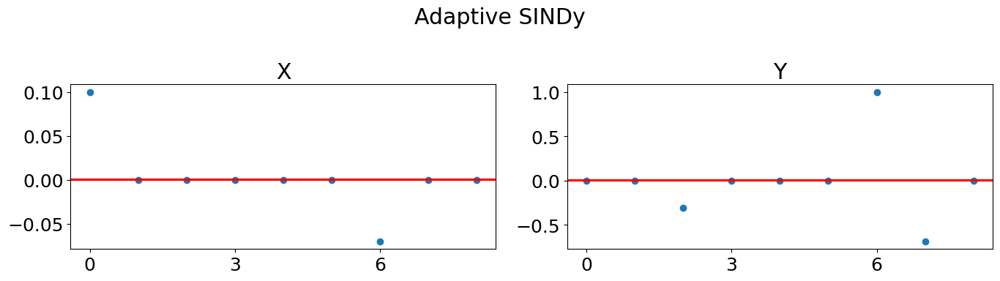

In [11]:
threshold = 0.0005
#****************************************************************************#
loc = plticker.MultipleLocator(base=3) # this locator puts ticks at regular intervals
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize =(14, 4))
fig.suptitle('Adaptive SINDy')

ax[0].plot(COEFF_ADT [:, 0].detach().cpu().numpy(), 'o')
ax[0].set_title('X')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[0].xaxis.set_major_locator(loc)

ax[1].plot(COEFF_ADT [:, 1].detach().cpu().numpy(), 'o')
ax[1].set_title('Y')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[1].xaxis.set_major_locator(loc)

fig.subplots_adjust(top=0.8)
fig.tight_layout()
plt.show()


In [12]:
print(COEFF_ADT[:, 0])
print(COEFF_ADT[:, 1])
print(XEXP_ADT [:, 0])
print(XEXP_ADT [:, 1])

tensor([ 0.1000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0700,  0.0000,
         0.0000], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0000,  0.0000, -0.3098,  0.0000,  0.0000,  0.0000,  1.0000, -0.6902,
         0.0000], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([-3.2973,  1.0150], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([-1.4293e-04,  1.0250e+00], device='cuda:0', grad_fn=<SelectBackward0>)


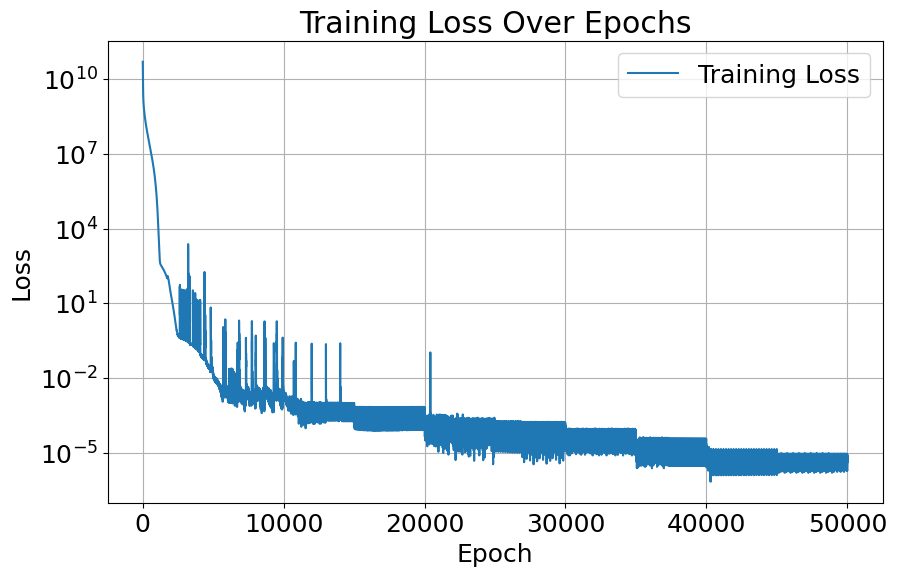

In [13]:
plt.figure(figsize=(10, 6))
plt.plot(Loss_data.numpy(), label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()